# Imports & General settings
change paths for your environments and folder architecture

In [1]:
%%time
# Standard library imports
import glob
import logging as log
import os
import sys

# Third party imports
from adjustText import adjust_text
%matplotlib inline
import matplotlib.pyplot as plt
import nglview as nv
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from scipy.stats import spearmanr
import sklearn
from sklearn.metrics import mean_squared_error, accuracy_score,roc_auc_score, roc_curve
from sklearn.preprocessing import minmax_scale
import squarify

# Local application imports

log_message="verbose"

if log_message=="verbose":
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.INFO
    )
elif log_message=="debug":
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.WARNING
    )
else:
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.ERROR
    )

logger = log.getLogger(__name__)


CPU times: user 3.44 s, sys: 5.46 s, total: 8.9 s
Wall time: 1.99 s


In [ ]:
# General settings

saving_dir_flag = 'projects/Xray_calc'

basepath = 
shared_basepath = 
path_to_prism_exec_dir = '_path_to_software_/PRISM_tools/rosetta_stability-v0.1.1/'

# Local application imports
try:
    sys.path.insert(1, os.path.join(path_to_prism_exec_dir, 'software/rosetta_ddG_pipeline'))
    from mp_helper import extract_from_opm
    
    sys.path.insert(1, os.path.join(path_to_prism_exec_dir, 'software/scripts'))
    from prism_parser_helper import read_prism, merge_prism_df
    from pdb_to_prism import download_pdb, rosetta_energy_to_prism
    from FillVariants import copy_wt_variants
    from PrismData import PrismParser

except (ModuleNotFoundError, ImportError) as e:
    logger.error("{} fileure".format(type(e)))
    print(e)
else:
    logger.info("Import succeeded")


In [3]:
working_dir = os.path.join(basepath, saving_dir_flag)
os.makedirs(working_dir, exist_ok=True)

plots_dir = os.path.join(working_dir, 'plots')
os.makedirs(plots_dir, exist_ok=True)

tables_dir = os.path.join(working_dir, 'tables')
os.makedirs(tables_dir, exist_ok=True)

input_dir = os.path.join(working_dir, 'input')
os.makedirs(input_dir, exist_ok=True)

gnomAD_cutoff_value = float('7.097735196763732e-05')

stats_file = os.path.join(working_dir, 'tables', '2022_05_04-count_hMP_Clinvar_gnomad_PDB_nonsyndel_df.csv')
rosetta_sci_bench_csv = os.path.join(working_dir, 'tables', 'Rosetta_sci_benchmark.csv')
sm_corr_dfs_csv = os.path.join(working_dir, 'tables', 'rosetta_2021_08_sm_benchmarked_corr_dfs.csv')
csv_file_all_merged_edited = os.path.join(working_dir, 'tables', '2022_05_04-merged_anno_hMP_merged_df_edited.csv')

shared_prism_dir = os.path.join(shared_basepath, 'prism')
pdb_prism_dir = os.path.join(working_dir, 'prism_pdb')
gemme_prism_dir = os.path.join(working_dir, 'prism_gemme')
rosetta_prism_dir = os.path.join(working_dir, 'prism_rosetta')
gemme_dir = os.path.join(working_dir, 'gemme')


In [4]:
# Target list to run on

target_list = [
    ['O15118', 'NPC1', ['Transporter', 'Slc65'], ['5u74-A', '6w5s-A']],
    ['P08100', 'OPSD', ['GPCR', 'A'], ['4zwj-A']],
    ['P11166', 'GTR1', ['Transporter', 'Slc2'], ['6tha-A']],
    ['P16615', 'AT2A2', ['Transporter', 'P'], ['7bt2-A']],
    ['P17787', 'ACHB2', ['Ion channel', 'ligand'], ['5kxi-C']],
    ['P29033', 'CXB2', ['Cell Junction', ''], ['2zw3-A']],
    ['P31213', 'S5A2', ['Enzyme', 'Oxidoreductase'], ['7bw1-A']],
    ['P32245', 'MC4R', ['GPCR', 'A'], ['6w25-A']],
    ['P41181', 'AQP2', ['Ion channel', 'other'], ['4nef-A']],
    ['P43681', 'ACHA4', ['Ion channel', 'ligand'], ['5kxi-A', '6cnj-A', '6usf-A']],
    ['Q8N5M9', 'JAGN1', ['Transporter', 'vesicle-mediated'], ['6wvd-A']],
    ['Q99835', 'SMO', ['GPCR', 'F'], ['5l7d-A']],
    ['Q9H221', 'ABCG8', ['Transporter', 'Atp8'], ['5do7-D']],
    ['Q9H222', 'ABCG5', ['Transporter', 'Atp5'], ['5do7-A']],
    ['Q9H3H5', 'GPT', ['Enzyme', 'Transferase'], ['6fm9-A', '6bw6-B']],
    ['Q9ULV1', 'FZD4', ['GPCR', 'F'], ['6bd4-A']],
]

# Functions

In [5]:
def read_prism(primsfile):
    parser = PrismParser()
    data = parser.read(primsfile)
    return data

In [6]:
def merge_specific_prism(uniprot_id, pdb_id='', pdb_chain=''):
    spliceAI_files = glob.glob(os.path.join(shared_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_spliceai_*_{uniprot_id}*.txt'))
    gnomAD_files = glob.glob(os.path.join(shared_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_gnomad_*{uniprot_id}*.txt'))
    clinvar_files = glob.glob(os.path.join(shared_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_clinvar_*_{uniprot_id}*.txt'))
    uniprot_files = glob.glob(os.path.join(shared_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_uniprot_*{uniprot_id}.txt'))
    pdb_files = glob.glob(os.path.join(pdb_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_pdb_XXX_{uniprot_id}-*.txt'))
    gemme_files = glob.glob(os.path.join(gemme_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_gemme_XXX_{uniprot_id}*txt'))
    rosetta_files = glob.glob(os.path.join(rosetta_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_rosetta_XXX_{uniprot_id}*.txt'))
    rosettapdb_files = glob.glob(os.path.join(rosetta_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_rosettapdb*{uniprot_id}*.txt'))
    
    
    dataframe_list = []
    #uniprot
    if len(uniprot_files) !=0:
        try:
            uniprot = read_prism(uniprot_files[0])
            uniprot.dataframe = copy_wt_variants(uniprot.dataframe, incl_del=True)
            uniprot.dataframe['aa_ref'] = uniprot.dataframe['variant'].apply(lambda x: [x[0]])
            uniprot.dataframe['aa_var'] = uniprot.dataframe['variant'].apply(lambda x: [x[-1]])
            uniprot.dataframe['resi'] = uniprot.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
            uniprot.dataframe['n_mut'] = 1
            dataframe_list.append(uniprot)
        except:
            logger.info(f'error at {uniprot_files}')
    else:
        logger.info(f'no uniprot file at {uniprot_files}')
        return
    #clinvar
    if len(clinvar_files) !=0:
        for clinvar_file in clinvar_files:
            try:
                clinvar = read_prism(clinvar_file)
                dataframe_list.append(clinvar)
            except:
                logger.info(f'error at {clinvar_file}')
    #gnomAD
    if len(gnomAD_files) !=0:
        for gnomAD_file in gnomAD_files:
            try:
                gnomAD = read_prism(gnomAD_file)
                dataframe_list.append(gnomAD)
            except:
                logger.info(f'error at {gnomAD_file}')

    #gemme
    if len(gemme_files) !=0:
        try:
            gemmef = read_prism(gemme_files[0])
            #gemmef.dataframe = copy_wt_variants(gemmef.dataframe, )#incl_del=False)
            gemmef.dataframe['aa_ref'] = gemmef.dataframe['variant'].apply(lambda x: [x[0]])
            gemmef.dataframe['aa_var'] = gemmef.dataframe['variant'].apply(lambda x: [x[-1]])
            gemmef.dataframe['resi'] = gemmef.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
            gemmef.dataframe['n_mut'] = 1
            dataframe_list.append(gemmef)
        except:
            logger.info(f'error at {gemme_files}')

    #rosetta
    if len(rosetta_files) !=0:
        for rosetta_file in rosetta_files:
            if pdb_id!='' and pdb_chain!='':
                if f'{pdb_id.lower()}_{pdb_chain.upper()}' in rosetta_file:
                    try:
                        rosettaf = read_prism(rosetta_file)
                        #rosettaf.dataframe = copy_wt_variants(rosettaf.dataframe, )#incl_del=False)
                        rosettaf.dataframe['aa_ref'] = rosettaf.dataframe['variant'].apply(lambda x: [x[0]])
                        rosettaf.dataframe['aa_var'] = rosettaf.dataframe['variant'].apply(lambda x: [x[-1]])
                        rosettaf.dataframe['resi'] = rosettaf.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                        rosettaf.dataframe['n_mut'] = 1
                        dataframe_list.append(rosettaf)
                    except:
                        logger.info(f'error at {rosetta_file}')
            else:
                try:
                    rosettaf = read_prism(rosetta_file)
                    #rosettaf.dataframe = copy_wt_variants(rosettaf.dataframe, )#incl_del=False)
                    rosettaf.dataframe['aa_ref'] = rosettaf.dataframe['variant'].apply(lambda x: [x[0]])
                    rosettaf.dataframe['aa_var'] = rosettaf.dataframe['variant'].apply(lambda x: [x[-1]])
                    rosettaf.dataframe['resi'] = rosettaf.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                    rosettaf.dataframe['n_mut'] = 1
                    dataframe_list.append(rosettaf)
                except:
                    logger.info(f'error at {rosetta_file}')
                
    #rosettapdb
    if len(rosettapdb_files) !=0:
        for rosettapdb_file in rosettapdb_files:
            try:
                rosettapf = read_prism(rosettapdb_file)
                rosettapf.dataframe = copy_wt_variants(rosettapf.dataframe, )#incl_del=False)
                rosettapf.dataframe['aa_ref'] = rosettapf.dataframe['variant'].apply(lambda x: [x[0]])
                rosettapf.dataframe['aa_var'] = rosettapf.dataframe['variant'].apply(lambda x: [x[-1]])
                rosettapf.dataframe['resi'] = rosettapf.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                rosettapf.dataframe['n_mut'] = 1
                dataframe_list.append(rosettapf)
            except:
                logger.info(f'error at {rosetta_file}')

    #spliceAI
    if len(spliceAI_files) !=0:
        for spliceAI_file in spliceAI_files:
            try:
                spliceAI = read_prism(spliceAI_file)
                dataframe_list.append(spliceAI)
            except:
                logger.info(f'error at {spliceAI_file}')
    #pdb
    if len(pdb_files) !=0:
        pdb_files_unique = []
        for pdb_file in pdb_files:
            if not pdb_file.upper() in pdb_files_unique:
                pdb_files_unique.append(pdb_file.upper())
                try:
                    pdb = read_prism(pdb_file)
                    pdb.dataframe = copy_wt_variants(pdb.dataframe, incl_del=True)
                    pdb.dataframe['aa_ref'] = pdb.dataframe['variant'].apply(lambda x: [x[0]])
                    pdb.dataframe['aa_var'] = pdb.dataframe['variant'].apply(lambda x: [x[-1]])
                    pdb.dataframe['resi'] = pdb.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                    pdb.dataframe['n_mut'] = 1
                    pdb.dataframe['ID'] = pdb_file.split(uniprot_id)[-1][1:-4]
                    pdb.metadata['columns']['ID'] = 'PDB_ID + chain'
                    dataframe_list.append(pdb)
                except:
                    logger.info(f'error at {pdb_file}')

    if len(dataframe_list) > 1:
        #try:
        all_merged = merge_prism_df(dataframe_list, identity=0.7)
        #except:
        #    return
    else:
        return

    key_dic = {}
    new_columns = {}
    for key in all_merged.metadata['merged']:
        num = key.split("_")[1]
        name = all_merged.metadata['merged'][key].split('_')[1]
        if all_merged.metadata['merged'][key].split('.txt')[0].endswith('cartesian'):
            name = f"{name};cart"
        for column in all_merged.metadata['columns']:
            if column.endswith(num):
                key_dic[column] = f'{name};{column}'
                new_columns[f'{name};{column}'] = all_merged.metadata['columns'][column]

    all_merged.dataframe.rename(columns=key_dic, inplace=True)
    all_merged.metadata['columns'] = new_columns
    #modify pdb IDs
    pdb_ids = [elem for elem in all_merged.dataframe.columns if elem.startswith('pdb;ID_')]
    all_merged.dataframe[f'pdb;IDs'] = all_merged.dataframe[pdb_ids].apply(
        lambda x: '|'.join(list(set(x.astype(str)))), axis=1)
    all_merged.dataframe = all_merged.dataframe.drop(columns=pdb_ids)
    for key in pdb_ids:
        all_merged.metadata['columns'].pop(key)
    all_merged.metadata['columns']['pdb;IDs'] = 'PDB_ID + chain'
    #removing no-values from FillVariants
    non_relevant = [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('uniprot')] + [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('pdb')]
    non_relevant = list(np.unique(non_relevant))
    tmp_df1 = all_merged.dataframe.copy()
    tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
    tmp_df2 = all_merged.dataframe.copy()
    tmp_df2 = tmp_df2.drop(columns=non_relevant)
    tmp_df2.dropna(axis=0, how='all', inplace=True, thresh=6)
    new_clean = pd.merge(tmp_df1, tmp_df2, how='right', on='variant')
    new_clean = new_clean.dropna(axis='columns', how ='all')
    all_merged.dataframe = new_clean
    drop_meta_columns = [key for key in all_merged.metadata['columns'].keys() if not key in all_merged.dataframe.columns]
    for key in drop_meta_columns:
        all_merged.metadata['columns'].pop(key)

    return all_merged

In [7]:
def write_to_csv_spec(target_dic_here, filename_xlsx):
    Excelwriter = pd.ExcelWriter(os.path.join(tables_dir, filename_xlsx),engine="xlsxwriter")
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        logger.info(f'#accession: {target_uniprot}')
        df = target_dic_here[target_uniprot].copy()
        df.to_excel(Excelwriter, sheet_name=target_uniprot,index=False)
    Excelwriter.save()

In [8]:
def classify_control(x):
    if x in ['benign','gnomad_high']:
        return 0
    elif x in ['pathogenic', ]:#'gnomad_low']:
        return 1

In [9]:
def calculate_AUC_error(control_df, nameA='rosetta;ddG', nameB='gemme;score', runs=1000):

    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_test_score2 = control_df[nameB].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    base_auc2 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score2)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)
    fpr2, tpr2, thresholds2 = sklearn.metrics.roc_curve(base_control_score, base_test_score2)

    results_rosetta = []
    results_gemme = []
    i = 0

    size_groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
    size_groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
    if size_groupA < size_groupB:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==1].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==0].reset_index(drop=True)
        size = size_groupA
    else:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==0].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==1].reset_index(drop=True)
        size = size_groupB
    while i < runs:
        i += 1
        new_large_df = large_df.copy()
        new_large_df = new_large_df.sample(n=size)
        df_subset = pd.concat([new_large_df, small_df], ignore_index=True)

        control_score = np.copy(df_subset['score'].values)
        test_score1 = df_subset[nameA].values
        test_score2 = df_subset[nameB].values
        auc1 = sklearn.metrics.roc_auc_score(control_score, test_score1)
        auc2 = sklearn.metrics.roc_auc_score(control_score, test_score2)
        results_rosetta.append(float(auc1))
        results_gemme.append(float(auc2))

    results_rosetta = np.array(results_rosetta)
    results_rosetta = results_rosetta[~np.isnan(results_rosetta)]
    y_true_rosetta = [float(base_auc1)] * len(results_rosetta)
    mse_rosetta = mean_squared_error(results_rosetta, y_true_rosetta)

    results_gemme = np.array(results_gemme)
    results_gemme = results_gemme[~np.isnan(results_gemme)]
    y_true_gemme = [float(base_auc2)] * len(results_gemme)
    mse_gemme = mean_squared_error(results_gemme, y_true_gemme)

    return {'rosetta': [base_auc1, mse_rosetta, np.std(results_rosetta), thresholds1], 'gemme': [base_auc2, mse_gemme, np.std(results_gemme), thresholds2]}

In [10]:
def disease_ROC(control_df, control, test1, test2, plots_dir, target, region, title='', cutoff='1.0e-4', satu='', groupA=0, groupB=0, nameA='rosetta;ddG', nameB='gemme;score'):
    a4_dims = (7,7)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)

    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])
    #ax.set_prop_cycle(color=['Set2'])


    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('FPR (1-specificity)', fontsize=19)
    ax.set_ylabel('TPR (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.title(f'{target} (region={region}, cutoff={cutoff}{satu})', fontsize=18)



    auc_dic = calculate_AUC_error(control_df, nameA=nameA, nameB=nameB, runs=1000)

    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['rosetta'][0]#sklearn.metrics.roc_auc_score(control, test1)
    auc1_mse = auc_dic['rosetta'][1]
    auc1_std = auc_dic['rosetta'][2]
    auc1_threshold = auc_dic['rosetta'][3]
#    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (rosetta): {auc1:.2f}, MSE: {auc1_mse:.2f}, std: {auc1_std:.2f}', linestyle='-', linewidth=1.2, color='mediumvioletred')
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (rosetta): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=1.2, color='mediumvioletred')

    roc_curve2 = sklearn.metrics.roc_curve(control,test2)
    auc2 = auc_dic['gemme'][0] #sklearn.metrics.roc_auc_score(control, test2)
    auc2_mse = auc_dic['gemme'][1]
    auc2_std = auc_dic['gemme'][2]
    auc2_threshold = auc_dic['gemme'][3]
#    plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (gemme): {auc2:.2f}, MSE: {auc2_mse:.2f}, std: {auc2_std:.2f}', linestyle='-', linewidth=1.2, color='teal')
    plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (gemme): {auc2:.2f}'+r'$\pm$'+f'{auc2_std:.2f}', linestyle='-', linewidth=1.2, color='teal')


    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=16, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    if satu !='':
        satu = '_sat'
    fig.text(0.15, 0.8, f'Group A: {groupA}\nGroup B: {groupB}', fontsize=16)
    filename = os.path.join(plots_dir, f'ROC_{cutoff}_{title}{satu}.png')
    plt.savefig(filename, transparent=True)
    plt.show()
    return auc_dic

In [11]:
def calculate_AUC_error_single(control_df, nameA='gnomad;AF_tot_first', runs=1000):

    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)
    results_rosetta = []
    i = 0
    size_groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
    size_groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
    if size_groupA < size_groupB:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==1].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==0].reset_index(drop=True)
        size = size_groupA
    else:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==0].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==1].reset_index(drop=True)
        size = size_groupB
    while i < runs:
        i += 1
        new_large_df = large_df.copy()
        new_large_df = new_large_df.sample(n=size)
        df_subset = pd.concat([new_large_df, small_df], ignore_index=True)

        control_score = np.copy(df_subset['score'].values)
        test_score1 = df_subset[nameA].values
        auc1 = sklearn.metrics.roc_auc_score(control_score, test_score1)
        results_rosetta.append(float(auc1))

    results_rosetta = np.array(results_rosetta)
    results_rosetta = results_rosetta[~np.isnan(results_rosetta)]
    y_true_rosetta = [float(base_auc1)] * len(results_rosetta)
    mse_rosetta = mean_squared_error(results_rosetta, y_true_rosetta)

    return {'gnomAD': [base_auc1, mse_rosetta, np.std(results_rosetta), thresholds1], }


def disease_ROC_adapted_gnomad(control_df, control, test1, groupA=0, groupB=0, nameA='gnomad;AF_tot_first'):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)

    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])

    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('false positive rate (1-specificity)', fontsize=19)
    ax.set_ylabel('true positive rate (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    auc_dic = calculate_AUC_error_single(control_df, nameA=nameA, runs=10)#00
    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['gnomAD'][0]
    auc1_mse = auc_dic['gnomAD'][1]
    auc1_std = auc_dic['gnomAD'][2]
    auc1_threshold = auc_dic['gnomAD'][3]
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (gnomAD): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')
    y_test = np.copy(control_df['score'].values)
    final_pred = control_df[nameA].values
    print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
    False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
    False_pos_rate, True_pos_rate, threshold
    acc = []
    for thres in threshold:
        y_pred = np.where(final_pred>thres,1,0)
        acc.append(accuracy_score(y_test,y_pred,normalize=True))

    acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
    acc.columns = ['threshold','accuracy']
    acc.sort_values(by="accuracy", ascending=False, inplace = True)
    max_accuracy1 = acc['accuracy'].max()
    cutoff1 = acc.loc[(acc['accuracy']==max_accuracy1), 'threshold'].mean()#.head()

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    fig.text(0.25, 0.75, f'pathogenic: {groupA}\nbenign: {groupB}', fontsize=18)
    plt.savefig(os.path.join(plots_dir,'FigSXX1B-roc-gnomad.svg'))
    plt.show()
    return auc_dic, max_accuracy1, cutoff1


def clinvar_class_anno5(x, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['benign', ]:
                return 0
            elif subx in [ 'pathogenic']:
                return 1
            else:
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return None
    return None


In [12]:
def special_class(x):
    special = []
    disulfid_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;DISULFID')], how='all')['resis'].unique()
    metal_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;METAL')], how='all')['resis'].unique()
    palmitoyl_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;LIPID')], how='all')['resis'].unique()
    modified_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;MOD_RES')], how='all')['resis'].unique()
    carbohydroxy_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;CARBOHYD')], how='all')['resis'].unique()
    if x['resis'] in disulfid_resis:
        special.append('disulfid')
    if x['resis'] in metal_binding_resis:
        special.append('metal')
    if x['resis'] in palmitoyl_binding_resis:
        special.append('lipid')
    if x['resis'] in modified_binding_resis:
        special.append('mod')
    if x['resis'] in carbohydroxy_resis:
        special.append('carbohyd')
    return "|".join(special)


def special_class_detail(x):
    special = []
    disulfid_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;DISULFID')], how='all')['resis'].unique()
    metal_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;METAL')], how='all')['resis'].unique()
    palmitoyl_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;LIPID')], how='all')['resis'].unique()
    modified_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;MOD_RES')], how='all')['resis'].unique()
    carbohydroxy_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;CARBOHYD')], how='all')['resis'].unique()
    if x['resis'] in disulfid_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;DISULFID')][0]])
    if x['resis'] in metal_binding_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;METAL')][0]])
    if x['resis'] in palmitoyl_binding_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;LIPID')][0]])
    if x['resis'] in modified_binding_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;MOD_RES')][0]])
    if x['resis'] in carbohydroxy_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;CARBOHYD')][0]])
    return "|".join(special)


def make_property(x):
    if x in ['R', 'H', 'K']:
        return 'positive'
    elif x in ['D', 'E']:
        return 'negative'
    elif x in ['S', 'T', 'N', 'Q']:
        return 'polar'
    elif x in ['C', 'U', 'G', 'P']:
        return 'special'
    elif x in ['A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W']:
        return 'hydrophobic'
    
    
def make_property2(x):
    if x in ['R', 'H', 'K', 'D', 'E']:
        return 'charged'
    elif x in ['S', 'T', 'N', 'Q']:
        return 'polar'
    elif x in ['C', 'U', 'G', 'P']:
        return 'special'
    elif x in ['A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W']:
        return 'hydrophobic'

    
def gnomad_class(x, split_val=gnomAD_cutoff_value, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['benign', 'pathogenic']:#['VUS', 'conflict', 'benign', 'pathogenic']):
                return subx
            else:
                if not subx in ['VUS', 'conflict']:
                    if subx != '':
                        subx = float(subx)
                        if subx < float(split_val):
                            return 'gnomad_low'
                        else:
                            return 'gnomad_high'
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return subx
    return np.nan


def sasa(x):
    if x < 1/3.:
        return 'buried'
    elif x >= 1/3.:#
        return 'solvent-accessible'
    else:
        ''


In [13]:
def read_gemme_cov(target_uniprot, gemme_dir):
    base=False
    gemme_align = glob.glob(os.path.join(gemme_dir, target_uniprot, 'run', 'hhblits_run', f"hhblits_*_filtered.fasta"))[0]
    total_count = 0
    
    with open(gemme_align, 'r') as fp:
        for line in fp:
            if base:
                if not line.startswith('>'):
                    line = line.strip()
                    print(len(line))
                    target_seq = [0]*len(line)
                base=False
            else:
                if line.startswith('>sp'):
                    base=True
                elif not line.startswith('>'):
                    total_count +=1
                    line = line.strip()
                    for index, AA in enumerate(line):
                        if AA != '-':
                            target_seq[index] +=1
    #logger.info(f"total count of sequences: {total_count}")
    #logger.info(f"count of non-gap per AA of target sequence: {target_seq}")
    #logger.info(len(range(1,len(target_seq)+1)))
    gemme_seq_df = pd.DataFrame(data=list(map(list, zip(*[target_seq, range(1,len(target_seq)+1)]))), columns=['gemme;count', 'res'])
    gemme_seq_df['gemme;total'] = total_count
    gemme_seq_df['gemme;coverage_perc'] = (gemme_seq_df['gemme;count']/gemme_seq_df['gemme;total']).round(4)
    gemme_seq_df['gemme;seqperlen'] = (gemme_seq_df['gemme;count']/len(target_seq)).round(4)
    gemme_seq_df['gemme;coverage_count'] = gemme_seq_df['gemme;count']
    return gemme_seq_df

In [14]:
def gnomad_class_anno5(x, split_val=gnomAD_cutoff_value, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['benign', ]:
                return 0
            elif subx in [ 'pathogenic']:
                return 1
            else:
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return None
        for subx in x:
            if not subx in ['benign', 'pathogenic', 'VUS', 'conflict']:
                if subx != '':
                    subx = float(subx)
                    if subx > float(split_val):
                        return 0
                    else:
                        return None
    return None

In [15]:
def check_gemme_seq(target_list):
    seq_count = [['accession', 'sequence_count']]
    for targetID, target in enumerate(target_list):
        count = 0
        accessionID, accessionName, classlist, pdblist = target
        gemme_workdir_target = os.path.join(gemme_workdir, accessionID)
        gemme_run_dir = os.path.join(gemme_workdir_target, 'run')
        input_file = glob.glob(os.path.join(gemme_run_dir, 'hhblits_run', 'hhblits*_filtered.fasta'))[0]
        with open(input_file, 'r')as fp:
            for line in fp:
                if line.startswith('>tr'):
                    count +=1
        seq_count.append([accessionID, count])
    return pd.DataFrame(data = seq_count[1:], columns=seq_count[0])

In [16]:
def cutoff_checks(control_df, nameA='rosetta;ddG', nameB='gemme;score', cutoffA=2.0, cutoffB=0.4):
    
    backup_df = control_df.copy()
    
    base_auc_dic = calculate_AUC_error(backup_df, nameA=nameA, nameB=nameB, runs=1000)
    base_rosetta_auc = int(base_auc_dic['rosetta'][0]*100)
    base_gemme_auc = int(base_auc_dic['gemme'][0]*100)
    
    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_test_score2 = control_df[nameB].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    base_auc2 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score2)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)
    fpr2, tpr2, thresholds2 = sklearn.metrics.roc_curve(base_control_score, base_test_score2)
    gmeans1 = np.sqrt(tpr1 * (1-fpr1))
    ix1 = np.argmax(gmeans1)
    cutoffA = thresholds1[ix1]
    gmeans2 =np. sqrt(tpr2 * (1-fpr2))
    ix2 = np.argmax(gmeans2)
    cutoffB = thresholds2[ix2]
    
    ddG_ddE_condition = (((control_df['score']==0) & (control_df[nameA]<=cutoffA) & (control_df['score']==0) & (control_df[nameB]<=cutoffB)) | 
                          ((control_df['score']==1) & (control_df[nameA]>cutoffA) & (control_df['score']==1) & (control_df[nameB]>cutoffB)))
    ddG_ddE = control_df.loc[ddG_ddE_condition, 'variant']
    ddG_condition = (((control_df['score']==0) & (control_df[nameA]<=cutoffA) & (control_df['score']==0) & (control_df[nameB]>cutoffB)) | 
                          ((control_df['score']==1) & (control_df[nameA]>cutoffA) & (control_df['score']==1) & (control_df[nameB]<=cutoffB)))
    ddG = control_df.loc[ddG_condition, 'variant']
    ddE_condition = (((control_df['score']==0) & (control_df[nameA]>cutoffA) & (control_df['score']==0) & (control_df[nameB]<=cutoffB)) | 
                          ((control_df['score']==1) & (control_df[nameA]<=cutoffA) & (control_df['score']==1) & (control_df[nameB]>cutoffB)))
    ddE = control_df.loc[ddE_condition, 'variant']
    both_not = control_df.loc[~(ddG_condition | ddE_condition | ddG_ddE_condition), 'variant']
    
    return ddG_ddE, ddG, ddE, both_not, cutoffA, cutoffB


def return_variant_in_cat(control_df, nameA='rosetta;ddG', nameB='gemme;score', cutoffA=2.0, cutoffB=0.4):
    
    control_df['variant2'] = control_df['uniprot;ID']+'_'+control_df['variant']
    #patho
    q2_A_condition = ((control_df['score']==1) & ((control_df[nameA]<cutoffA) & (control_df[nameB]>=cutoffB)))
    q2_A = control_df.loc[q2_A_condition, 'variant2']
    q1_A_condition = ((control_df['score']==1) & ((control_df[nameA]>=cutoffA) & (control_df[nameB]>=cutoffB)))
    q1_A = control_df.loc[q1_A_condition, 'variant2']
    q4_A_condition = ((control_df['score']==1) & ((control_df[nameA]>=cutoffA) & (control_df[nameB]<cutoffB)))
    q4_A = control_df.loc[q4_A_condition, 'variant2']
    q3_A_condition = ((control_df['score']==1) & ((control_df[nameA]<cutoffA) & (control_df[nameB]<cutoffB)))
    q3_A = control_df.loc[q3_A_condition, 'variant2']
    
    #benign
    q2_B_condition = ((control_df['score']==0) & ((control_df[nameA]<cutoffA) & (control_df[nameB]>=cutoffB)))
    q2_B = control_df.loc[q2_B_condition, 'variant2']
    q1_B_condition = ((control_df['score']==0) & ((control_df[nameA]>=cutoffA) & (control_df[nameB]>=cutoffB)))
    q1_B = control_df.loc[q1_B_condition, 'variant2']
    q4_B_condition = ((control_df['score']==0) & ((control_df[nameA]>=cutoffA) & (control_df[nameB]<cutoffB)))
    q4_B = control_df.loc[q4_B_condition, 'variant2']
    q3_B_condition = ((control_df['score']==0) & ((control_df[nameA]<cutoffA) & (control_df[nameB]<cutoffB)))
    q3_B = control_df.loc[q3_B_condition, 'variant2']
    
    return q1_A, q2_A, q3_A, q4_A, q1_B, q2_B, q3_B, q4_B, cutoffA, cutoffB

In [17]:
def disease_ROC_adapted(control_df, control, test1, test2, target, region, title='', 
                        cutoff=gnomAD_cutoff_value, satu='', groupA=0, groupB=0, 
                        nameA='rosetta;ddG', nameB='gemme;score', runs=1000):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)
    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])
    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('false positive rate (1-specificity)', fontsize=19)
    ax.set_ylabel('true positive rate (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    auc_dic = calculate_AUC_error(control_df, nameA=nameA, nameB=nameB, runs=runs)

    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['rosetta'][0]
    auc1_mse = auc_dic['rosetta'][1]
    auc1_std = auc_dic['rosetta'][2]
    auc1_threshold = auc_dic['rosetta'][3]
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (∆∆G): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')

    y_test = np.copy(control_df['score'].values)
    final_pred = control_df[nameA].values
    print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
    False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
    False_pos_rate, True_pos_rate, threshold

    acc = []
    for thres in threshold:
        y_pred = np.where(final_pred>thres,1,0)
        acc.append(accuracy_score(y_test,y_pred,normalize=True))

    acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
    acc.columns = ['threshold','accuracy']
    acc.sort_values(by="accuracy", ascending=False, inplace = True)
    max_accuracy1 = acc['accuracy'].max()
    cutoff1 = acc.loc[(acc['accuracy']==max_accuracy1), 'threshold'].mean()#.head()

    roc_curve2 = sklearn.metrics.roc_curve(control,test2)
    auc2 = auc_dic['gemme'][0] 
    auc2_mse = auc_dic['gemme'][1]
    auc2_std = auc_dic['gemme'][2]
    auc2_threshold = auc_dic['gemme'][3]
    plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (∆∆E): {auc2:.2f}'+r'$\pm$'+f'{auc2_std:.2f}', linestyle='-', linewidth=3.5, color='#998ec3')

    y_test = np.copy(control_df['score'].values)
    final_pred = control_df[nameB].values
    print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
    False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
    False_pos_rate, True_pos_rate, threshold

    acc = []
    for thres in threshold:
        y_pred = np.where(final_pred>thres,1,0)
        acc.append(accuracy_score(y_test,y_pred,normalize=True))

    acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
    acc.columns = ['threshold','accuracy']
    acc.sort_values(by="accuracy", ascending=False, inplace = True)
    max_accuracy2 = acc['accuracy'].max()
    cutoff2 = acc.loc[(acc['accuracy']==max_accuracy2), 'threshold'].mean()#.head()

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    if satu !='':
        satu = '_sat'
    fig.text(0.15, 0.8, f'Group A: {groupA}\nGroup B: {groupB}', fontsize=18)
    plt.title(f'{title}', fontsize=18)
    filename = os.path.join(plots_dir, f'{region}.svg')
    plt.savefig(filename, )
    plt.show()
    return auc_dic, max_accuracy1, cutoff1, max_accuracy2, cutoff2

In [18]:
def disease_ROC_adapted_all_except(control_df, control_df2, control, control2, test1, test2, test3, target, region, title='', 
                                   cutoff=gnomAD_cutoff_value, satu='', groupA=0, groupB=0, groupA2=0, groupB2=0, 
                           nameA='rosetta;ddG', nameB='gemme;score'):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)

    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])

    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('FPR (1-specificity)', fontsize=19)
    ax.set_ylabel('TPR (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.title(title)

    auc_dic = calculate_AUC_error(control_df, nameA=nameA, nameB=nameB, runs=1000)

    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['rosetta'][0]
    auc1_mse = auc_dic['rosetta'][1]
    auc1_std = auc_dic['rosetta'][2]
    auc1_threshold = auc_dic['rosetta'][3]
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (∆∆G): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')

    auc_dic3 = calculate_AUC_error(control_df2, nameA=nameA, nameB=nameB, runs=1000)
    roc_curve3 = sklearn.metrics.roc_curve(control2,test3)
    auc3 = auc_dic3['rosetta'][0] 
    auc3_mse = auc_dic3['rosetta'][1]
    auc3_std = auc_dic3['rosetta'][2]
    auc3_threshold = auc_dic3['rosetta'][3]
    plt.plot(roc_curve3[0],roc_curve3[1], label=f'AUC (∆∆G_subset): {auc3:.2f}'+r'$\pm$'+f'{auc3_std:.2f}', linestyle='-', linewidth=3.5, color='#e8c598')

    roc_curve2 = sklearn.metrics.roc_curve(control,test2)
    auc2 = auc_dic['gemme'][0] 
    auc2_mse = auc_dic['gemme'][1]
    auc2_std = auc_dic['gemme'][2]
    auc2_threshold = auc_dic['gemme'][3]
    plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (∆∆E): {auc2:.2f}'+r'$\pm$'+f'{auc2_std:.2f}', linestyle='-', linewidth=3.5, color='#998ec3')
   
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    if satu !='':
        satu = '_sat'
    fig.text(0.15, 0.825, f'Group A: {groupA} (subset: {groupA2})\nGroup B: {groupB} (subset: {groupB2})', fontsize=18)
    plt.show()
    return auc_dic

In [19]:
def gnomad_class_anno3(x, split_val=gnomAD_cutoff_value, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['VUS','benign', 'pathogenic']:
                return subx
            else:
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return 'VUS'
        for subx in x:
            if not subx in ['benign', 'pathogenic', 'VUS', 'conflict']:
                if subx != '':
                    subx = float(subx)
                    return 'VUS'

In [20]:
def fishtail_plot_adapt3(tmp, min_y, max_y, labeling=False):
    
    SMALL_SIZE = 16
    MEDIUM_SIZE = 16
    BIGGER_SIZE = 16

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
    with sns.axes_style("white"):#("whitegrid")
        colors = ['white', 'green', 'red', 'grey', 'cornflowerblue','darkblue', 'cornflowerblue', 'lightblue']
        f, axs = plt.subplots(1,2,
                              figsize=(18,7.5),
                              sharey=True,
                              sharex=False,
                             gridspec_kw=dict(width_ratios=[0.5,7], wspace=0.01))
        ax1 = axs[0]
        ax2 = axs[1]
        tmp2 = tmp.copy()
        tmp2 = tmp2[~tmp2['label'].isin(['gnomad_high', 'gnomad_low'])].reset_index(drop=True)
        tmp2 = tmp2[tmp2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
        fig1 = sns.scatterplot(y = "rosetta;ddG", x = "label", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                               palette=colors[:3],
                                     alpha=0.65, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax1,
                             legend=False, x_jitter=True, y_jitter=True,
                               )

        ax1.set(xlim=(-1,4))
        ax1.set_xticks([])
        ax1.set_xlabel('')
        ax1.spines['right'].set_visible(False)
        ax1.spines['top'].set_visible(False)

        tmp['gnomad;AF_tot_first'] = tmp["gnomad;AF_tot_all"].apply(lambda x: float(x))
        tmp2 = tmp.copy()
        tmp2 = tmp2.loc[tmp2['label']=='VUS'].reset_index(drop=True)
        fig2 = sns.scatterplot(y = "rosetta;ddG", x = "gnomad;AF_tot_first", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                                       palette=colors[:3],
                                     alpha=0.65, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax2, legend=False
                               )

        tmp2 = tmp.copy()
        tmp2 = tmp2.loc[tmp2['label']!='VUS'].reset_index(drop=True)
        fig2 = sns.scatterplot(y = "rosetta;ddG", x = "gnomad;AF_tot_first", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                                       palette=colors[:3],
                                     alpha=1, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax2
                               )

        if labeling:
            texts = []
            for line in range(0,tmp.shape[0]):
                if tmp['label'][line] in ['benign', 'pathogenic']:
                    texts.append(ax2.text(tmp['gnomad;AF_tot_first'][line], tmp['rosetta;ddG'][line]+0.2, tmp['variant'][line], horizontalalignment='left', size='medium', color='black'))

        ax2.spines['top'].set_visible(False)
        ax2.spines['left'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.tick_params(labelleft=False)

        d = .01#5  # proportion of vertical to horizontal extent of the slanted line
        d2 = .02
        kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
        ax1.plot((1-d,1+d), (-d,+d), **kwargs)

        kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
        ax2.plot((-d,+d), (-d,+d), **kwargs)
        ax2.set(xscale="log")
        plt.xlabel('gnomAD allele frequency')
        ax1.set(ylabel='Rosetta ∆∆G [REU]')

        plt.gca().legend().set_title('')

#    filename = os.path.join(plots_dir, f'fishtail_ddG_gnomAD-{target_uniprot}_{region}{satu}.png')
#    plt.savefig(filename, transparent=True)
    plt.show()

In [21]:
def fishtail_plot_adapt3b(tmp, min_y, max_y, labeling=False):
    
    SMALL_SIZE = 16
    MEDIUM_SIZE = 16
    BIGGER_SIZE = 16
    with sns.axes_style("white"):#("whitegrid")
        plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
        plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
        plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
        plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
        plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
        plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
        plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

        colors = ['white', 'green', 'red', 'grey', 'cornflowerblue','darkblue', 'cornflowerblue', 'lightblue']
        f, axs = plt.subplots(1,2,
                              figsize=(18,7.5),
                              sharey=True,
                              sharex=False,
                             gridspec_kw=dict(width_ratios=[0.5,7], wspace=0.01))
        ax1 = axs[0]
        ax2 = axs[1]
        tmp2 = tmp.copy()
        tmp2 = tmp2[~tmp2['label'].isin(['gnomad_high', 'gnomad_low'])].reset_index(drop=True)
        tmp2 = tmp2[tmp2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
        fig1 = sns.scatterplot(y = "gemme;score", x = "label", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                               palette=colors[:3],
                                     alpha=0.65, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax1,
                             legend=False, x_jitter=True, y_jitter=True,
                               )

        ax1.set(xlim=(-1,4))
        ax1.set_xticks([])
        ax1.set_xlabel('')
        ax1.spines['right'].set_visible(False)
        ax1.spines['top'].set_visible(False)

        tmp['gnomad;AF_tot_first'] = tmp["gnomad;AF_tot_all"].apply(lambda x: float(x))
        tmp2 = tmp.copy()
        tmp2 = tmp2.loc[tmp2['label']=='VUS'].reset_index(drop=True)
        fig2 = sns.scatterplot(y = "gemme;score", x = "gnomad;AF_tot_first", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                                       palette=colors[:3],
                                     alpha=0.65, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax2, legend=False
                               )

        tmp2 = tmp.copy()
        tmp2 = tmp2.loc[tmp2['label']!='VUS'].reset_index(drop=True)
        fig2 = sns.scatterplot(y = "gemme;score", x = "gnomad;AF_tot_first", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                                       palette=colors[:3],
                                     alpha=1, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax2
                               )

        if labeling:
            texts = []
            for line in range(0,tmp.shape[0]):
                if tmp['label'][line] in ['benign', 'pathogenic']:
                    texts.append(ax2.text(tmp['gnomad;AF_tot_first'][line], tmp['rosetta;ddG'][line]+0.2, tmp['variant'][line], horizontalalignment='left', size='medium', color='black'))

        ax2.spines['top'].set_visible(False)
        ax2.spines['left'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.tick_params(labelleft=False)

        d = .01#5  # proportion of vertical to horizontal extent of the slanted line
        d2 = .02
        kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
        ax1.plot((1-d,1+d), (-d,+d), **kwargs)

        kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
        ax2.plot((-d,+d), (-d,+d), **kwargs)
        ax2.set(xscale="log")
        plt.xlabel('gnomAD allele frequency')
        ax1.set(ylabel='Gemme ∆∆E score')

        plt.gca().legend().set_title('')
    #    filename = os.path.join(plots_dir, f'fishtail_ddG_gnomAD-{target_uniprot}_{region}{satu}.png')
    #    plt.savefig(filename, transparent=True)
    plt.show()

In [22]:
def median_position_plot(df, x_lab, x_label, target, region, target_plot_dir, satu='', fig_name='', cutoff=0):
    grouped_AA = {"R":1, "H":2, "K":3, "D":4, "E":5, "S":6, "T":7, 
              "N":8, "Q":9, "C":10, "G":11, "P":12, "A":13, 
              "V":14, "I":15, "L":16, "M":17, "F":18, "Y":19, "W":20}
    grouped_AA_list = ["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]

    tmp3 = df.copy()
    tmp3['from'] = tmp3['variant'].apply(lambda x: x[0])
    tmp3['to'] = tmp3['variant'].apply(lambda x: x[-1])
    tmp3['sorter'] = [grouped_AA[x] for x in tmp3['from']]#.unique()]
    tmp3 = tmp3.sort_values(by = ['sorter'])
    tmp3 = tmp3.drop(columns='sorter')
    tmp3 = tmp3.sort_values(by=['to'])
    
    tmp3['to'] = tmp3['to'].astype("category")
    tmp3['to'].cat.set_categories(grouped_AA_list, inplace=True)
    tmp3.sort_values(['to'])
    
    with sns.axes_style("whitegrid"):#white, dark, whitegrid, darkgrid, ticks
        sns.catplot(data=tmp3, x=x_lab, y='to', kind='box', height=6, aspect=0.7, )#col='label')
        if x_lab == 'rosetta;ddG':
            plt.xlim(-5.5, 15.5)
            plt.axvline(cutoff, linestyle='--')
        else:
            plt.xlim(1.05, -0.05)
            plt.axvline(cutoff, linestyle='--')
        plt.xlabel(f'{x_label} - median {x_label} of position')
        plt.ylabel(f'Target mutation type')
        if satu !='':
            satu = ', saturation run'
        plt.title(f'{target}{fig_name} ({region}{satu})', )#fontsize=18)
        filename = os.path.join(target_plot_dir, f"median_position_{fig_name}{target}{region}.png")
       # plt.savefig(filename, transparent=True)
        plt.show()

# Load and merge data

## load raw data or preprocessed

In [91]:
%%time
filtered_csv_filename_xlsx = '2022_05_05-results_raw-filtered.xlsx'
renamed_csv_filename_xlsx = '2022_05_05-results_raw-renamed.xlsx'

if os.path.isfile(os.path.join(tables_dir, renamed_csv_filename_xlsx)):
    xls = pd.ExcelFile(os.path.join(tables_dir, renamed_csv_filename_xlsx))
    renamed_df_dicts = pd.read_excel(xls, sheet_name=None)
    is_renamed_df_dicts = True
else:
    is_renamed_df_dicts = False

if os.path.isfile(os.path.join(tables_dir, filtered_csv_filename_xlsx)):
    xls = pd.ExcelFile(os.path.join(tables_dir, filtered_csv_filename_xlsx))
    subfiltered_df_dicts = pd.read_excel(xls, sheet_name=None)
    is_subfiltered_df_dicts = True
else:
    is_subfiltered_df_dicts = False


CPU times: user 3min 36s, sys: 5.07 s, total: 3min 41s
Wall time: 3min 41s


## fresh loading, preprocessing & saving (if needed)

### change name convention

In [24]:
%%time
if is_renamed_df_dicts!=True:
    dataframe_dict = dict()
    for targetID, target in enumerate(target_list):
        target_uniprot = target[0]
        target_pdb = target[3][0].split('-')[0]
        target_chain = target[3][0].split('-')[1]
        logger.info(f'#accession: {target_uniprot}')
        target_merged_prism = merge_specific_prism(target_uniprot, pdb_id=target_pdb, pdb_chain=target_chain)

        target_df = target_merged_prism.dataframe.copy()
        target_df['aa_refs'] = target_df['variant'].apply(lambda x: x[0])
        target_df['aa_vars'] = target_df['variant'].apply(lambda x: x[-1])
        target_df['resis'] = target_df['variant'].apply(lambda x: int(x[1:-1]))

        dataframe_dict[target_uniprot] = target_df.copy()
    dataframe_dict[target_uniprot].columns
    len(dataframe_dict)

INFO:#accession: O15118


INFO:#accession: P08100


 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233. -233.
 -233. -233. -233. -233. -233. -233. -233. -233. -2

INFO:#accession: P11166


INFO:#accession: P16615


INFO:#accession: P17787


INFO:#accession: P29033


INFO:#accession: P31213


INFO:#accession: P32245


 -380. -380.]


INFO:#accession: P41181


INFO:#accession: P43681


 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663.]
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 

INFO:#accession: Q8N5M9


INFO:#accession: Q99835


 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097.
 2097. 2097. 2097. 2097. 2097. 2097. 2097. 2097. 20

INFO:#accession: Q9H221


INFO:#accession: Q9H222


INFO:#accession: Q9H3H5


INFO:#accession: Q9ULV1


 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021.
 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021.
 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021. 1021.]
CPU times: user 2min 26s, sys: 2.76 s, total: 2min 29s
Wall time: 2min 32s


In [25]:
cutoff_value=gnomAD_cutoff_value
maxdelta_spliceai_column_global_name = 'maxdelta_spliceai'

In [26]:
%%time
if is_renamed_df_dicts!=True:
    renamed_df_dicts = {}
    for target in target_list:
        target_uniprot = target[0]
        logger.info(f'#accession: {target_uniprot}')

        df = dataframe_dict[target_uniprot].copy()
        df['tmp_resi_var'] = df['variant'].apply(lambda x: x[-1])
        df = df[~ df['tmp_resi_var'].isin(['~', '.', '*', '='])].reset_index(drop=True).drop(columns=['tmp_resi_var'])
        df['resis'] = df['resi'].apply(lambda x: int(x[0]))

        logger.info(f'#number of variants: {len(df["variant"].unique())}')

        try:
            df['uniprot;regions_top'] = df['uniprot;TOPO_DOM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
        except:
            pass
        try:
            df['uniprot;regions_tm'] = df['uniprot;TRANSMEM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
        except:
            pass
        df['uniprot;regions_all'] = df[[elem for elem in df.columns if elem.startswith('uniprot;regions_')]].apply(
            lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)

        clinvar_columns = [elem for elem in df.columns if elem.startswith('clinvar')]
        df['clinvar;significance_all'] = df[[elem for elem in clinvar_columns if elem.startswith('clinvar;Clinvar_signifiance')]].apply(
            lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)

        gnomad_columns = [elem for elem in df.columns if elem.startswith('gnomad')]
        df['gnomad;AF_tot_all'] = df[[elem for elem in gnomad_columns if elem.startswith('gnomad;AF_tot')]].apply(
            lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)

        pdb_columns = [elem for elem in df.columns if elem.startswith('pdb')]
        df['pdb;SS_all'] = df[[elem for elem in pdb_columns if elem.startswith('pdb;SS_')]].apply(
            lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)

        df = df.replace(to_replace=[''], value=np.nan)
        df = df.replace(to_replace=['nan'], value=np.nan)
        df = df.replace(to_replace=[None], value=np.nan)

        df['gnomad;label'] = df['gnomad;AF_tot_all']
        df['gnomad;label'] = df['gnomad;label'].apply(lambda x: 'gnomad' if not x in [np.nan, 'nan', None] else x)
        df['label'] = df[['clinvar;significance_all', 'gnomad;label']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        df['label'] = df['label'].apply(lambda x: 'unknown' if x=='' else x)
        logger.info(df['label'].unique())

        df['label_class'] = df[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        df['label_class'] = df['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))
        df['score'] = df['label_class'].apply(lambda x: classify_control(x))

        rosetta_sat_name = [column for column in df.columns if column.startswith('rosetta;cart;mean_ddG')]
        total_energy_column = [column for column in df.columns if column.startswith('rosettapdb;cart;energy;total')]
        gemme_sat_name = [column for column in df.columns if column.startswith('gemme;gemme_score')][0]

        if len(rosetta_sat_name)>0:
            rosetta_sat_name = rosetta_sat_name[0]
        else:
            rosetta_sat_name = [column for column in df.columns if column.startswith('rosetta;mean_ddG')][0]

        if len(total_energy_column)>0:
            total_energy_column = total_energy_column[0]
        else:
            total_energy_column = [column for column in df.columns if column.startswith('rosettapdb;energy;total')][0]
        
        df = df.rename(columns={rosetta_sat_name:'rosetta;ddG',gemme_sat_name:'gemme;score', total_energy_column:'E_res'})

        df['special'] = df.apply(lambda x: special_class(x), axis=1)
        df['special_detail'] = df.apply(lambda x: special_class_detail(x), axis=1)

        df['res'] = df['resi'].apply(lambda x: x[0])
        gemme_seq_df = read_gemme_cov(target_uniprot, gemme_dir)
        df = pd.merge(df, gemme_seq_df, on=['res'], how='outer')

        df['negative_count'] = df['rosetta;ddG'].apply(lambda x: 0 if x > 0 else 1)

        tmp_counts = df.copy()
        tmp_counts = tmp_counts[['res', 'negative_count']]
        tmp_counts = tmp_counts.pivot_table(index = 'res', aggfunc='sum', values=['negative_count']).reset_index(drop=False)
        df = df.drop(columns=['negative_count'])
        df = pd.merge(df, tmp_counts, on=['res'])

        maxdelta_spliceai_column = [column for column in df.columns if column.startswith('spliceai;maxdelta')][0]
        df = df.rename(columns={maxdelta_spliceai_column:maxdelta_spliceai_column_global_name})

        #make score/classes
        df['label_class_raw'] = df[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        df['score'] = df['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))
        df['group'] = df['score'].apply(lambda x: 'group A' if x==1 else ('group B' if x==0 else None))
        logger.info(df['group'].unique())
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

        df['gnomad;AF_tot_first'] = df["gnomad;AF_tot_all"].apply(lambda x: float(x))

        x_norm = stats.rankdata(df['gemme;score'].to_numpy().reshape(-1, 1)*(-1))
        x_norm = minmax_scale(x_norm)
        df['gemme;score;norm'] = x_norm
        df['gemme;score;ori'] = df['gemme;score']
        df['gemme;score'] = x_norm

        df['uniprot_id'] = target_uniprot

        renamed_df_dicts[target_uniprot] = df.copy()
    len(renamed_df_dicts)
    

INFO:#accession: O15118
INFO:#number of variants: 24282
INFO:['unknown' 'pathogenic' 'gnomad' 'VUS|gnomad' 'VUS' 'conflict|gnomad'
 'benign|gnomad' 'gnomad|pathogenic']


1278


INFO:[None 'group A' 'group B']
INFO:groupA: 60
groupB: 47
benign: 13
INFO:#accession: P08100
INFO:#number of variants: 6612
INFO:['unknown' 'gnomad' 'VUS|gnomad' 'pathogenic' 'gnomad|pathogenic'
 'conflict|gnomad' 'VUS' 'benign|gnomad' 'conflict']


348


INFO:[None 'group A' 'group B']
INFO:groupA: 67
groupB: 13
benign: 2
INFO:#accession: P11166
INFO:#number of variants: 9348
INFO:['unknown' 'pathogenic' 'gnomad' 'VUS' 'VUS|gnomad' 'conflict|gnomad'
 'gnomad|pathogenic' 'conflict' 'benign|gnomad']


492


INFO:[None 'group A' 'group B']
INFO:groupA: 56
groupB: 14
benign: 4
INFO:#accession: P16615
INFO:#number of variants: 19798
INFO:['unknown' 'pathogenic' 'gnomad' 'benign|gnomad' 'VUS|gnomad' 'VUS']


1042


INFO:[None 'group A' 'group B']
INFO:groupA: 12
groupB: 9
benign: 7
INFO:#accession: P17787
INFO:#number of variants: 9538
INFO:['unknown' 'gnomad' 'VUS|gnomad' 'benign|gnomad' 'VUS' 'conflict|gnomad'
 'gnomad|pathogenic' 'pathogenic' 'benign']


502


INFO:[None 'group B' 'group A']
INFO:groupA: 3
groupB: 18
benign: 12
INFO:#accession: P29033
INFO:#number of variants: 4294
INFO:['unknown' 'conflict|gnomad' 'gnomad' 'VUS|gnomad' 'VUS'
 'gnomad|pathogenic' 'pathogenic' 'benign|gnomad']


226


INFO:[None 'group B' 'group A']
INFO:groupA: 60
groupB: 26
benign: 8
INFO:#accession: P31213
INFO:#number of variants: 4826
INFO:['unknown' 'gnomad' 'VUS' 'benign' 'gnomad|pathogenic' 'benign|gnomad'
 'VUS|gnomad' 'pathogenic' 'conflict|gnomad']


254


INFO:[None 'group B' 'group A']
INFO:groupA: 21
groupB: 15
benign: 5
INFO:#accession: P32245
INFO:#number of variants: 6308
INFO:['unknown' 'gnomad' 'VUS|gnomad' 'conflict|gnomad' 'gnomad|pathogenic'
 'benign|gnomad' 'VUS' 'pathogenic']


332


INFO:[None 'group B' 'group A']
INFO:groupA: 12
groupB: 14
benign: 2
INFO:#accession: P41181
INFO:#number of variants: 5149
INFO:['unknown' 'gnomad' 'VUS|gnomad' 'conflict|gnomad' 'gnomad|pathogenic'
 'pathogenic' 'benign|gnomad']


271


INFO:[None 'group B' 'group A']
INFO:groupA: 10
groupB: 6
benign: 1
INFO:#accession: P43681
INFO:#number of variants: 11913
INFO:['unknown' 'gnomad' 'VUS|gnomad' 'benign|gnomad' 'conflict|gnomad' 'VUS'
 'benign' 'pathogenic']


627


INFO:[None 'group B' 'group A']
INFO:groupA: 3
groupB: 54
benign: 32
INFO:#accession: Q8N5M9
INFO:#number of variants: 3477
INFO:['unknown' 'pathogenic' 'benign' 'gnomad' 'VUS|gnomad' 'VUS'
 'gnomad|pathogenic' 'conflict' 'benign|gnomad']


183


INFO:[None 'group A' 'group B']
INFO:groupA: 5
groupB: 7
benign: 3
INFO:#accession: Q99835
INFO:#number of variants: 14953
INFO:['unknown' 'gnomad' 'benign|gnomad' 'VUS|gnomad' 'pathogenic']


787


INFO:[None 'group B' 'group A']
INFO:groupA: 1
groupB: 29
benign: 6
INFO:#accession: Q9H221
INFO:#number of variants: 12787
INFO:['unknown' 'gnomad' 'VUS|gnomad' 'benign|gnomad' 'VUS' 'conflict|gnomad'
 'gnomad|pathogenic']


673


INFO:[None 'group B' 'group A']
INFO:groupA: 1
groupB: 45
benign: 11
INFO:#accession: Q9H222
INFO:#number of variants: 12369
INFO:['unknown' 'gnomad' 'VUS' 'VUS|gnomad' 'benign|gnomad' 'conflict|gnomad'
 'gnomad|pathogenic']


651


INFO:[None 'group B' 'group A']
INFO:groupA: 1
groupB: 34
benign: 9
INFO:#accession: Q9H3H5
INFO:#number of variants: 7752
INFO:['unknown' 'conflict' 'gnomad' 'VUS|gnomad' 'conflict|gnomad' 'VUS'
 'pathogenic' 'gnomad|pathogenic' 'benign|gnomad']


408


INFO:[None 'group B' 'group A']
INFO:groupA: 7
groupB: 7
benign: 1
INFO:#accession: Q9ULV1
INFO:#number of variants: 10203
INFO:['unknown' 'gnomad' 'conflict|gnomad' 'benign|gnomad' 'VUS|gnomad' 'VUS'
 'gnomad|pathogenic' 'pathogenic' 'benign']


537


INFO:[None 'group B' 'group A']
INFO:groupA: 5
groupB: 16
benign: 6


CPU times: user 1h 26min 2s, sys: 13.4 s, total: 1h 26min 15s
Wall time: 1h 26min 5s


In [27]:
%%time
# write to csv
if is_renamed_df_dicts != True:
    write_to_csv_spec(renamed_df_dicts, renamed_csv_filename_xlsx)

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H222
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1


CPU times: user 7min 8s, sys: 3.68 s, total: 7min 12s
Wall time: 7min 13s


### filtering down

In [28]:
%%time
if is_subfiltered_df_dicts != True:
    subfiltered_df_dicts = {}
    for target in target_list:
        target_uniprot = target[0]
        logger.info(f'#accession: {target_uniprot}')

        df = renamed_df_dicts[target_uniprot].copy()
        df_size = df['variant'].size
        logger.info(f"all in: {df_size}")
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

        nostruc, special, gemme, eres, negvar, splice = True, True, True, True, False, False 

    # filtering no structure
        if nostruc:
            df = df.dropna(subset=['rosetta;ddG', 'gemme;score'], how='any').reset_index(drop=True)
            logger.info(f"only gemme& rosetta coverage:{df['variant'].size}, {df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    # filter out non-native AA like SS-bonds, modifications    
        if special:
            special_group = ['mod', 'carbohyd', 'disulfid', 'metal', 'lipid']
            special_group = ['mod', 'disulfid', 'lipid']
            special_group = ['disulfid', 'lipid']
            df = df.loc[~(df['special'].isin(special_group))].reset_index(drop=True)
            df = df.loc[~(df['special_detail']=='N6-(retinylidene)lysine|1')].reset_index(drop=True)
            df = df.loc[(df['special']=='')].reset_index(drop=True)
            without_special = df['variant'].size
            logger.info(f"without special: {df['variant'].size}, {df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    # filter out variants with low sequence coverage & no structural resolution
        if gemme:
            gemme_coverage_cutoff = 50
            df = df.loc[df['gemme;coverage_count'] >= gemme_coverage_cutoff].reset_index(drop=True)
            logger.info(f"without ddE coverage lower {gemme_coverage_cutoff}:{df['variant'].size}, {(without_special - df['variant'].size)/20}, {df['variant'].size/df_size}, {df['gemme;total'].max()}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")


    # filter out strongly positive E_res
        if eres:
            E_res_cutoff = 0.0
            df = df.loc[df['E_res'] <= E_res_cutoff].reset_index(drop=True)
            logger.info(f"without ddG with E_res larger than {E_res_cutoff}:{df['variant'].size}, {df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    # filter out variants with >15 neg variants per position
        if negvar:
            negvarcount_cutoff = 15
            df = df.loc[df['negative_count'] <= negvarcount_cutoff].reset_index(drop=True)
            logger.info(f"without ddG with negative variants per position larger than {negvarcount_cutoff}:{df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    # filter out splice variants > 0.5
        if splice:
            maxdelta_spliceai_column = [column for column in df.columns if column.startswith('spliceai;maxdelta')][0]
            splice_cutoff = 0.5
            df = df.loc[~(df[maxdelta_spliceai_column] > splice_cutoff)].reset_index(drop=True)
            logger.info(f"without splice variants with threshold smaller than {splice_cutoff}:{df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        if groupA+groupB > 0:
            logger.info(f'Write out {target_uniprot}')
            subfiltered_df_dicts[target_uniprot] = df.copy()
    len(subfiltered_df_dicts)
        

INFO:#accession: O15118
INFO:all in: 24282
INFO:groupA: 60
groupB: 47
benign: 13
INFO:only gemme& rosetta coverage:774, 0.03187546330615271
INFO:groupA: 57
groupB: 30
benign: 8
INFO:without special: 753, 0.031010625154435385
INFO:groupA: 56
groupB: 28
benign: 8
INFO:without ddE coverage lower 50:753, 0.0, 0.031010625154435385, 1486
INFO:groupA: 56
groupB: 28
benign: 8
INFO:without ddG with E_res larger than 0.0:578, 0.023803640556791038
INFO:groupA: 44
groupB: 19
benign: 5
INFO:Write out O15118
INFO:#accession: P08100
INFO:all in: 6612
INFO:groupA: 67
groupB: 13
benign: 2
INFO:only gemme& rosetta coverage:338, 0.051119177253478525
INFO:groupA: 61
groupB: 12
benign: 2
INFO:without special: 325, 0.04915305505142166
INFO:groupA: 50
groupB: 12
benign: 2
INFO:without ddE coverage lower 50:317, 0.4, 0.04794313369630974, 1183
INFO:groupA: 50
groupB: 12
benign: 2
INFO:without ddG with E_res larger than 0.0:255, 0.03856624319419238
INFO:groupA: 41
groupB: 7
benign: 2
INFO:Write out P08100
INFO:

CPU times: user 1.21 s, sys: 148 ms, total: 1.36 s
Wall time: 1.27 s


In [29]:
# write to csv
if is_subfiltered_df_dicts != True:
    write_to_csv_spec(subfiltered_df_dicts, filtered_csv_filename_xlsx)

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1


# Analysis & plotting

## Analysis on general/non-filtered subset

### Analyze helical content

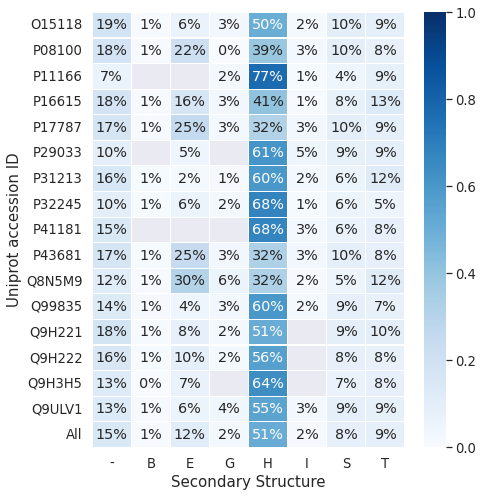

CPU times: user 7.01 s, sys: 1.72 s, total: 8.73 s
Wall time: 9.26 s


In [30]:
%%time
ss_content_df_dicts = []

for target in target_list:
    uniprot_id = target[0]
    pdb_id = target[3][0]    
    
    rosettapdb_file = os.path.join(pdb_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_pdb_XXX_{uniprot_id}-{pdb_id}.txt')
    rosettapf = read_prism(rosettapdb_file)
    rosettapf.dataframe = copy_wt_variants(rosettapf.dataframe, )
    rosettapf.dataframe['aa_ref'] = rosettapf.dataframe['variant'].apply(lambda x: [x[0]])
    rosettapf.dataframe['aa_var'] = rosettapf.dataframe['variant'].apply(lambda x: [x[-1]])
    rosettapf.dataframe['resi'] = rosettapf.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
    rosettapf.dataframe['n_mut'] = 1
    rosettapf.dataframe['tmp_resi_var'] = rosettapf.dataframe['variant'].apply(lambda x: x[-1])
    rosettapf.dataframe = rosettapf.dataframe[rosettapf.dataframe['tmp_resi_var']=='='].reset_index(drop=True).drop(columns=['tmp_resi_var'])
    rosettapf.dataframe['accession'] = uniprot_id
    ss_content_df_dicts.append(rosettapf.dataframe)
ss_content_df_dicts = pd.concat(ss_content_df_dicts)

ss_content_df_dicts['c'] = 1
df2 = pd.pivot_table(ss_content_df_dicts, columns=["SS"], index=["accession"], values='c', aggfunc=len, margins=True)
df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
df2.drop(columns=['All'], inplace=True)

with sns.axes_style("darkgrid"):
    f = plt.figure(figsize=(7,8))
    sns.set(font_scale = 1.2)
    sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, annot=True, fmt=".0%", )
    plt.xlabel("Secondary Structure", size=15)
    plt.ylabel("Uniprot accession ID", size=15)
    filename = os.path.join(plots_dir, f'dataset_SS.svg')
    plt.savefig(filename, )
    plt.show()


### gemme seq counts

In [31]:
gemme_workdir = os.path.join(working_dir, 'gemme')
os.makedirs(gemme_workdir, exist_ok=True)
seq_count = check_gemme_seq(sorted(target_list))
seq_count

,accession,sequence_count
0,O15118,1486
1,P08100,1183
2,P11166,1772
3,P16615,1924
4,P17787,1789
5,P29033,1351
6,P31213,1177
7,P32245,1265
8,P41181,1326
9,P43681,1107


## Plotting combined datasets

In [92]:
# general settings:
except_uniprot_list = ['P29033', 'P43681', 'Q8N5M9'] # to check if a few uniprots do affect the cutoff
key = 'all' # for cutoff choice in ddG-ddE plots
maxdelta_spliceai_column_global_name = 'maxdelta_spliceai'
cutoff_value = gnomAD_cutoff_value
gemme_name = 'gemme;score'


### ∆∆G and ∆∆E cutoffs

In [93]:
%%time
cutoff_value = gnomAD_cutoff_value
gemme_name = 'gemme;score'
all_tmp = []
all_aucs = {}
all_vals_cat = {}
all_execpt_tmp = []
all_execpt_aucs = {}
all_execpt_vals_cat = {}
target_dic_here = subfiltered_df_dicts

for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['uniprot;ID'] = target_uniprot
    if not target_uniprot in except_uniprot_list:
        all_execpt_tmp.append(tmp_energy)
    all_tmp.append(tmp_energy)
    
    control_df = tmp_energy.copy()
    control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
    control_score = np.copy(control_df['score'].values)
    if len(list(set(control_score))) > 1:
        auc_dici = cutoff_checks(control_df, nameB=gemme_name)
        all_aucs[target_uniprot]=auc_dici
        auc_dici = return_variant_in_cat(control_df, nameB=gemme_name, cutoffA=auc_dici[4], cutoffB=auc_dici[5])
        all_vals_cat[target_uniprot]=auc_dici
        logger.info(f"{target_uniprot} GroupA (cutoffA:{auc_dici[8]}, cutoffB:{auc_dici[9]}):: Q1: {len(auc_dici[0])}, Q2: {len(auc_dici[1])}, Q3: {len(auc_dici[2])}, Q4: {len(auc_dici[3])}")
        logger.info(f"{target_uniprot} GroupB (cutoffA:{auc_dici[8]}, cutoffB:{auc_dici[9]}):: Q1: {len(auc_dici[4])}, Q2: {len(auc_dici[5])}, Q3: {len(auc_dici[6])}, Q4: {len(auc_dici[7])}")
        
all_tmp = pd.concat(all_tmp)
all_execpt_tmp = pd.concat(all_execpt_tmp)
for region in ['all', ]:
    logger.info(region)
    tmp = all_tmp.copy()
    tmp2 = all_execpt_tmp.copy()
    if region != 'all':
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp2 = tmp2[(tmp2['uniprot;regions_all']==region)].reset_index(drop=True)

    for cutoff_value in [gnomAD_cutoff_value]:
        logger.info(cutoff_value)
        print(cutoff_value)
        control_df = tmp.copy()
        control_df2 = tmp2.copy()
        control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
        control_df2 = control_df2.dropna(subset = ['score']).reset_index(drop=True)
        control_score = np.copy(control_df2['score'].values)
        if len(list(set(control_score))) > 1:
            if region == 'all':
                auc_dici = cutoff_checks(control_df, nameB=gemme_name)
                all_aucs['all']=auc_dici
                logger.info(auc_dici)
                auc_dici = return_variant_in_cat(control_df, nameB=gemme_name, cutoffA=auc_dici[4], cutoffB=auc_dici[5])
                all_vals_cat['all']=auc_dici
                logger.info(auc_dici)
                
                auc_dici2 = cutoff_checks(control_df2, nameB=gemme_name)
                all_execpt_aucs['all']=auc_dici2
                auc_dici2 = return_variant_in_cat(control_df2, nameB=gemme_name, cutoffA=auc_dici2[4], cutoffB=auc_dici2[5])
                all_execpt_vals_cat['all']=auc_dici2


INFO:#accession: O15118
INFO:O15118 GroupA (cutoffA:3.57799999999952, cutoffB:0.4002553594596264):: Q1: 23, Q2: 15, Q3: 3, Q4: 3
INFO:O15118 GroupB (cutoffA:3.57799999999952, cutoffB:0.4002553594596264):: Q1: 2, Q2: 3, Q3: 11, Q4: 3
INFO:#accession: P08100
INFO:P08100 GroupA (cutoffA:5.666200000000027, cutoffB:0.7594563615523171):: Q1: 12, Q2: 7, Q3: 5, Q4: 17
INFO:P08100 GroupB (cutoffA:5.666200000000027, cutoffB:0.7594563615523171):: Q1: 0, Q2: 1, Q3: 5, Q4: 1
INFO:#accession: P11166
INFO:P11166 GroupA (cutoffA:4.116200000000299, cutoffB:0.2769582494148386):: Q1: 24, Q2: 17, Q3: 0, Q4: 1
INFO:P11166 GroupB (cutoffA:4.116200000000299, cutoffB:0.2769582494148386):: Q1: 0, Q2: 1, Q3: 8, Q4: 1
INFO:#accession: P16615
INFO:P16615 GroupA (cutoffA:10.39499999999953, cutoffB:0.1743193413143405):: Q1: 6, Q2: 2, Q3: 0, Q4: 0
INFO:P16615 GroupB (cutoffA:10.39499999999953, cutoffB:0.1743193413143405):: Q1: 0, Q2: 0, Q3: 5, Q4: 0
INFO:#accession: P17787
INFO:P17787 GroupA (cutoffA:1.6790000000000

7.097735196763732e-05


INFO:(0      A363V
1      S385G
2      R389C
5      I450V
9      A521S
       ...  
349    L401F
350    W226R
352    N461S
353    M493V
354    K506R
Name: variant, Length: 175, dtype: object, 25      F842L
33      A926T
35      A927V
39      R978C
41     G1034R
52     R1183H
59     S1200G
65       P23S
66       M39R
68       G51A
72       T58M
74       T70M
78       L95P
92      C167W
94      P180L
100     G188E
101     D190N
104     H211R
129     V165I
138     E247D
141     R269C
148     T310I
150     S313P
160     P383L
178      H71Q
181     R460G
188      M34T
189      V37A
193      A40G
227     M195V
233      C88W
239     R168C
252     F234L
264     I170V
269     N240S
296     T337M
299       M1V
300      T12I
306     G141R
316     R296C
317     L412F
318     R164Q
319     A193V
320     R196W
323     S241F
324     R263Q
325     D323V
329     N409S
341     A195G
343     F233S
Name: variant, dtype: object, 3      R404Q
4      R404W
6      T511M
8      R518W
16     L684F
       ...  


CPU times: user 6min 38s, sys: 15.4 s, total: 6min 53s
Wall time: 6min 41s


In [94]:
for key in all_vals_cat.keys():
    logger.info(f"{key} GroupA (cutoffA:{all_vals_cat[key][8]}, cutoffB:{all_vals_cat[key][9]}):: Q1: {len(all_vals_cat[key][0])}, Q2: {len(all_vals_cat[key][1])}, Q3: {len(all_vals_cat[key][2])}, Q4: {len(all_vals_cat[key][3])}")
    logger.info(f"{key} GroupB (cutoffA:{all_vals_cat[key][8]}, cutoffB:{all_vals_cat[key][9]}):: Q1: {len(all_vals_cat[key][4])}, Q2: {len(all_vals_cat[key][5])}, Q3: {len(all_vals_cat[key][6])}, Q4: {len(all_vals_cat[key][7])}")


INFO:O15118 GroupA (cutoffA:3.57799999999952, cutoffB:0.4002553594596264):: Q1: 23, Q2: 15, Q3: 3, Q4: 3
INFO:O15118 GroupB (cutoffA:3.57799999999952, cutoffB:0.4002553594596264):: Q1: 2, Q2: 3, Q3: 11, Q4: 3
INFO:P08100 GroupA (cutoffA:5.666200000000027, cutoffB:0.7594563615523171):: Q1: 12, Q2: 7, Q3: 5, Q4: 17
INFO:P08100 GroupB (cutoffA:5.666200000000027, cutoffB:0.7594563615523171):: Q1: 0, Q2: 1, Q3: 5, Q4: 1
INFO:P11166 GroupA (cutoffA:4.116200000000299, cutoffB:0.2769582494148386):: Q1: 24, Q2: 17, Q3: 0, Q4: 1
INFO:P11166 GroupB (cutoffA:4.116200000000299, cutoffB:0.2769582494148386):: Q1: 0, Q2: 1, Q3: 8, Q4: 1
INFO:P16615 GroupA (cutoffA:10.39499999999953, cutoffB:0.1743193413143405):: Q1: 6, Q2: 2, Q3: 0, Q4: 0
INFO:P16615 GroupB (cutoffA:10.39499999999953, cutoffB:0.1743193413143405):: Q1: 0, Q2: 0, Q3: 5, Q4: 0
INFO:P17787 GroupA (cutoffA:1.679000000000087, cutoffB:0.8691397849462366):: Q1: 1, Q2: 0, Q3: 0, Q4: 0
INFO:P17787 GroupB (cutoffA:1.679000000000087, cutoffB:0.86

In [95]:
for key in all_execpt_vals_cat.keys():
    logger.info(f"{key} GroupA (cutoffA:{all_execpt_vals_cat[key][8]}, cutoffB:{all_execpt_vals_cat[key][9]}):: Q1: {len(all_execpt_vals_cat[key][0])}, Q2: {len(all_execpt_vals_cat[key][1])}, Q3: {len(all_execpt_vals_cat[key][2])}, Q4: {len(all_execpt_vals_cat[key][3])}")
    logger.info(f"{key} GroupB (cutoffA:{all_execpt_vals_cat[key][8]}, cutoffB:{all_execpt_vals_cat[key][9]}):: Q1: {len(all_execpt_vals_cat[key][4])}, Q2: {len(all_execpt_vals_cat[key][5])}, Q3: {len(all_execpt_vals_cat[key][6])}, Q4: {len(all_execpt_vals_cat[key][7])}")


INFO:all GroupA (cutoffA:3.80159999999978, cutoffB:0.4717148211454107):: Q1: 95, Q2: 48, Q3: 17, Q4: 20
INFO:all GroupB (cutoffA:3.80159999999978, cutoffB:0.4717148211454107):: Q1: 7, Q2: 22, Q3: 53, Q4: 24


### ROC curves

INFO:all
INFO:7.097735196763732e-05
INFO:42
INFO:groupA: 220
groupB: 135


7.097735196763732e-05
Ensemble test roc-auc:0.6376430976430976
Ensemble test roc-auc:0.8129966329966329


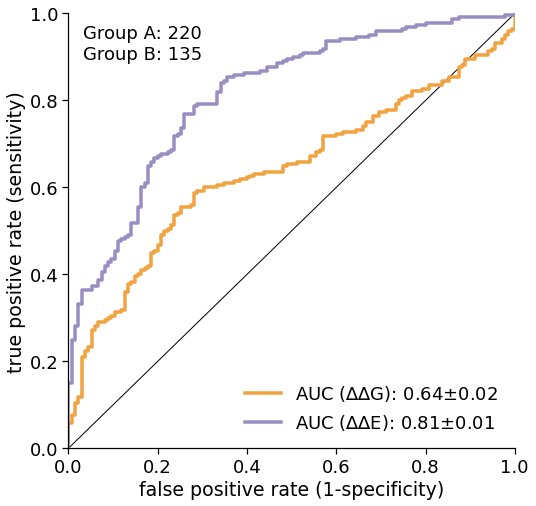

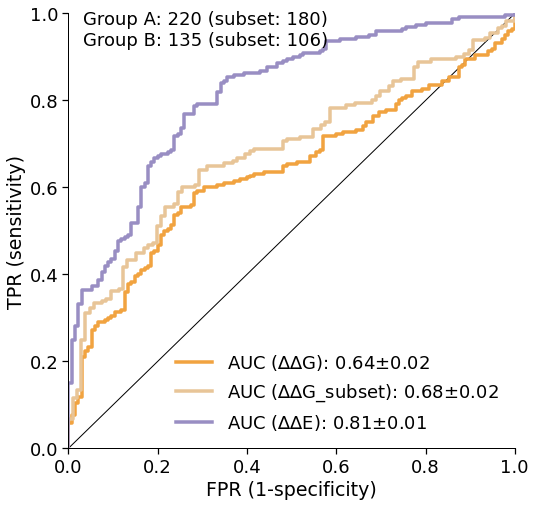

INFO:TRANSMEM
INFO:7.097735196763732e-05
INFO:15
INFO:groupA: 109
groupB: 47


7.097735196763732e-05
Ensemble test roc-auc:0.6603552605894984
Ensemble test roc-auc:0.8401327347257466


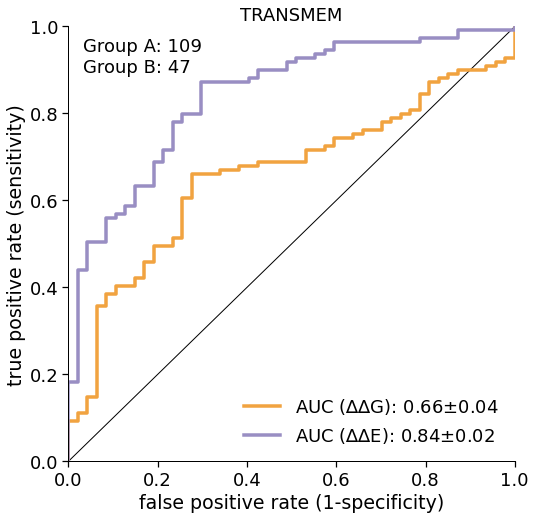

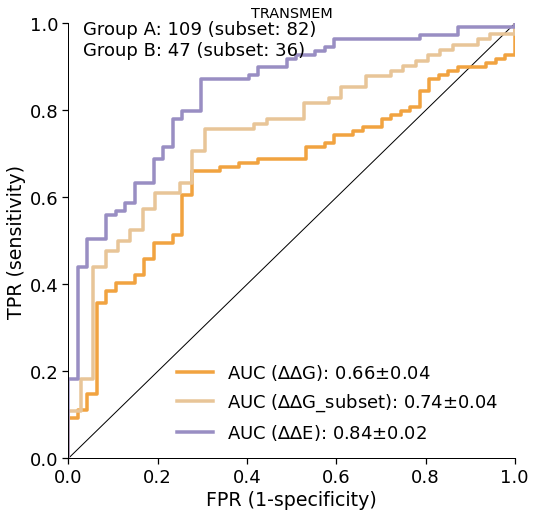

In [36]:
gemme_name = 'gemme;score'
all_tmp = []
all_execpt_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    if gemme_name == 'gemme;score;ori':
        tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    if not target_uniprot in except_uniprot_list:
        all_execpt_tmp.append(tmp_energy)
    all_tmp.append(tmp_energy)

all_execpt_tmp = pd.concat(all_execpt_tmp)
all_tmp = pd.concat(all_tmp)
for region in ['all', 'TRANSMEM']:
    logger.info(region)
    tmp = all_tmp.copy()
    tmp_2 = all_execpt_tmp.copy()
    title = ''
    if region != 'all':
        title = region
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp_2 = tmp_2[(tmp_2['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp2 = tmp.copy()

    for cutoff_value in [cutoff_value]:
        logger.info(cutoff_value)
        print(cutoff_value)
        control_df2 = tmp_2.copy()
        control_df = tmp2.copy()
        
        control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
        control_df2 = control_df2.dropna(subset = ['score']).reset_index(drop=True)
        
        logger.info(len(control_df.loc[control_df['clinvar;significance_all']=='benign', ['variant']]))
        control_score = np.copy(control_df['score'].values)
        control_score2 = np.copy(control_df2['score'].values)
        if len(list(set(control_score))) > 1:
            test_score3 = control_df2['rosetta;ddG'].values
            test_score1 = control_df['rosetta;ddG'].values
            test_score2 = control_df[gemme_name].values
            groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
            groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
            groupA2 = len(control_df2[control_df2['score']==1].reset_index(drop=True)['score'])
            groupB2 = len(control_df2[control_df2['score']==0].reset_index(drop=True)['score'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
            satu = ''

            auc_dici = disease_ROC_adapted(control_df, control_score, test_score1, test_score2, 
                                           'all', f"Fig2-B_{region}", cutoff=cutoff_value, satu=satu, 
                                           groupA=groupA, groupB=groupB, nameB=gemme_name, title=title)
            auc_dici = disease_ROC_adapted_all_except(control_df, control_df2, control_score, 
                                                      control_score2, test_score1, test_score2, 
                                                      test_score3, 'all', region, 
                                                      cutoff=cutoff_value, satu=satu, groupA=groupA, 
                                                      groupB=groupB, groupA2=groupA2, groupB2=groupB2, 
                                                      nameB=gemme_name, title=title)


INFO:#accession: O15118
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Lumenal']
INFO:578
INFO:groupA: 44
groupB: 19


Ensemble test roc-auc:0.6734449760765551
Ensemble test roc-auc:0.8672248803827751


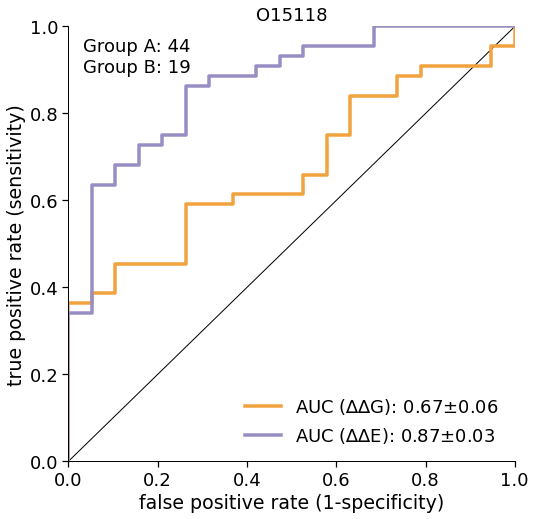

INFO:#accession: P08100
INFO:all
INFO:['Extracellular' 'TRANSMEM' 'Cytoplasmic']
INFO:255
INFO:groupA: 41
groupB: 7


Ensemble test roc-auc:0.8048780487804879
Ensemble test roc-auc:0.6655052264808363


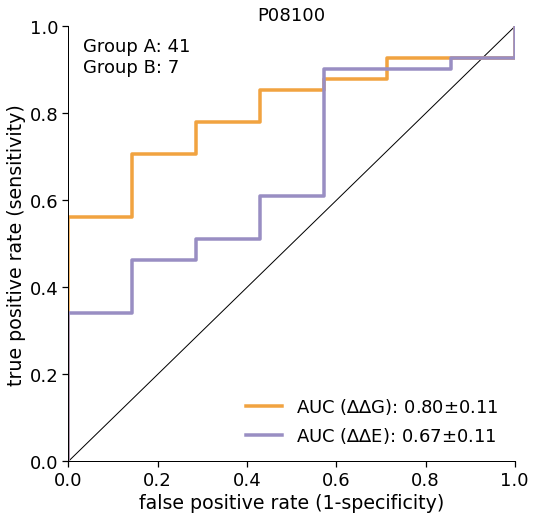

INFO:#accession: P11166
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Extracellular']
INFO:254
INFO:groupA: 42
groupB: 10


Ensemble test roc-auc:0.7119047619047619
Ensemble test roc-auc:0.9428571428571428


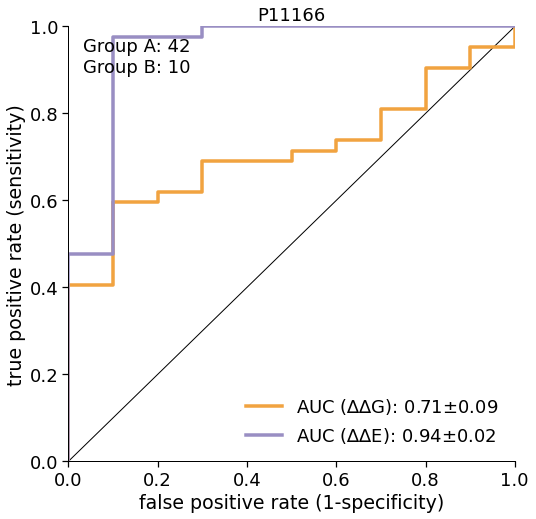

INFO:#accession: P16615
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Lumenal']
INFO:346
INFO:groupA: 8
groupB: 5


Ensemble test roc-auc:0.85
Ensemble test roc-auc:1.0


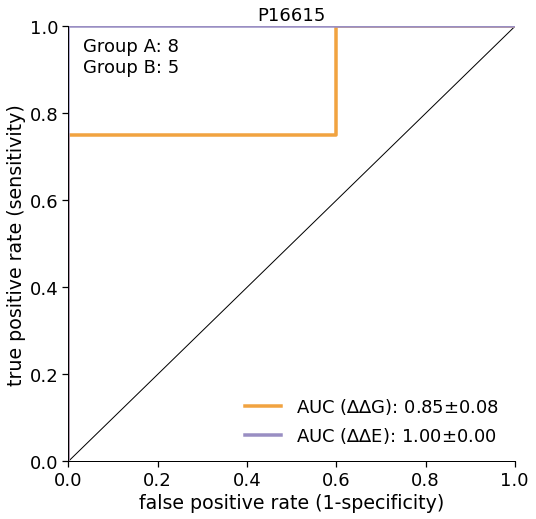

INFO:#accession: P17787
INFO:all
INFO:['Extracellular' 'TRANSMEM' 'Cytoplasmic' nan]
INFO:193
INFO:groupA: 1
groupB: 5


Ensemble test roc-auc:0.8
Ensemble test roc-auc:1.0


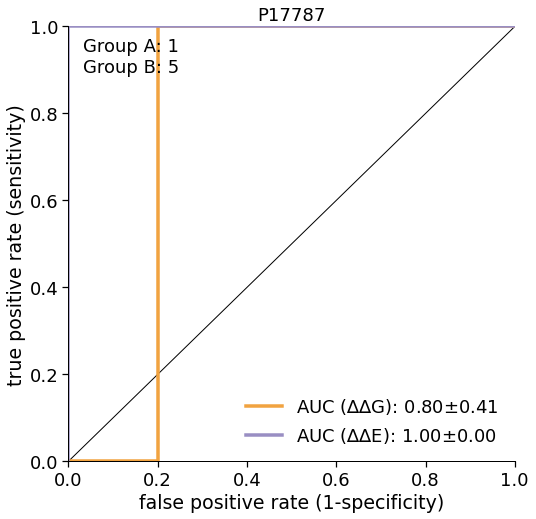

INFO:#accession: P29033
INFO:all
INFO:[nan 'Cytoplasmic' 'TRANSMEM' 'Extracellular']
INFO:140
INFO:groupA: 33
groupB: 17


Ensemble test roc-auc:0.43315508021390375
Ensemble test roc-auc:0.8467023172905527


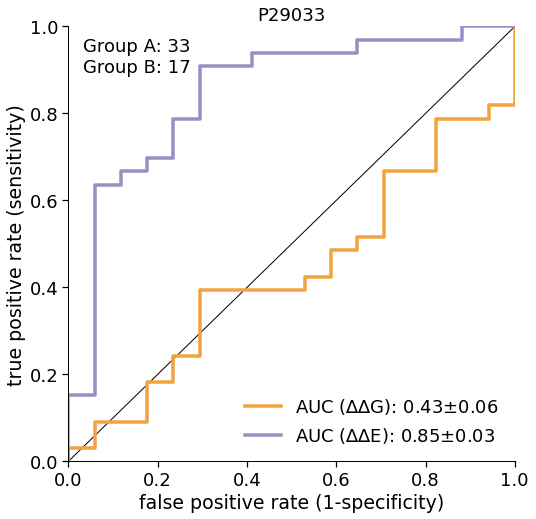

INFO:#accession: P31213
INFO:all
INFO:['TRANSMEM' nan]
INFO:107
INFO:groupA: 18
groupB: 9


Ensemble test roc-auc:0.6049382716049383
Ensemble test roc-auc:0.8827160493827161


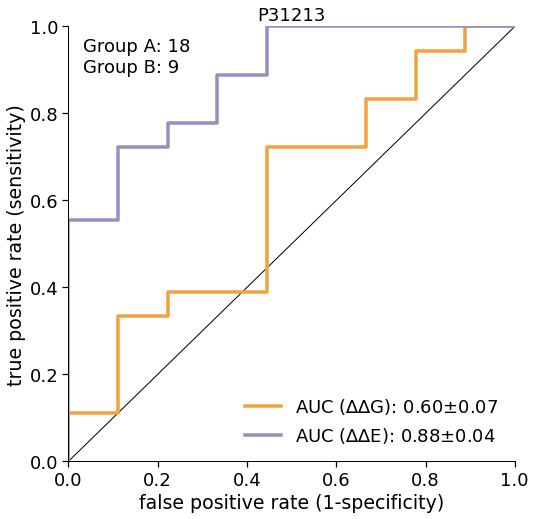

INFO:#accession: P32245
INFO:all
INFO:['TRANSMEM' 'Cytoplasmic' 'Extracellular']
INFO:180
INFO:groupA: 10
groupB: 9


Ensemble test roc-auc:0.6666666666666667
Ensemble test roc-auc:0.9777777777777777


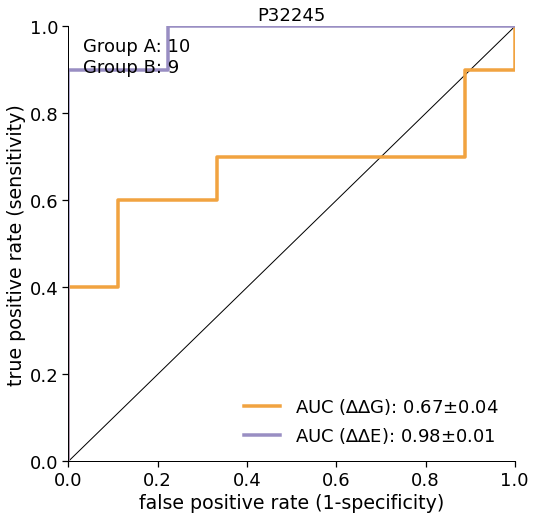

INFO:#accession: P41181
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Extracellular' nan]
INFO:130
INFO:groupA: 7
groupB: 4


Ensemble test roc-auc:0.6071428571428572
Ensemble test roc-auc:0.8571428571428571


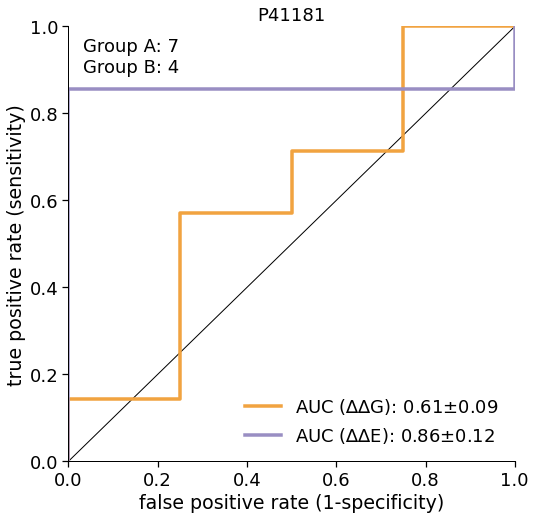

INFO:#accession: P43681
INFO:all
INFO:['Extracellular' 'TRANSMEM' nan 'Cytoplasmic']
INFO:206
INFO:groupA: 3
groupB: 6


Ensemble test roc-auc:0.3333333333333333
Ensemble test roc-auc:0.9444444444444444


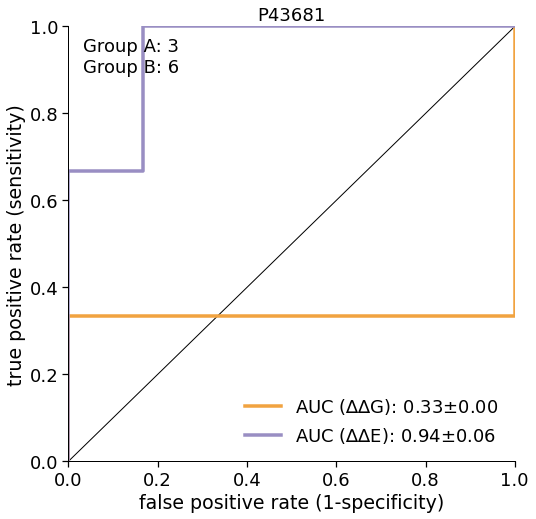

INFO:#accession: Q8N5M9
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Lumenal']
INFO:110
INFO:groupA: 4
groupB: 6


Ensemble test roc-auc:0.45833333333333326
Ensemble test roc-auc:0.875


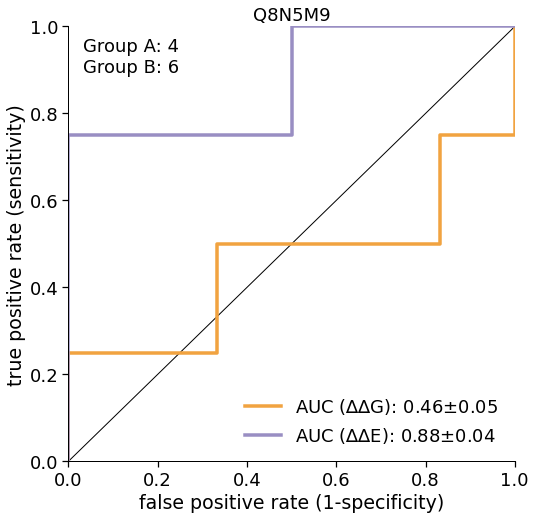

INFO:#accession: Q99835
INFO:all
INFO:['Extracellular' 'TRANSMEM' 'Cytoplasmic']
INFO:218
INFO:groupA: 1
groupB: 9


Ensemble test roc-auc:1.0
Ensemble test roc-auc:0.8888888888888888


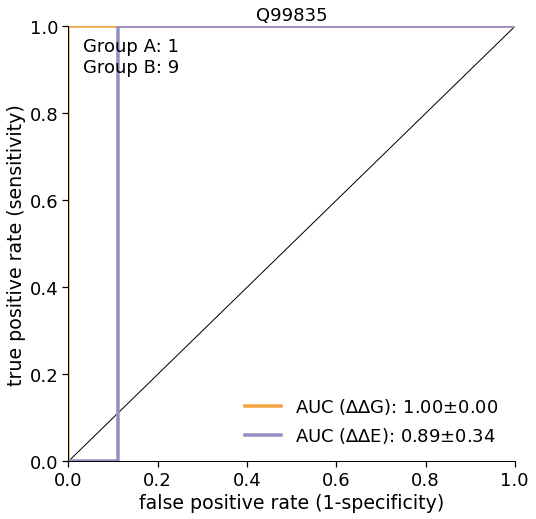

INFO:#accession: Q9H221
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Extracellular']
INFO:367
INFO:#accession: Q9H3H5
INFO:all
INFO:['Lumenal' 'TRANSMEM' 'Cytoplasmic']
INFO:233
INFO:groupA: 6
groupB: 4


Ensemble test roc-auc:0.5416666666666667
Ensemble test roc-auc:0.625


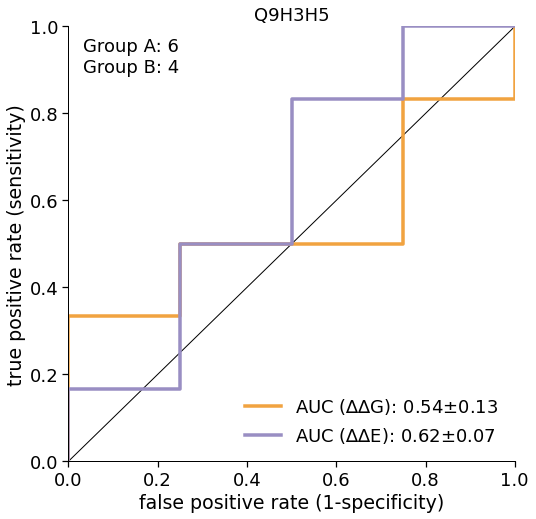

INFO:#accession: Q9ULV1
INFO:all
INFO:['Extracellular' 'TRANSMEM' 'Cytoplasmic']
INFO:154
INFO:groupA: 2
groupB: 3


Ensemble test roc-auc:0.8333333333333334
Ensemble test roc-auc:1.0


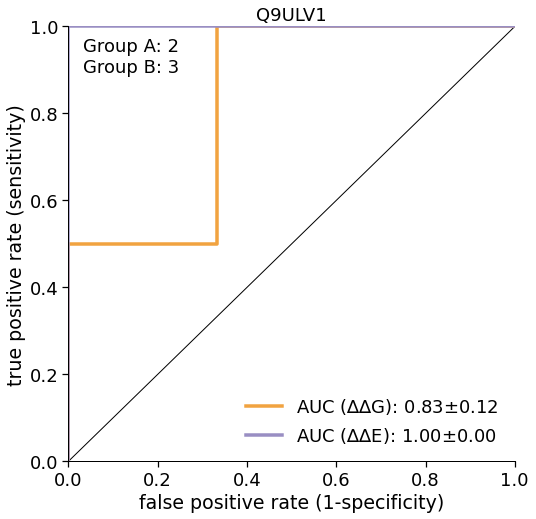

In [37]:
gemme_name = 'gemme;score'

target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    tmp_energy = target_dic_here[target_uniprot].copy()

    for region in ['all']:
        logger.info(region)
        tmp2 = tmp_energy.copy()
        logger.info(tmp2['uniprot;regions_all'].unique())
        if region != 'all':
            tmp2 = tmp2[(tmp2['uniprot;regions_all']==region)].reset_index(drop=True)
        if len(tmp2['variant'])==0:
            continue
        logger.info(len(tmp2['variant']))

        for cutoff_value in [gnomAD_cutoff_value]:
            control_df = tmp2.copy()
            control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
            control_score = np.copy(control_df['score'].values)
            if len(list(set(control_score))) > 1:
                test_score1 = control_df['rosetta;ddG'].values
                test_score2 = control_df[gemme_name].values
                title = f"{target_uniprot}_{region}"
                groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
                groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
                logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
                satu = ''

                auc_dici = disease_ROC_adapted(control_df, control_score, test_score1, test_score2, target_uniprot, 
                                               region, cutoff=cutoff_value, satu=satu, groupA=groupA, groupB=groupB, 
                                               nameB=gemme_name, title=target_uniprot, runs=1000)


### ddG-ddE distribution

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 20000x20000 with 0 Axes>

<Figure size 576x576 with 0 Axes>

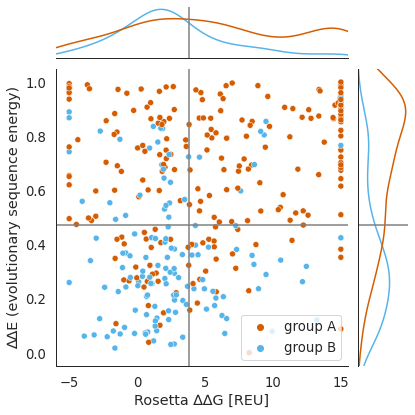

INFO:TRANSMEM
INFO:['other' 'group B' 'group A']


<Figure size 20000x20000 with 0 Axes>

<Figure size 576x576 with 0 Axes>

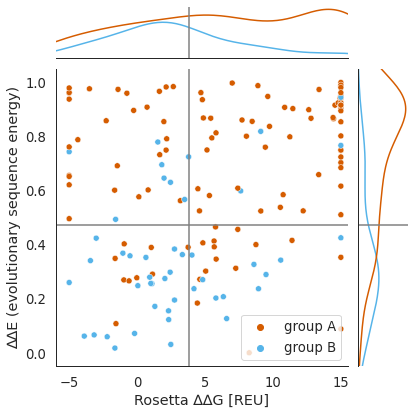

In [38]:
x_range = 1
y_range = 0.1

all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    all_tmp.append(tmp_energy)
    
all_tmp = pd.concat(all_tmp)
for region in ['all', 'TRANSMEM']:#+list(all_tmp['uniprot;regions_all'].unique()):
    logger.info(region)
    f = plt.figure(figsize=(8,8), dpi=2500)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])
        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')

        filename = os.path.join(plots_dir, f'Fig2-A_{region}.svg')
        plt.savefig(filename, )
        plt.show()


INFO:#accession: O15118
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

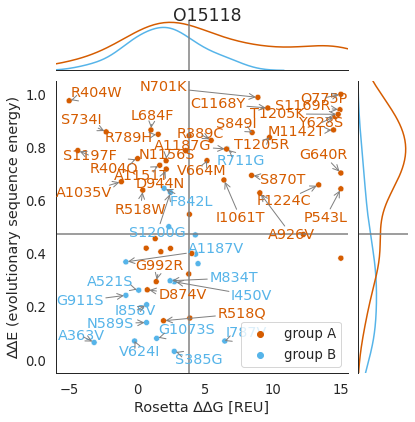

INFO:#accession: P08100
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

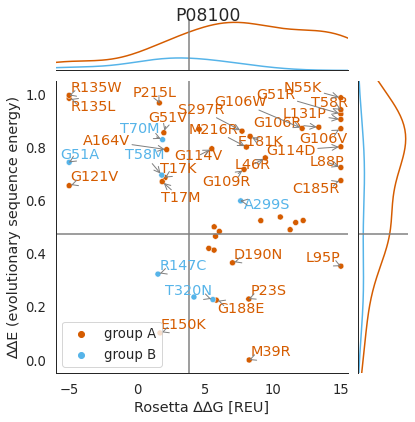

INFO:#accession: P11166
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

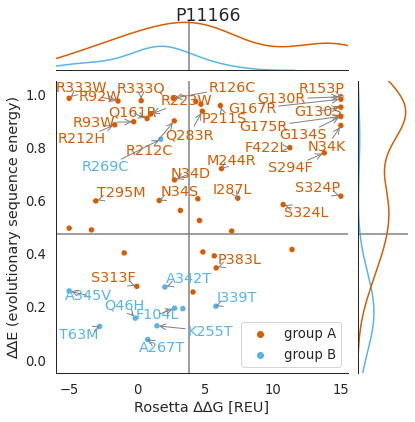

INFO:#accession: P16615
INFO:['group A' 'other' 'group B']


<Figure size 576x576 with 0 Axes>

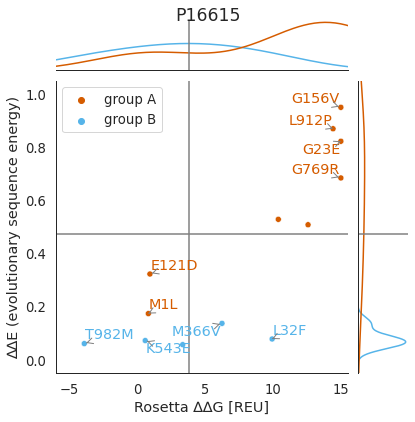

INFO:#accession: P17787
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

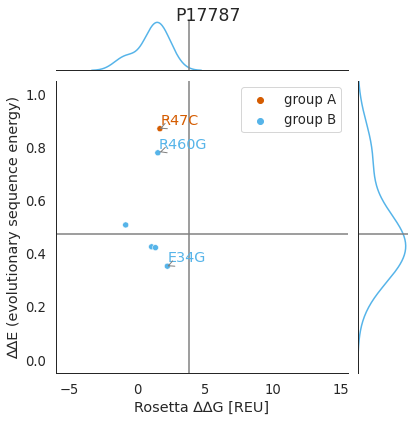

INFO:#accession: P29033
INFO:['group B' 'other' 'group A']


<Figure size 576x576 with 0 Axes>

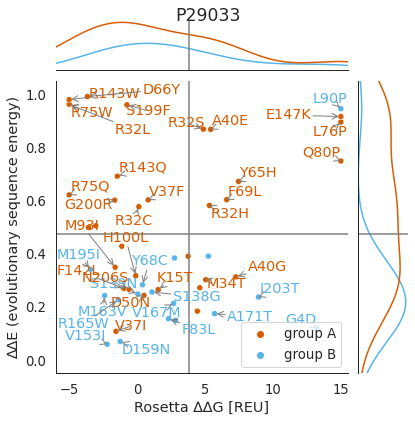

INFO:#accession: P31213
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

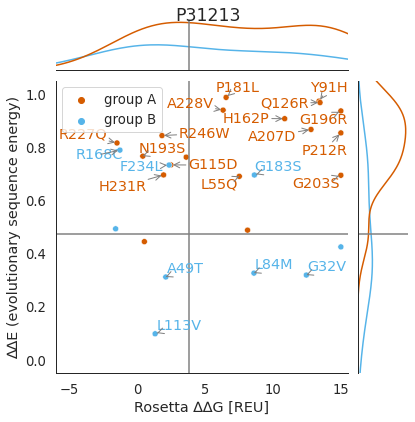

INFO:#accession: P32245
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

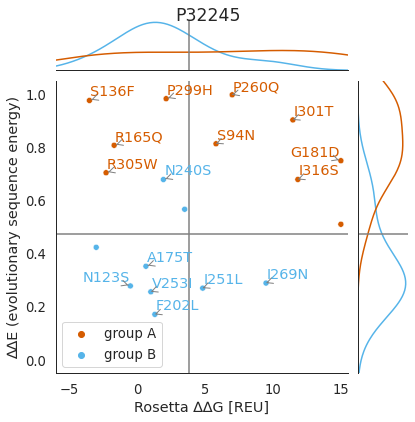

INFO:#accession: P41181
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

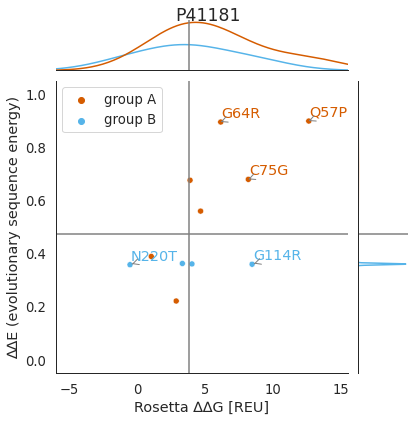

INFO:#accession: P43681
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

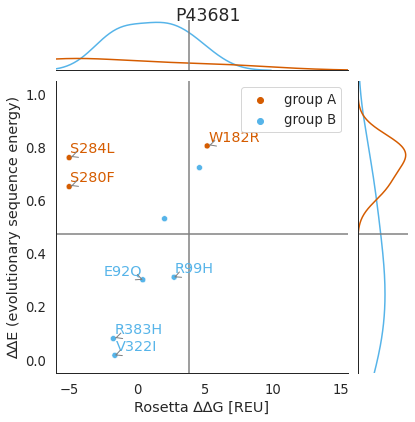

INFO:#accession: Q8N5M9
INFO:['group A' 'group B' 'other']


<Figure size 576x576 with 0 Axes>

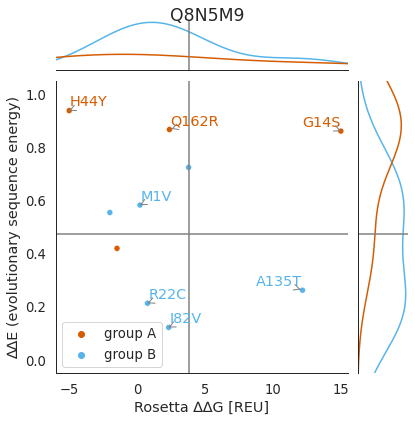

INFO:#accession: Q99835
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

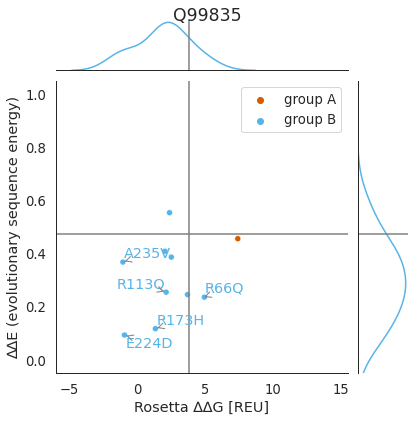

INFO:#accession: Q9H221
INFO:['other' 'group B']


<Figure size 576x576 with 0 Axes>

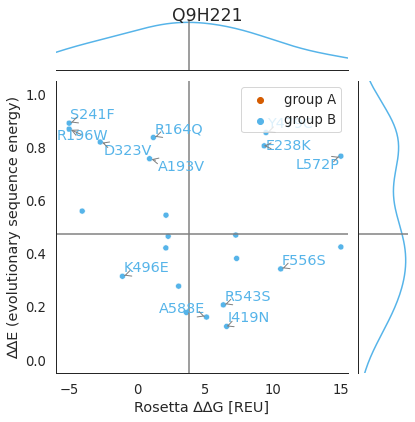

INFO:#accession: Q9H3H5
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

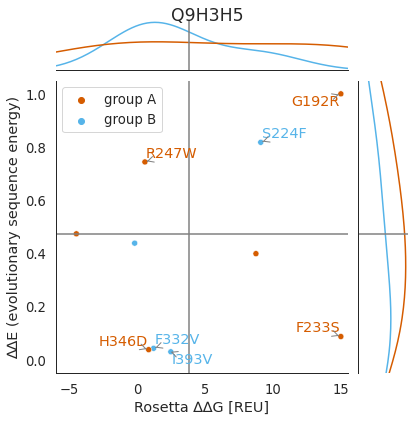

INFO:#accession: Q9ULV1
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

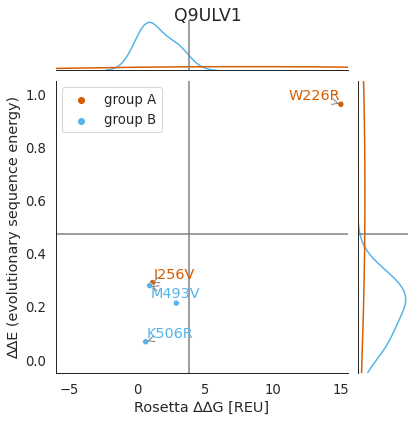

In [39]:
x_range = 1
y_range = 0.1
rosetta_grey = True
gemme_grey = True
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    
    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_joint.set_xlim(-5-x_range,15+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')
        g.fig.suptitle(target_uniprot)

        texts = []
        for line in range(0,tmpi.shape[0]):
            labeler=True
            if rosetta_grey==True and gemme_grey==True:
                if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)) and ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                    labeler=True
                else:
                    labeler=False
            else:
                if rosetta_grey==True:
                    if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)):
                        labeler=True
                    else:
                        labeler=False
                if gemme_grey==True:
                    if ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                        labeler=True
                    else:
                        labeler=False
            if labeler==True:
                if tmpi['label'][line] == 'group A':
                    texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color='#D55C00'))
                elif tmpi['label'][line] == 'group B':
                    texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color='#56B4E9'))

        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        g.fig.subplots_adjust(top=0.95)
        plt.show()
    

### ddG-ddE distribution plot + spliceAI

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

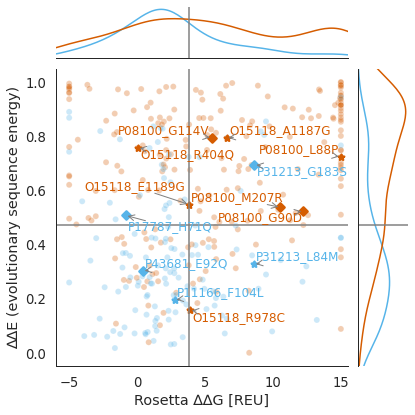

In [40]:
x_range = 1
y_range = 0.1
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['uniprot'] = target_uniprot
    all_tmp.append(tmp_energy)

all_tmp = pd.concat(all_tmp)
for region in ['all',]:
    logger.info(region)
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        tmp_energy = all_tmp.copy()
        if region != 'all':
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ], alpha=0.3, legend=False
                         )

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')

        g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score'].isna()]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score'].isna()]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==1]

        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#D55C00', linewidths=2.25, alpha=1, marker="*")
        texts = []
        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==1]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#D55C00', linewidths=2.25, alpha=1, marker="D")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==0]

        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#56B4E9', linewidths=2.25, alpha=1, marker="*")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==0]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#56B4E9', linewidths=2.25, alpha=1, marker="D")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        filename = os.path.join(plots_dir, f'FigS2-splice-dist.svg')
        plt.savefig(filename, )
        plt.show()


INFO:#accession: O15118
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

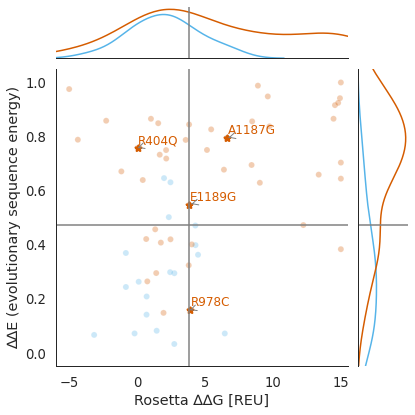

INFO:#accession: P08100
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

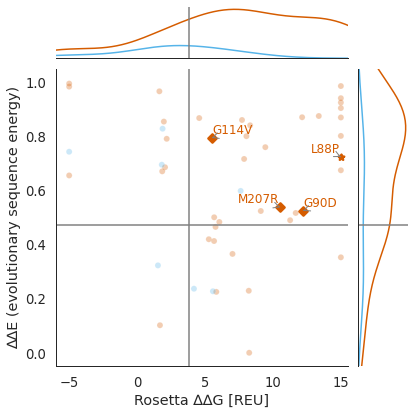

INFO:#accession: P11166
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

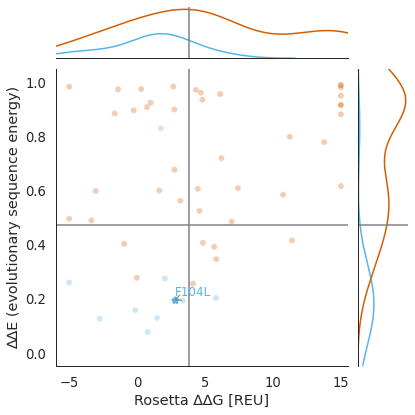

INFO:#accession: P16615
INFO:['group A' 'other' 'group B']


<Figure size 576x576 with 0 Axes>

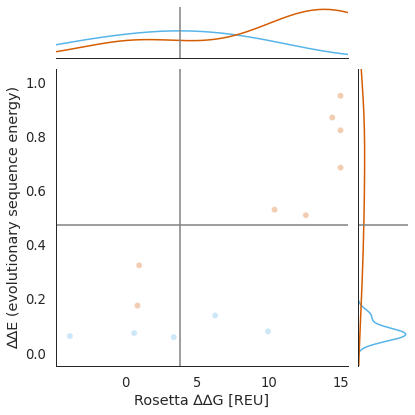

INFO:#accession: P17787
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

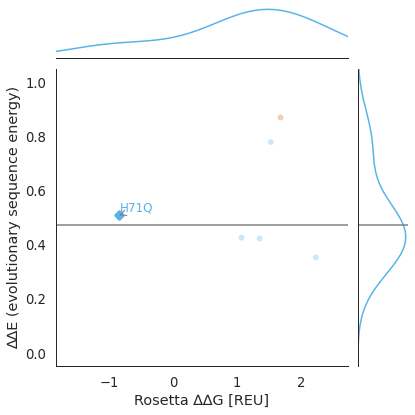

INFO:#accession: P29033
INFO:['group B' 'other' 'group A']


<Figure size 576x576 with 0 Axes>

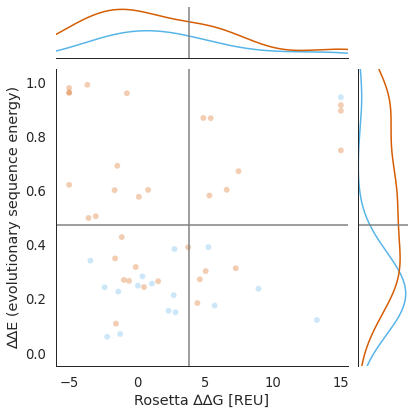

INFO:#accession: P31213
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

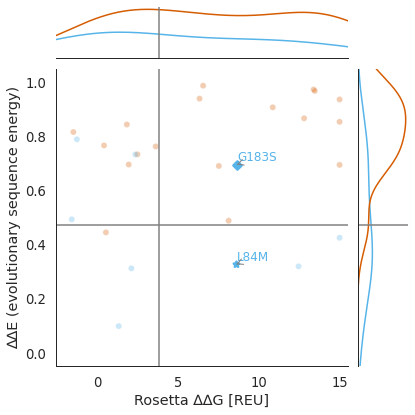

INFO:#accession: P32245
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

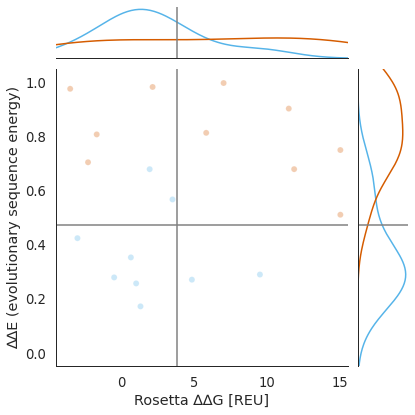

INFO:#accession: P41181
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

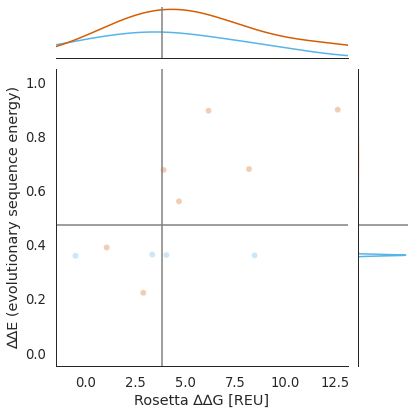

INFO:#accession: P43681
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

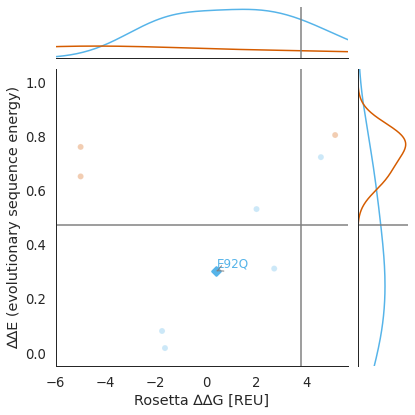

INFO:#accession: Q8N5M9
INFO:['group A' 'group B' 'other']


<Figure size 576x576 with 0 Axes>

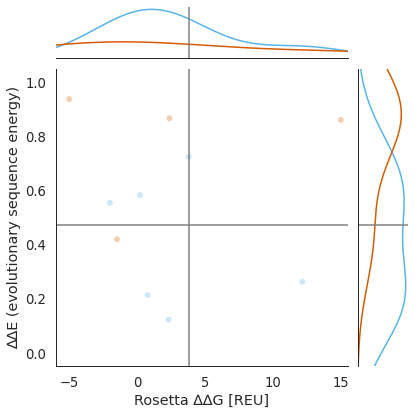

INFO:#accession: Q99835
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

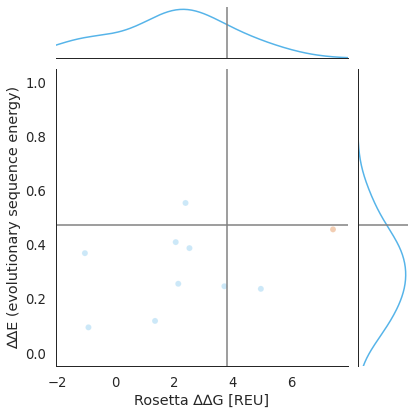

INFO:#accession: Q9H221
INFO:['other' 'group B']


<Figure size 576x576 with 0 Axes>

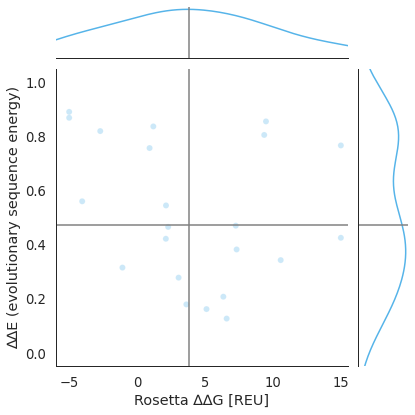

INFO:#accession: Q9H3H5
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

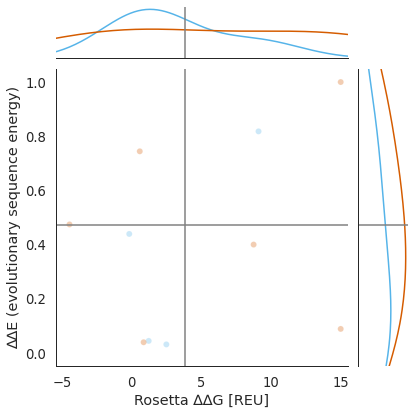

INFO:#accession: Q9ULV1
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

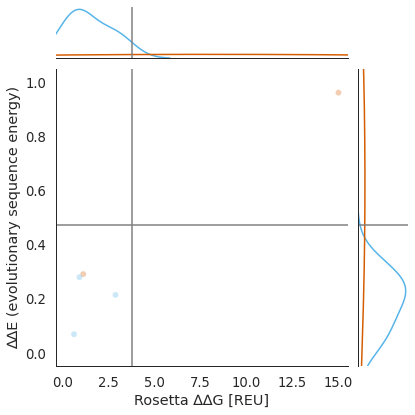

In [41]:
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        if region != 'all':
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ], alpha=0.3, legend=False
                         )

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')

        g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score'].isna()]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score'].isna()]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==1]

        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#D55C00', linewidths=2.25, alpha=1, marker="*")
        texts = []
        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==1]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#D55C00', linewidths=2.25, alpha=1, marker="D")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==0]

        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#56B4E9', linewidths=2.25, alpha=1, marker="*")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==0]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#56B4E9', linewidths=2.25, alpha=1, marker="D")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)
        plt.show()
    

### gnomAD ddG/ddE distribution plot

INFO:#accession: O15118
INFO:['gnomad' 'VUS|gnomad' 'conflict|gnomad' 'unknown' 'benign|gnomad' 'VUS'
 'gnomad|pathogenic' 'pathogenic']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic' 'benign']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=102)
INFO:[nan  0.  1.]


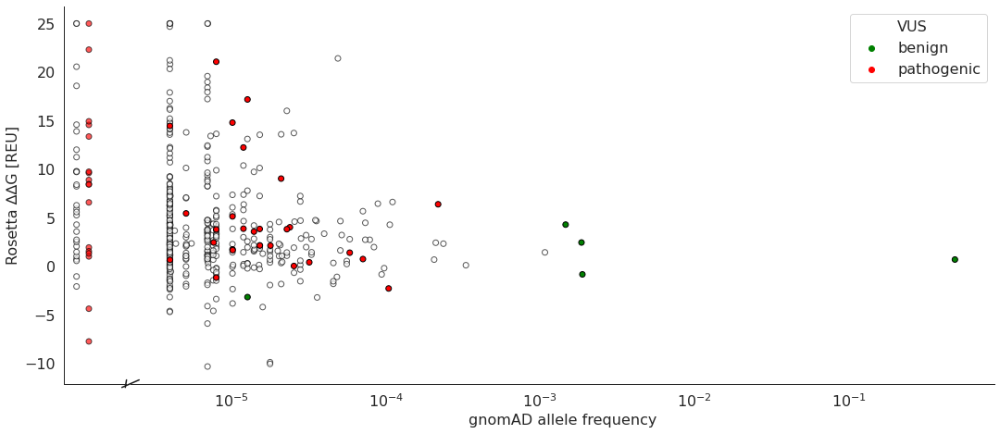

INFO:[nan 'VUS' 'conflict' 'benign' 'pathogenic']
INFO:#accession: P08100
INFO:['gnomad' 'pathogenic' 'gnomad|pathogenic' 'conflict|gnomad' 'VUS'
 'VUS|gnomad' 'benign|gnomad' 'unknown' 'conflict']
INFO:['gnomad_low' 'pathogenic' nan 'benign' 'gnomad_high']
INFO:['VUS' 'pathogenic' 'benign' None]
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;LIPID_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00',
       'uniprot;DISULFID_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=102)
INFO:[nan  1.  0.]


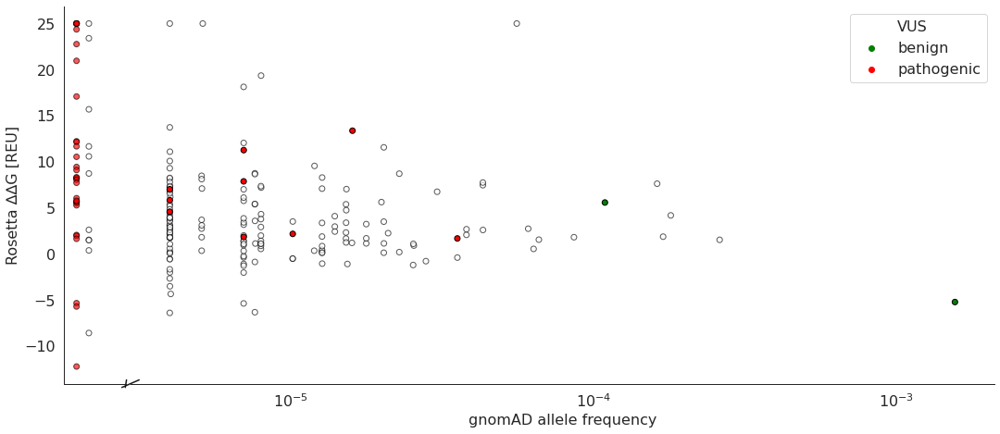

INFO:[nan 'pathogenic' 'conflict' 'VUS' 'benign']
INFO:#accession: P11166
INFO:['VUS|gnomad' 'gnomad' 'pathogenic' 'VUS' 'conflict|gnomad' 'unknown'
 'gnomad|pathogenic' 'conflict' 'benign|gnomad']
INFO:['gnomad_low' 'pathogenic' nan 'gnomad_high' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00',
       'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02',

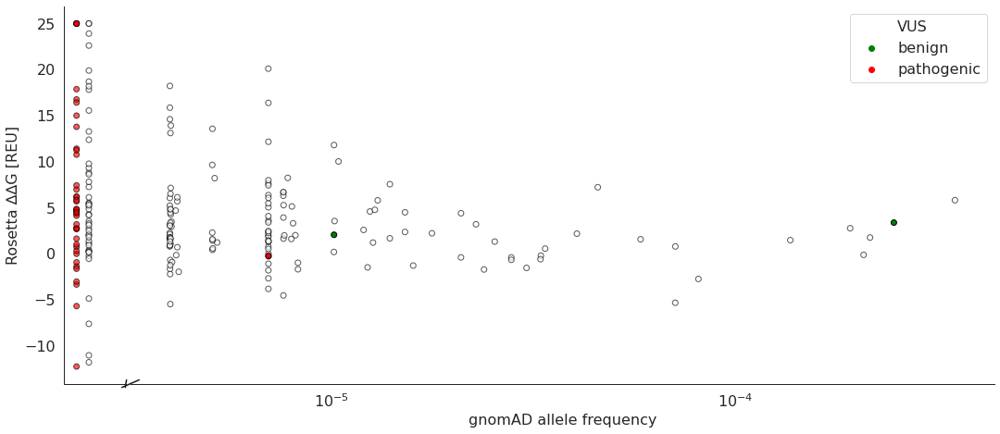

INFO:['VUS' nan 'pathogenic' 'conflict' 'benign']
INFO:#accession: P16615
INFO:['pathogenic' 'gnomad' 'unknown' 'benign|gnomad' 'VUS|gnomad' 'VUS']
INFO:['pathogenic' 'gnomad_low' nan 'benign' 'gnomad_high']
INFO:['pathogenic' 'VUS' None 'benign']
INFO:[ 1. nan  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;ACT_SITE_00',
       'uniprot;BINDING_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=106)
INFO:[ 1. nan  0.]


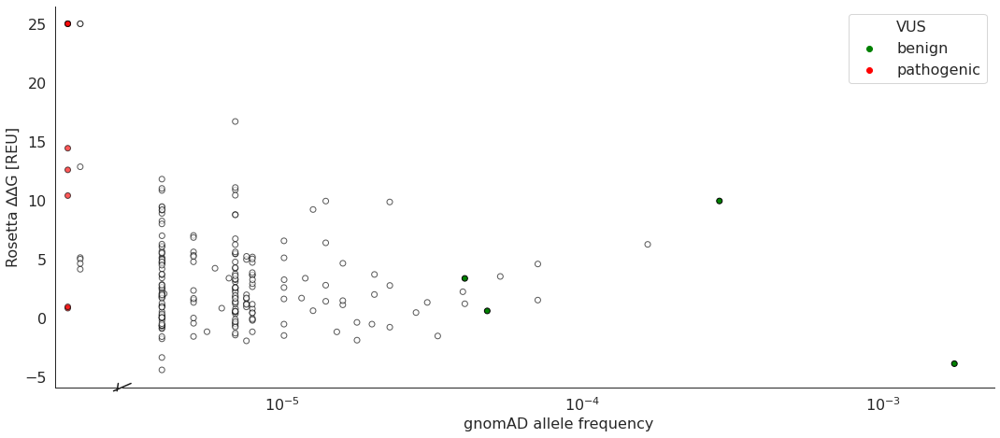

INFO:['pathogenic' nan 'benign' 'VUS']
INFO:#accession: P17787
INFO:['VUS|gnomad' 'gnomad' 'VUS' 'conflict|gnomad' 'gnomad|pathogenic'
 'unknown' 'benign|gnomad']
INFO:['gnomad_low' 'gnomad_high' nan 'pathogenic' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;SITE_00',
       'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00',
       'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00',
       'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;SS_07', 'pdb;ASA_07',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gn

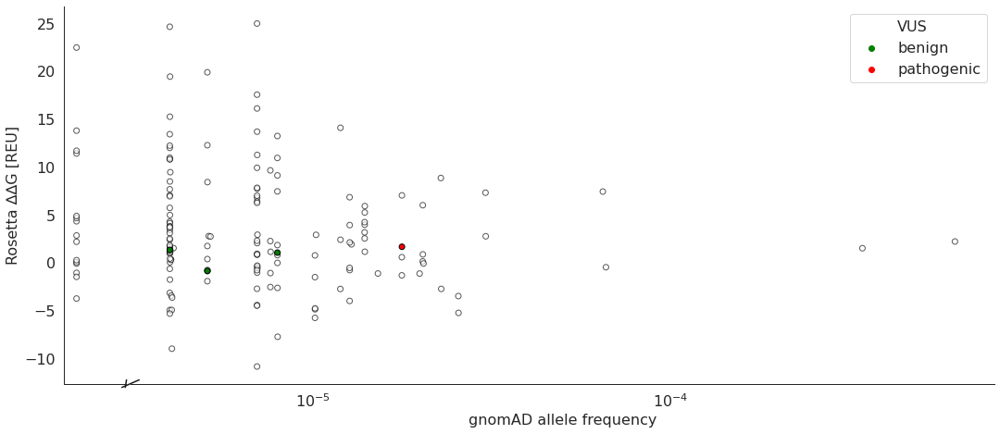

INFO:['VUS' nan 'conflict' 'pathogenic' 'benign']
INFO:#accession: P29033
INFO:['conflict|gnomad' 'gnomad' 'VUS|gnomad' 'VUS' 'gnomad|pathogenic'
 'unknown' 'pathogenic' 'benign|gnomad']
INFO:['gnomad_high' 'gnomad_low' nan 'pathogenic' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[ 0. nan  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00',
       'uniprot;TRANSMEM_00', 'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
      

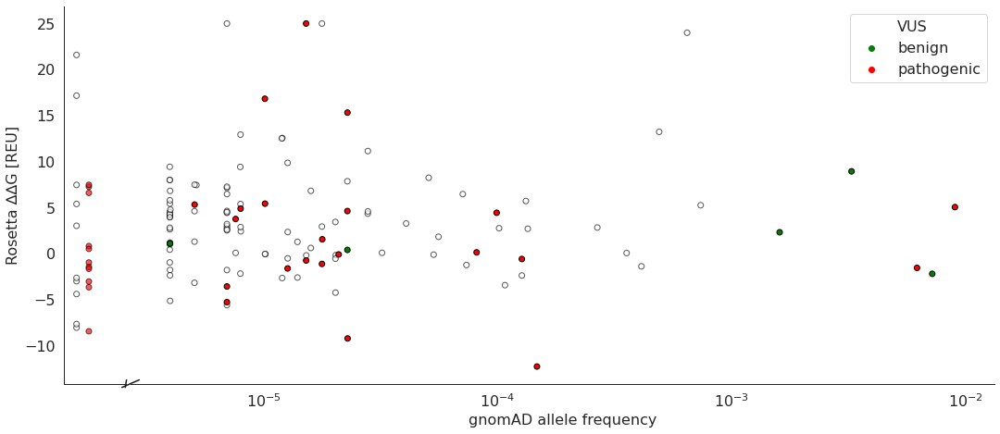

INFO:['conflict' nan 'VUS' 'pathogenic' 'benign']
INFO:#accession: P31213
INFO:['unknown' 'VUS' 'gnomad' 'benign' 'gnomad|pathogenic' 'benign|gnomad'
 'VUS|gnomad' 'pathogenic' 'conflict|gnomad']
INFO:[nan 'gnomad_high' 'benign' 'gnomad_low' 'pathogenic']
INFO:[None 'VUS' 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'pdb;SS_07',
       'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02',
       'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04',
       'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_0

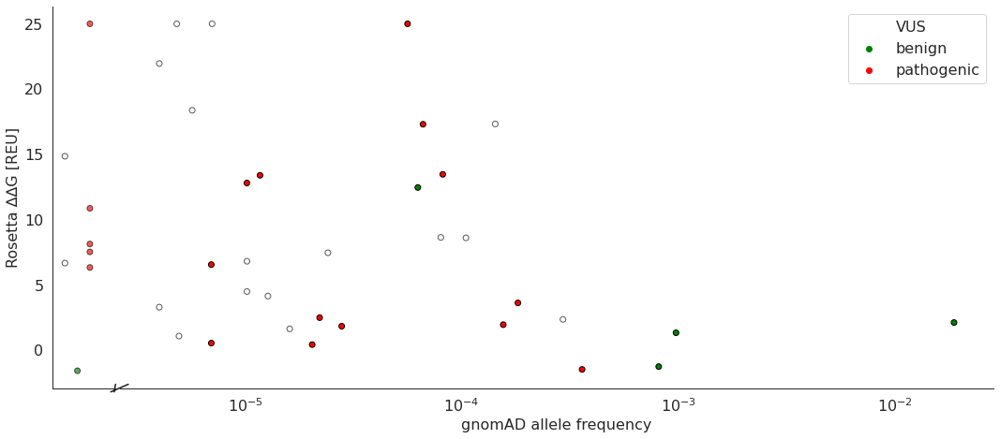

INFO:[nan 'VUS' 'benign' 'pathogenic' 'conflict']
INFO:#accession: P32245
INFO:['gnomad' 'unknown' 'gnomad|pathogenic' 'benign|gnomad' 'VUS|gnomad'
 'conflict|gnomad' 'VUS' 'pathogenic']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;CARBOHYD_00',
       'uniprot;DISULFID_00', 'uniprot;HELIX_00', 'uniprot;TURN_00',
       'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;S

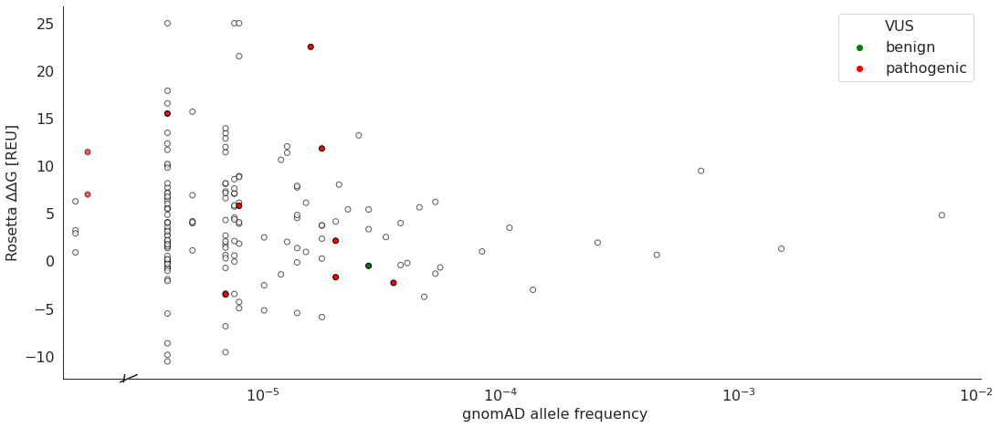

INFO:[nan 'pathogenic' 'benign' 'VUS' 'conflict']
INFO:#accession: P41181
INFO:['gnomad' 'VUS|gnomad' 'gnomad|pathogenic' 'pathogenic' 'unknown'
 'benign|gnomad']
INFO:['gnomad_low' 'pathogenic' 'gnomad_high' nan 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00',
       'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;mobidb_lite_00',
       'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gn

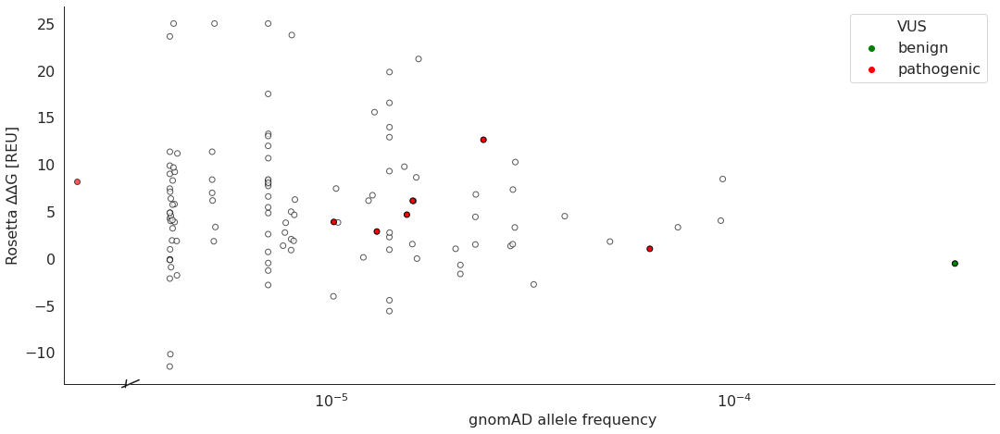

INFO:[nan 'VUS' 'pathogenic' 'benign']
INFO:#accession: P43681
INFO:['gnomad' 'VUS|gnomad' 'unknown' 'VUS' 'conflict|gnomad' 'pathogenic'
 'benign|gnomad']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic' 'benign']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;MOD_RES_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=107)
INFO:[nan  0.  1.]


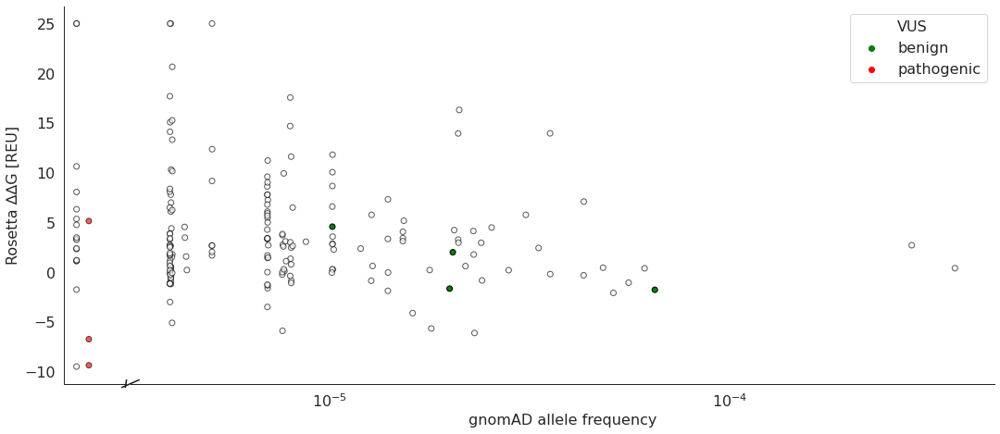

INFO:[nan 'VUS' 'conflict' 'pathogenic' 'benign']
INFO:#accession: Q8N5M9
INFO:['pathogenic' 'benign' 'VUS|gnomad' 'gnomad' 'VUS' 'conflict' 'unknown'
 'benign|gnomad' 'gnomad|pathogenic']
INFO:['pathogenic' 'benign' 'gnomad_low' 'gnomad_high' nan]
INFO:['pathogenic' 'benign' 'VUS' None]
INFO:[ 1.  0. nan]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'pdb;SS_07', 'pdb;ASA_07',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
       'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosett

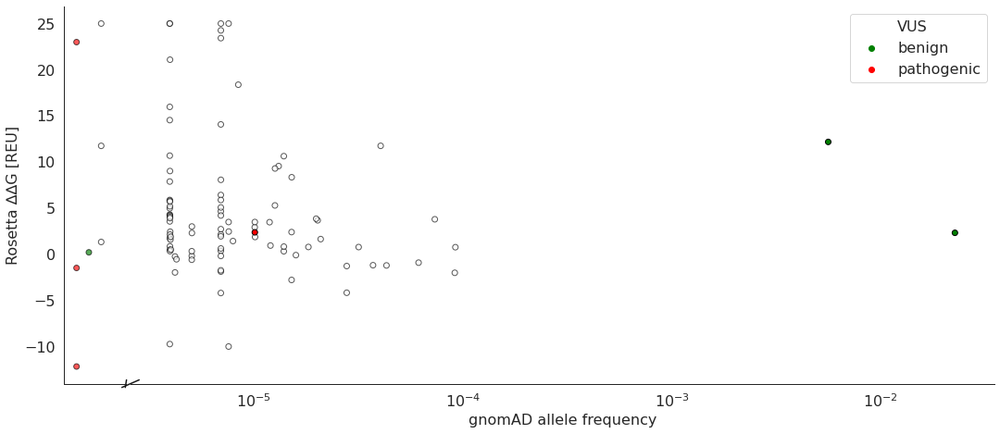

INFO:['pathogenic' 'benign' 'VUS' nan 'conflict']
INFO:#accession: Q99835
INFO:['gnomad' 'unknown' 'benign|gnomad' 'pathogenic']
INFO:['gnomad_low' 'gnomad_high' nan 'benign' 'pathogenic']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00',
       'uniprot;mobi_db_consensus_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnom

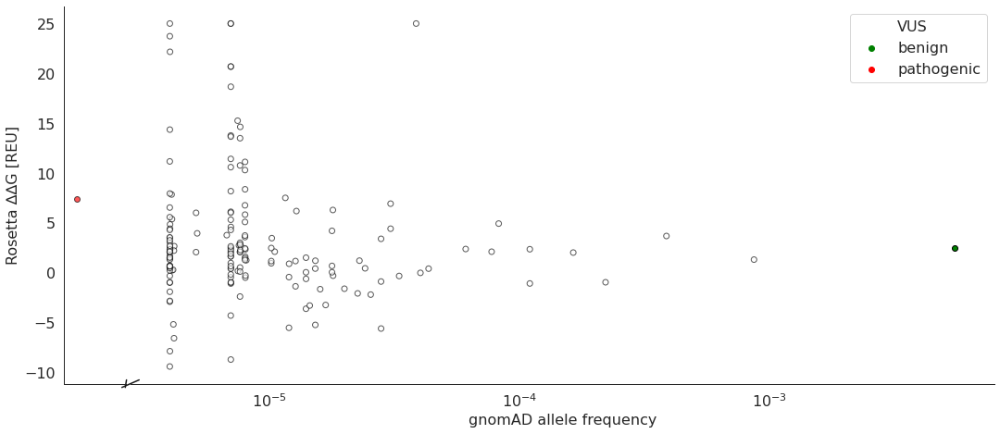

INFO:[nan 'benign' 'pathogenic']
INFO:#accession: Q9H221
INFO:['unknown' 'gnomad' 'VUS|gnomad' 'VUS' 'benign|gnomad']
INFO:[nan 'gnomad_low' 'gnomad_high' 'benign']
INFO:[None 'VUS' 'benign']
INFO:[nan  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;mobidb_lite_00',
       'uniprot;mobi_db_consensus_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
       'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04',
       'rosetta;

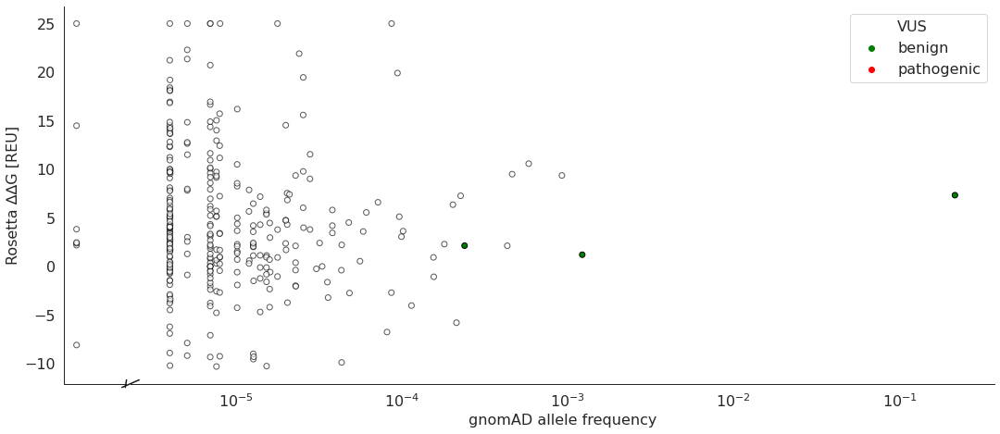

INFO:[nan 'VUS' 'benign']
INFO:#accession: Q9H3H5
INFO:['gnomad' 'unknown' 'VUS' 'VUS|gnomad' 'gnomad|pathogenic'
 'conflict|gnomad' 'pathogenic' 'benign|gnomad']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'pdb;SS_07', 'pdb;ASA_07',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gn

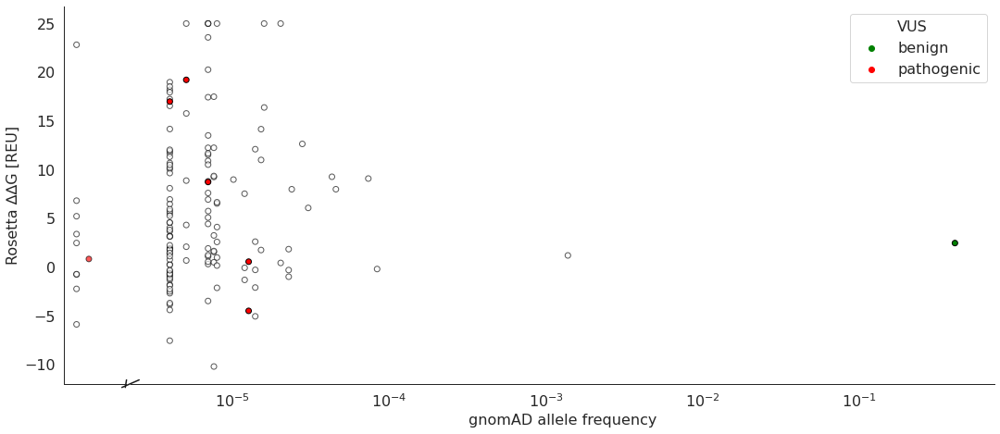

INFO:[nan 'VUS' 'pathogenic' 'conflict' 'benign']
INFO:#accession: Q9ULV1
INFO:['gnomad' 'VUS' 'pathogenic' 'VUS|gnomad' 'gnomad|pathogenic' 'unknown'
 'conflict|gnomad' 'benign' 'benign|gnomad']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'pdb;SS_07', 'pdb;ASA_07',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gno

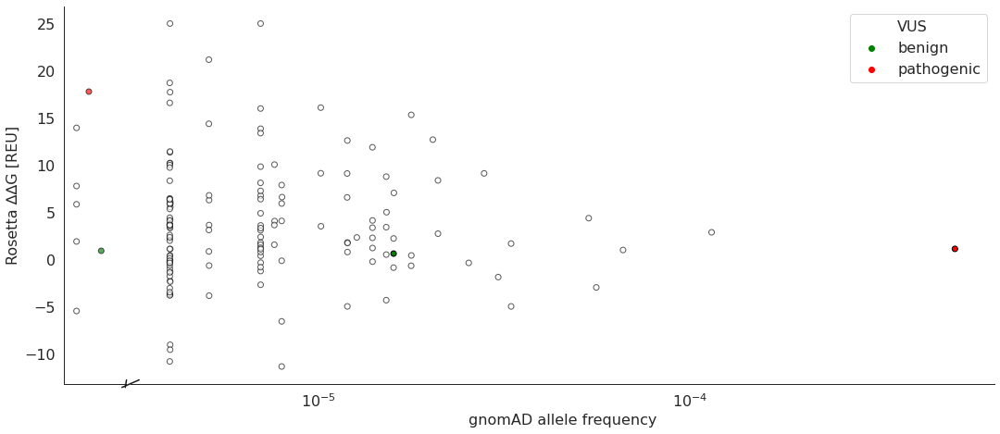

INFO:[nan 'VUS' 'pathogenic' 'conflict' 'benign']
INFO:all
INFO:['VUS' None 'benign' 'pathogenic']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic' 'benign']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'pdb;SS_08', 'pdb;ASA_08', 'spliceai;maxdelta_07', 'spliceai;DS_AG_07',
       'spliceai;DS_AL_07', 'spliceai;DS_DG_07', 'spliceai;DS_DL_07',
       'spliceai;HGVSc_07', 'uniprot;INTRAMEM_00',
       'uniprot;mobi_db_consensus_00'],
      dtype='object', length=117)
INFO:[nan  0.  1.]


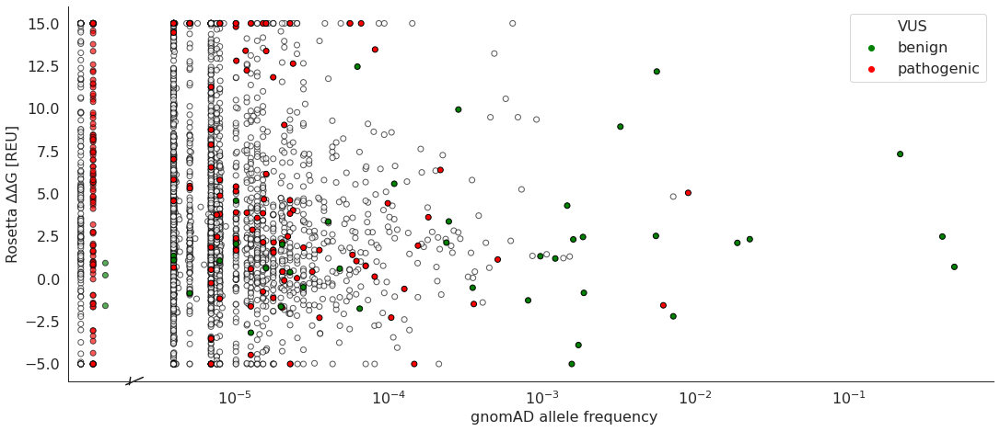

INFO:[nan 'VUS' 'conflict' 'benign' 'pathogenic']


In [42]:
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    target_plot_dir = os.path.join(plots_dir, target_uniprot)

    tmp_energy = target_dic_here[target_uniprot].copy()
    all_tmp.append(tmp_energy)

    tmp_energy['label_class_detail'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class_detail'] = tmp_energy['label_class_detail'].apply(lambda x: gnomad_class_anno3(x, split_val=cutoff_value))
    
    logger.info(tmp_energy['label'].unique())
    logger.info(tmp_energy['label_class'].unique())
    logger.info(tmp_energy['label_class_detail'].unique())
    logger.info(tmp_energy['score'].unique())
    
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'groupA'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'groupB'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    
    logger.info(tmp_energy.columns)
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 25, 'rosetta;ddG'] = 25
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -25, 'rosetta;ddG'] = -25
    min_y = tmp_energy['rosetta;ddG'].min()
    max_y = tmp_energy['rosetta;ddG'].max()
    tmp_energy['label'] = tmp_energy['label_class_detail']
    fishtail_plot_adapt3(tmp_energy, min_y, max_y, labeling=False)
    logger.info(tmp_energy['clinvar;significance_all'].unique())
    
all_tmp = pd.concat(all_tmp)
for region in ['all', ]:
    logger.info(region)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    tmp_energy['label_class_detail'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class_detail'] = tmp_energy['label_class_detail'].apply(lambda x: gnomad_class_anno3(x, split_val=cutoff_value))

    logger.info(tmp_energy['label'].unique())
    logger.info(tmp_energy['label_class'].unique())
    logger.info(tmp_energy['label_class_detail'].unique())
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'groupA'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'groupB'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    logger.info(tmp_energy.columns)
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    min_y = tmp_energy['rosetta;ddG'].min()
    max_y = tmp_energy['rosetta;ddG'].max()
    tmp_energy['label'] = tmp_energy['label_class_detail']
    fishtail_plot_adapt3(tmp_energy, min_y, max_y, labeling=False)
    logger.info(tmp_energy['clinvar;significance_all'].unique())


INFO:#accession: O15118
INFO:['gnomad' 'VUS|gnomad' 'conflict|gnomad' 'unknown' 'benign|gnomad' 'VUS'
 'gnomad|pathogenic' 'pathogenic']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic' 'benign']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=102)
INFO:[nan  0.  1.]


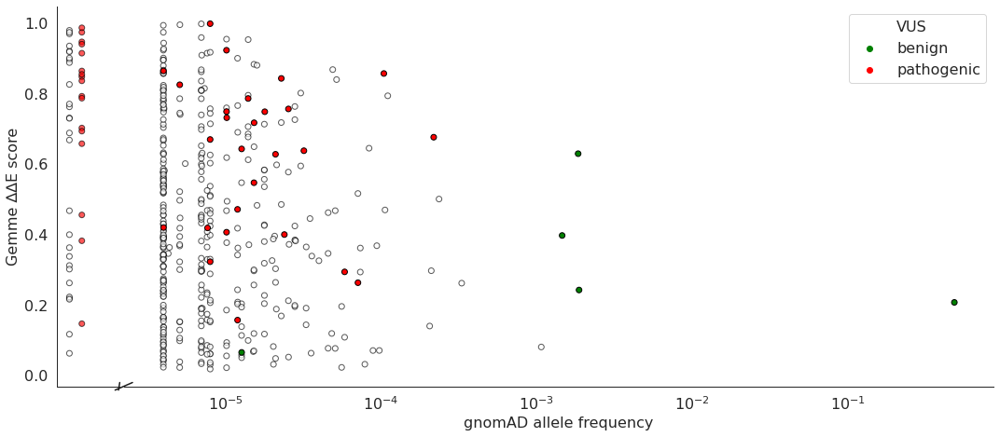

INFO:[nan 'VUS' 'conflict' 'benign' 'pathogenic']
INFO:#accession: P08100
INFO:['gnomad' 'pathogenic' 'gnomad|pathogenic' 'conflict|gnomad' 'VUS'
 'VUS|gnomad' 'benign|gnomad' 'unknown' 'conflict']
INFO:['gnomad_low' 'pathogenic' nan 'benign' 'gnomad_high']
INFO:['VUS' 'pathogenic' 'benign' None]
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;LIPID_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00',
       'uniprot;DISULFID_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=102)
INFO:[nan  1.  0.]


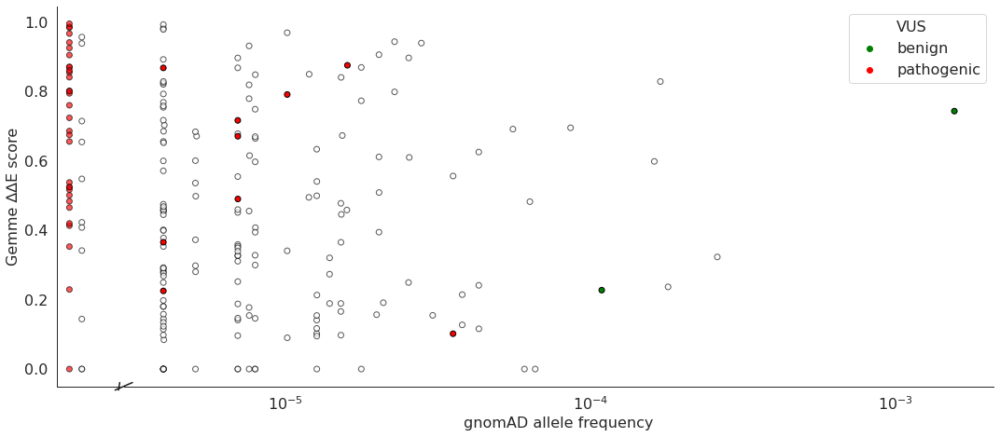

INFO:[nan 'pathogenic' 'conflict' 'VUS' 'benign']
INFO:#accession: P11166
INFO:['VUS|gnomad' 'gnomad' 'pathogenic' 'VUS' 'conflict|gnomad' 'unknown'
 'gnomad|pathogenic' 'conflict' 'benign|gnomad']
INFO:['gnomad_low' 'pathogenic' nan 'gnomad_high' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00',
       'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02',

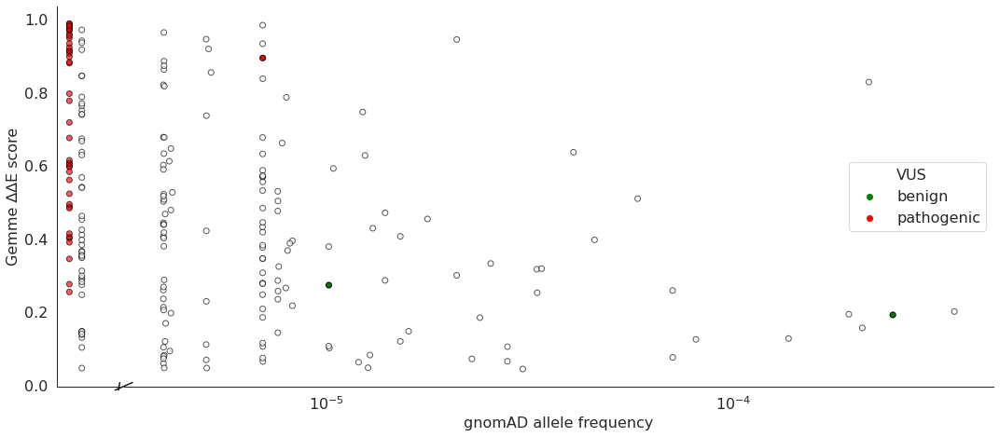

INFO:['VUS' nan 'pathogenic' 'conflict' 'benign']
INFO:#accession: P16615
INFO:['pathogenic' 'gnomad' 'unknown' 'benign|gnomad' 'VUS|gnomad' 'VUS']
INFO:['pathogenic' 'gnomad_low' nan 'benign' 'gnomad_high']
INFO:['pathogenic' 'VUS' None 'benign']
INFO:[ 1. nan  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;ACT_SITE_00',
       'uniprot;BINDING_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=106)
INFO:[ 1. nan  0.]


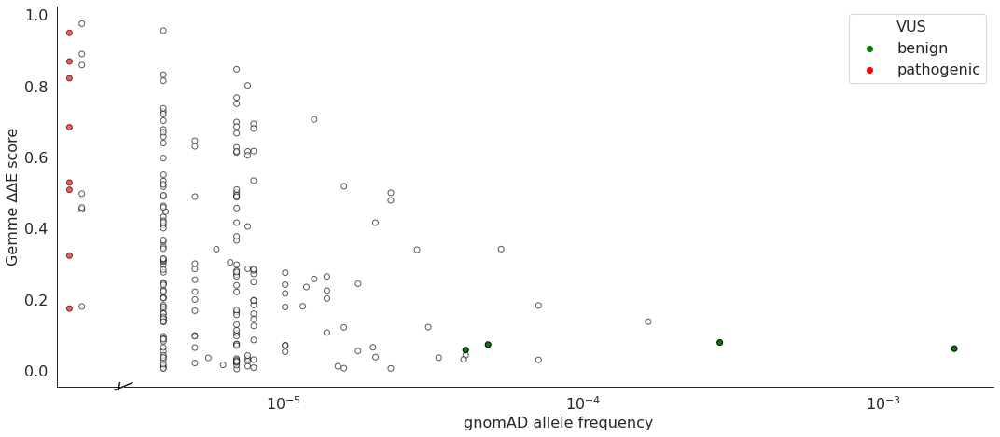

INFO:['pathogenic' nan 'benign' 'VUS']
INFO:#accession: P17787
INFO:['VUS|gnomad' 'gnomad' 'VUS' 'conflict|gnomad' 'gnomad|pathogenic'
 'unknown' 'benign|gnomad']
INFO:['gnomad_low' 'gnomad_high' nan 'pathogenic' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;SITE_00',
       'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00',
       'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00',
       'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;SS_07', 'pdb;ASA_07',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gn

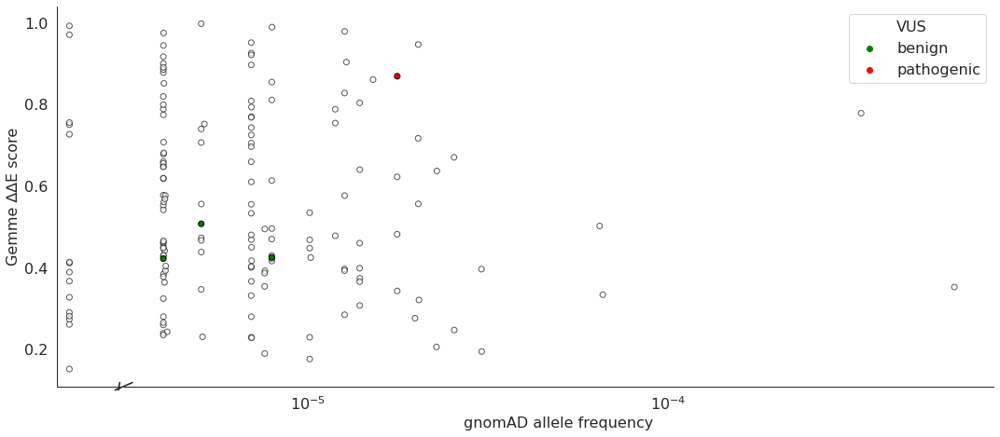

INFO:['VUS' nan 'conflict' 'pathogenic' 'benign']
INFO:#accession: P29033
INFO:['conflict|gnomad' 'gnomad' 'VUS|gnomad' 'VUS' 'gnomad|pathogenic'
 'unknown' 'pathogenic' 'benign|gnomad']
INFO:['gnomad_high' 'gnomad_low' nan 'pathogenic' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[ 0. nan  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00',
       'uniprot;TRANSMEM_00', 'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
      

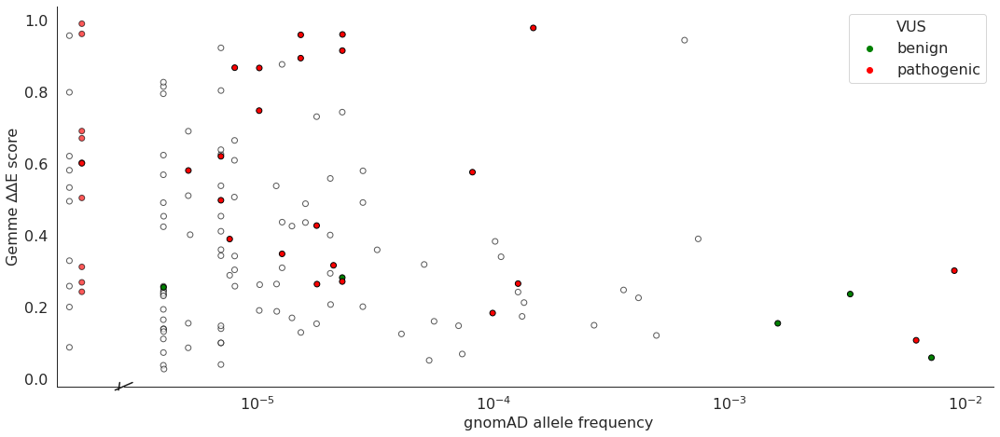

INFO:['conflict' nan 'VUS' 'pathogenic' 'benign']
INFO:#accession: P31213
INFO:['unknown' 'VUS' 'gnomad' 'benign' 'gnomad|pathogenic' 'benign|gnomad'
 'VUS|gnomad' 'pathogenic' 'conflict|gnomad']
INFO:[nan 'gnomad_high' 'benign' 'gnomad_low' 'pathogenic']
INFO:[None 'VUS' 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'pdb;SS_07',
       'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02',
       'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04',
       'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_0

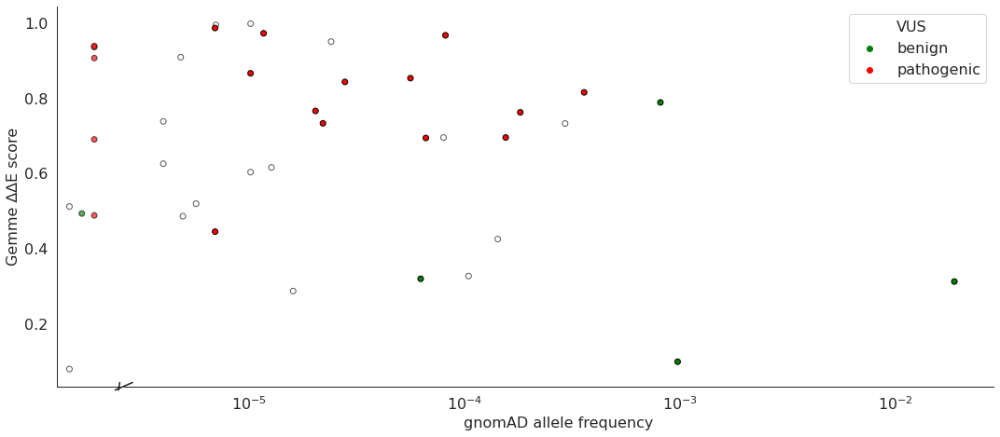

INFO:[nan 'VUS' 'benign' 'pathogenic' 'conflict']
INFO:#accession: P32245
INFO:['gnomad' 'unknown' 'gnomad|pathogenic' 'benign|gnomad' 'VUS|gnomad'
 'conflict|gnomad' 'VUS' 'pathogenic']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;CARBOHYD_00',
       'uniprot;DISULFID_00', 'uniprot;HELIX_00', 'uniprot;TURN_00',
       'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;S

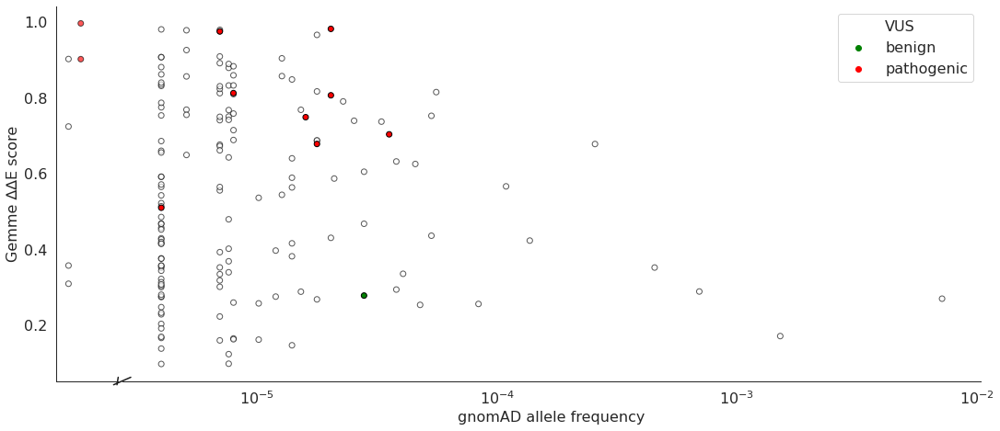

INFO:[nan 'pathogenic' 'benign' 'VUS' 'conflict']
INFO:#accession: P41181
INFO:['gnomad' 'VUS|gnomad' 'gnomad|pathogenic' 'pathogenic' 'unknown'
 'benign|gnomad']
INFO:['gnomad_low' 'pathogenic' 'gnomad_high' nan 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00',
       'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;mobidb_lite_00',
       'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gn

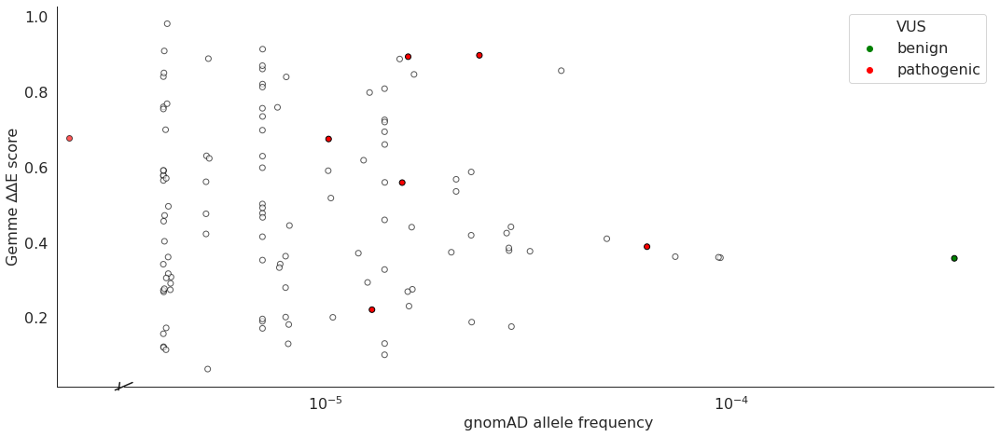

INFO:[nan 'VUS' 'pathogenic' 'benign']
INFO:#accession: P43681
INFO:['gnomad' 'VUS|gnomad' 'unknown' 'VUS' 'conflict|gnomad' 'pathogenic'
 'benign|gnomad']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic' 'benign']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;MOD_RES_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=107)
INFO:[nan  0.  1.]


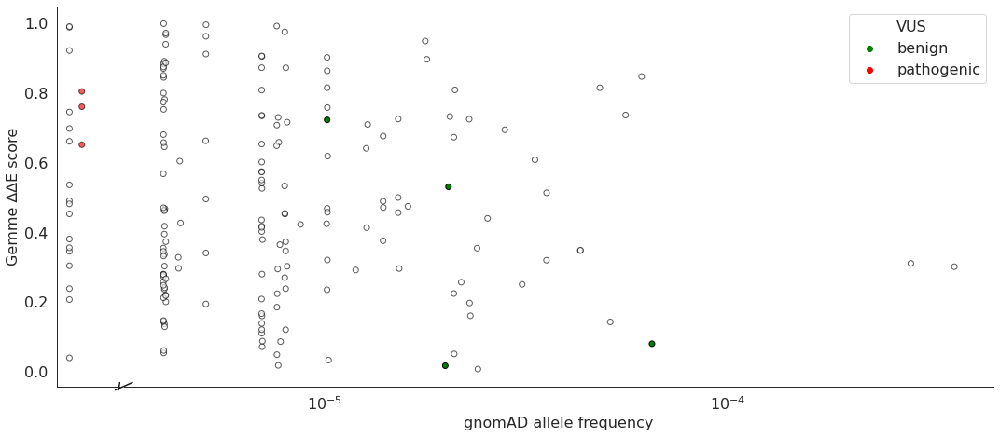

INFO:[nan 'VUS' 'conflict' 'pathogenic' 'benign']
INFO:#accession: Q8N5M9
INFO:['pathogenic' 'benign' 'VUS|gnomad' 'gnomad' 'VUS' 'conflict' 'unknown'
 'benign|gnomad' 'gnomad|pathogenic']
INFO:['pathogenic' 'benign' 'gnomad_low' 'gnomad_high' nan]
INFO:['pathogenic' 'benign' 'VUS' None]
INFO:[ 1.  0. nan]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'pdb;SS_07', 'pdb;ASA_07',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
       'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosett

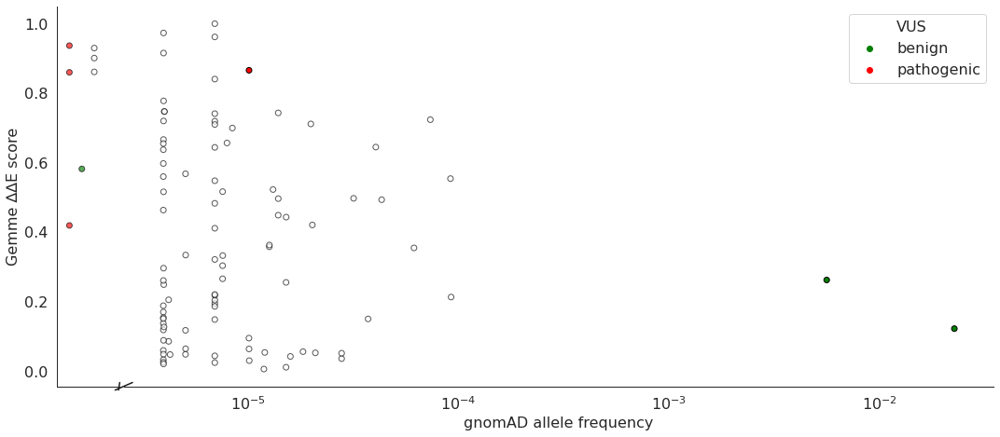

INFO:['pathogenic' 'benign' 'VUS' nan 'conflict']
INFO:#accession: Q99835
INFO:['gnomad' 'unknown' 'benign|gnomad' 'pathogenic']
INFO:['gnomad_low' 'gnomad_high' nan 'benign' 'pathogenic']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00',
       'uniprot;mobi_db_consensus_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnom

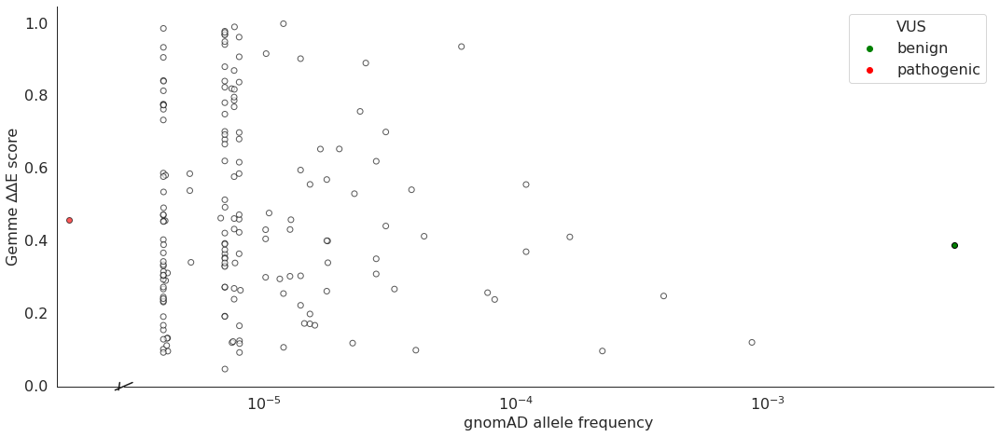

INFO:[nan 'benign' 'pathogenic']
INFO:#accession: Q9H221
INFO:['unknown' 'gnomad' 'VUS|gnomad' 'VUS' 'benign|gnomad']
INFO:[nan 'gnomad_low' 'gnomad_high' 'benign']
INFO:[None 'VUS' 'benign']
INFO:[nan  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;mobidb_lite_00',
       'uniprot;mobi_db_consensus_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
       'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04',
       'rosetta;

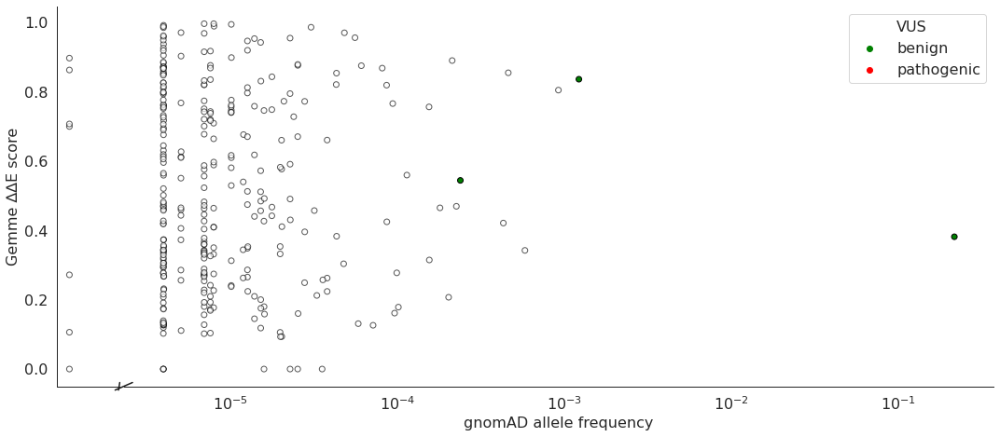

INFO:[nan 'VUS' 'benign']
INFO:#accession: Q9H3H5
INFO:['gnomad' 'unknown' 'VUS' 'VUS|gnomad' 'gnomad|pathogenic'
 'conflict|gnomad' 'pathogenic' 'benign|gnomad']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'pdb;SS_07', 'pdb;ASA_07',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gn

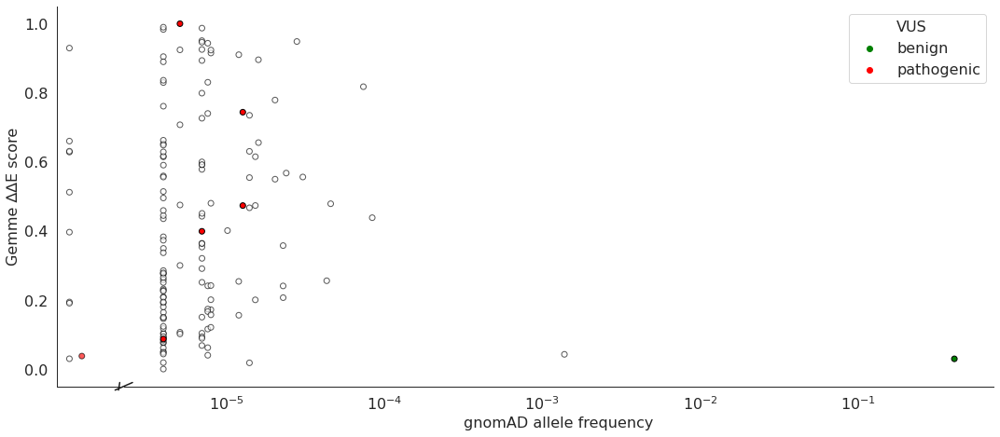

INFO:[nan 'VUS' 'pathogenic' 'conflict' 'benign']
INFO:#accession: Q9ULV1
INFO:['gnomad' 'VUS' 'pathogenic' 'VUS|gnomad' 'gnomad|pathogenic' 'unknown'
 'conflict|gnomad' 'benign' 'benign|gnomad']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'pdb;SS_07', 'pdb;ASA_07',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gno

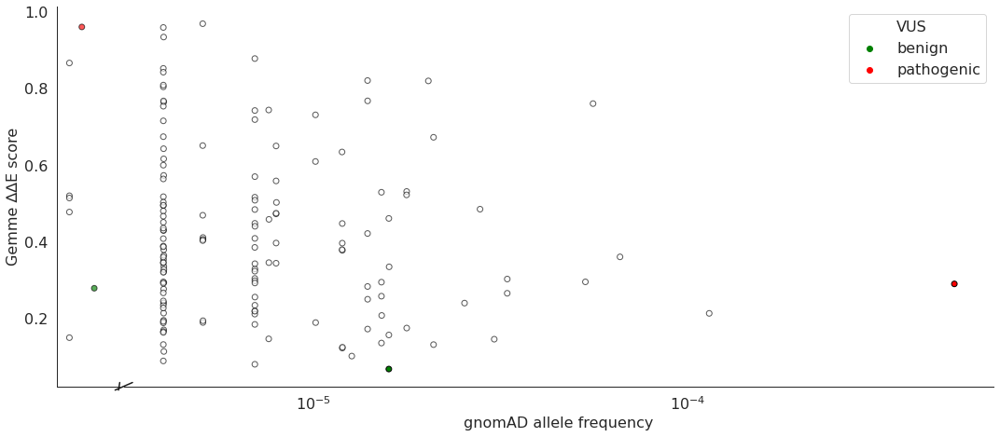

INFO:[nan 'VUS' 'pathogenic' 'conflict' 'benign']
INFO:all
INFO:['VUS' None 'benign' 'pathogenic']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic' 'benign']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'pdb;SS_08', 'pdb;ASA_08', 'spliceai;maxdelta_07', 'spliceai;DS_AG_07',
       'spliceai;DS_AL_07', 'spliceai;DS_DG_07', 'spliceai;DS_DL_07',
       'spliceai;HGVSc_07', 'uniprot;INTRAMEM_00',
       'uniprot;mobi_db_consensus_00'],
      dtype='object', length=117)
INFO:[nan  0.  1.]


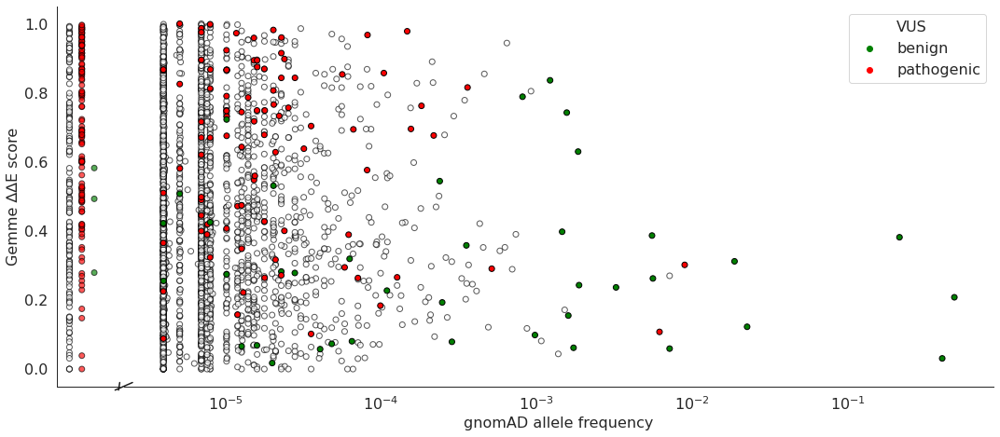

INFO:[nan 'VUS' 'conflict' 'benign' 'pathogenic']


In [43]:
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    
    tmp_energy = target_dic_here[target_uniprot].copy()
    all_tmp.append(tmp_energy)
    
    tmp_energy['label_class_detail'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class_detail'] = tmp_energy['label_class_detail'].apply(lambda x: gnomad_class_anno3(x, split_val=cutoff_value))
    
    logger.info(tmp_energy['label'].unique())
    logger.info(tmp_energy['label_class'].unique())
    logger.info(tmp_energy['label_class_detail'].unique())
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'groupA'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'groupB'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
                   
    logger.info(tmp_energy.columns)
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 25, 'rosetta;ddG'] = 25
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -25, 'rosetta;ddG'] = -25
    min_y = tmp_energy['rosetta;ddG'].min()
    max_y = tmp_energy['rosetta;ddG'].max()
    tmp_energy['label'] = tmp_energy['label_class_detail']
    fishtail_plot_adapt3b(tmp_energy, min_y, max_y, labeling=False)
    logger.info(tmp_energy['clinvar;significance_all'].unique())
    
all_tmp = pd.concat(all_tmp)
for region in ['all', ]:
    logger.info(region)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    tmp_energy['label_class_detail'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class_detail'] = tmp_energy['label_class_detail'].apply(lambda x: gnomad_class_anno3(x, split_val=cutoff_value))

    logger.info(tmp_energy['label'].unique())
    logger.info(tmp_energy['label_class'].unique())
    logger.info(tmp_energy['label_class_detail'].unique())
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'groupA'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'groupB'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    logger.info(tmp_energy.columns)
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 25, 'rosetta;ddG'] = 25
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -25, 'rosetta;ddG'] = -25
    min_y = tmp_energy['rosetta;ddG'].min()
    max_y = tmp_energy['rosetta;ddG'].max()
    tmp_energy['label'] = tmp_energy['label_class_detail']
    fishtail_plot_adapt3b(tmp_energy, min_y, max_y, labeling=False)
    logger.info(tmp_energy['clinvar;significance_all'].unique())


### quadrant count plot

In [44]:
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    all_tmp.append(tmp_energy)
all_tmp = pd.concat(all_tmp)

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1


In [ ]:
x_range = 1
y_range = 0.1

for region in ['all', 'TRANSMEM']:
    logger.info(region)
    tmp_energy = all_tmp.copy()
    title = ''
    if region != 'all':
        title = region
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    def make_groups(x):
        if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
            return 'Q1'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
            return 'Q2'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
            return 'Q3'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
            return 'Q4'
    tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    
    tmpi['c'] = 1
    df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["accession"], values='c', aggfunc=len, margins=True)
    df2.drop(columns=['All'], inplace=True)

    with sns.axes_style("darkgrid"):
        f = plt.figure(figsize=(8,8))
        sns.set(font_scale = 1.2)
        sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, fmt=".0f", vmin=1, vmax=24)
        plt.xlabel('')
        plt.ylabel("Uniprot accession ID", size=15)
        plt.show()

    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

    tmpi2 = tmpi.copy()
    tmpi2['c'] = 1
    df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=["accession"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
    df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
    df2.drop(columns=['All'], inplace=True)
    
    with sns.axes_style("darkgrid"):
        f = plt.figure(figsize=(8,8))
        sns.set(font_scale = 1.2)
        sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, annot=True, fmt=".0%", )
        plt.xlabel('')
        plt.title(title)
        plt.ylabel("Uniprot accession ID", size=15)
        plt.show()
    

INFO:all
INFO:all


<Figure size 576x576 with 0 Axes>

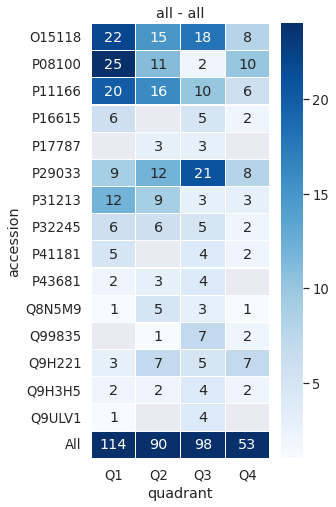

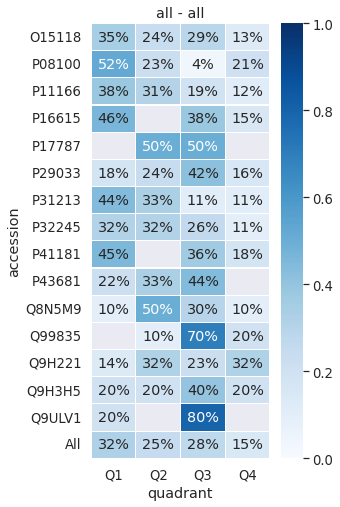

INFO:group A
INFO:all


<Figure size 576x576 with 0 Axes>

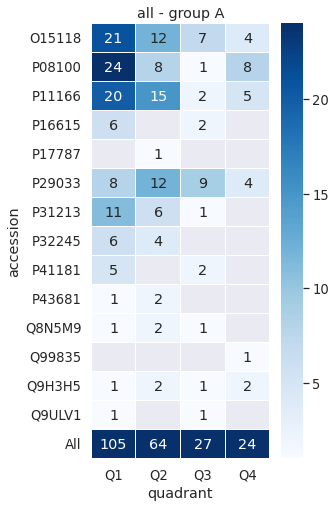

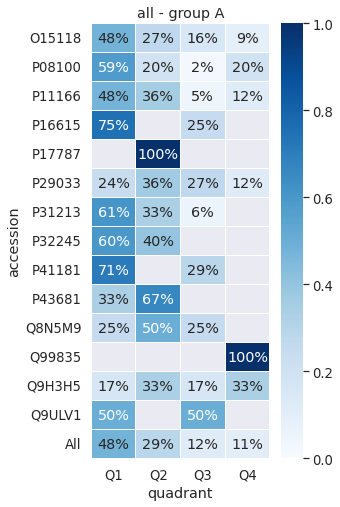

INFO:group B
INFO:all


<Figure size 576x576 with 0 Axes>

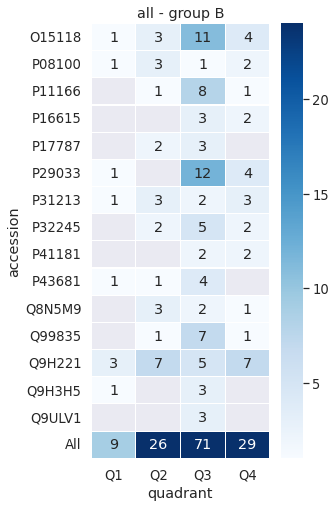

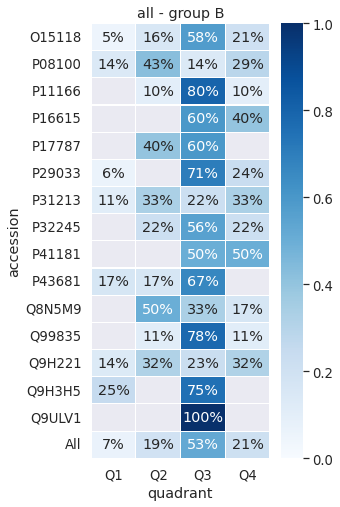

INFO:all
INFO:TRANSMEM


<Figure size 576x576 with 0 Axes>

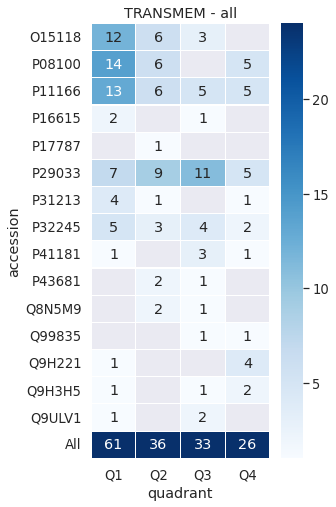

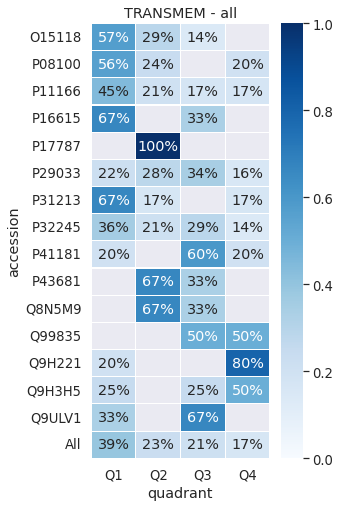

INFO:group A
INFO:TRANSMEM


<Figure size 576x576 with 0 Axes>

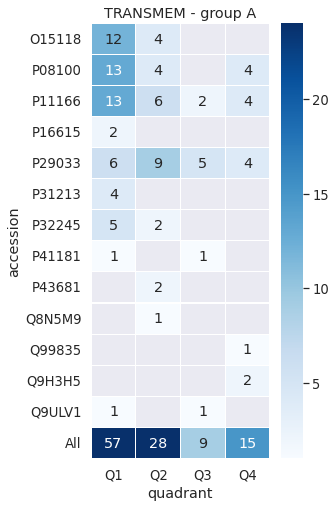

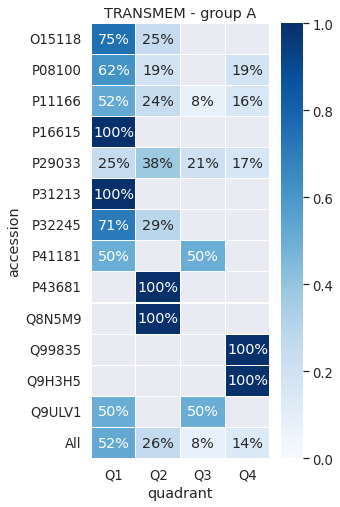

INFO:group B
INFO:TRANSMEM


<Figure size 576x576 with 0 Axes>

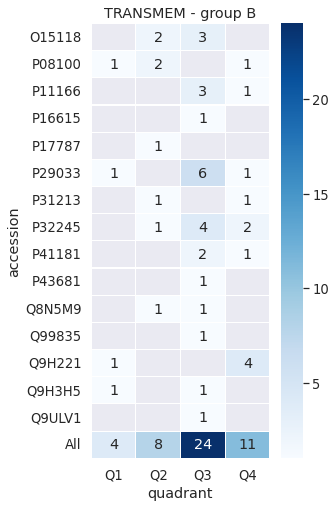

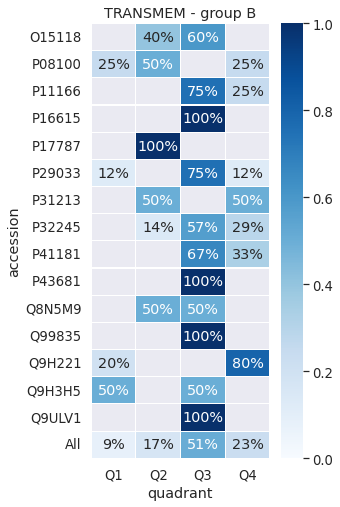

In [46]:
cutoff_value = gnomAD_cutoff_value
x_range = 1
y_range = 0.1
rosetta_grey = False
gemme_grey = False
maxdelta_spliceai_column_global_name = 'maxdelta_spliceai'

for region in ['all', 'TRANSMEM']:
    for case in ['all', 'group A', 'group B']:
        logger.info(case)
        logger.info(region)
        f = plt.figure(figsize=(8,8))
        tmp_energy = all_tmp.copy()
        if region != 'all':
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        def make_groups(x):
            if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
                return 'Q1'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
                return 'Q2'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
                return 'Q3'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
                return 'Q4'
        tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        if case == 'all':
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        else:
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[(tmpi['label']==case)].reset_index(drop=True)
        f = plt.figure(figsize=(4,8))
        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant"], index=["accession"], values='c', aggfunc=len, margins=True)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, fmt=".0f", vmin=1, vmax=24)
        plt.title(f'{region} - {case}')
        plt.show()
        
        if case == 'all':
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        else:
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[(tmpi['label']==case)].reset_index(drop=True)
        tmpi2 = tmpi.copy()
        tmpi2['c'] = 1
        df2 = pd.pivot_table(tmpi2, columns=["quadrant"], index=["accession"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
        df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
        df2.drop(columns=['All'], inplace=True)
        f = plt.figure(figsize=(4,8))
        with sns.axes_style("darkgrid"):
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, annot=True, fmt=".0%", )
        plt.title(f'{region} - {case}')
        plt.show()
    

### Mean & median wt vs mut count plot

INFO:all


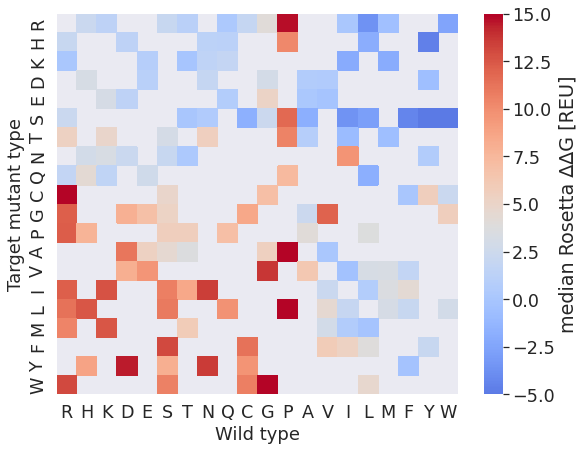

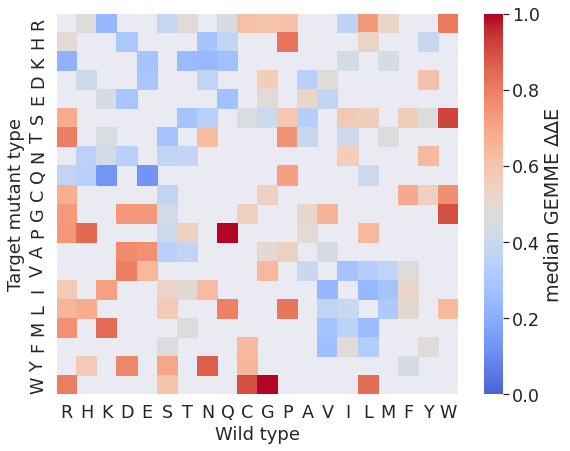

INFO:group A


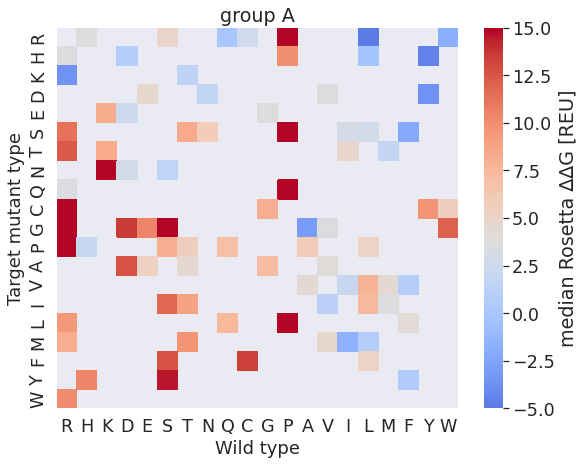

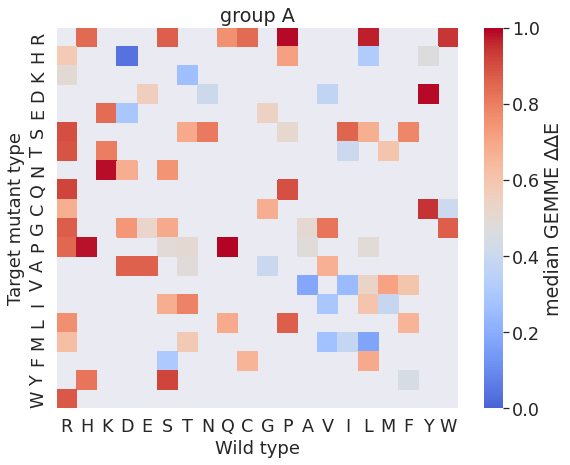

INFO:group B


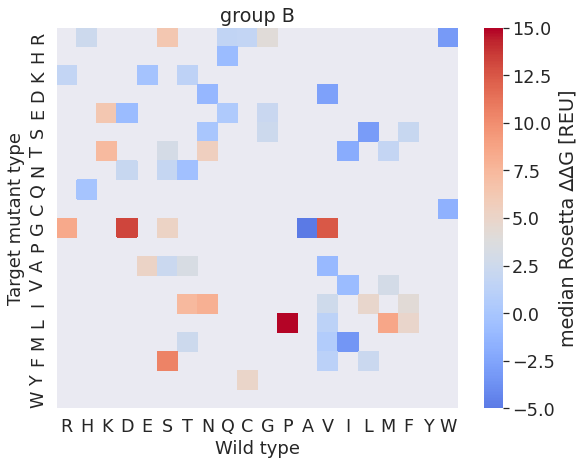

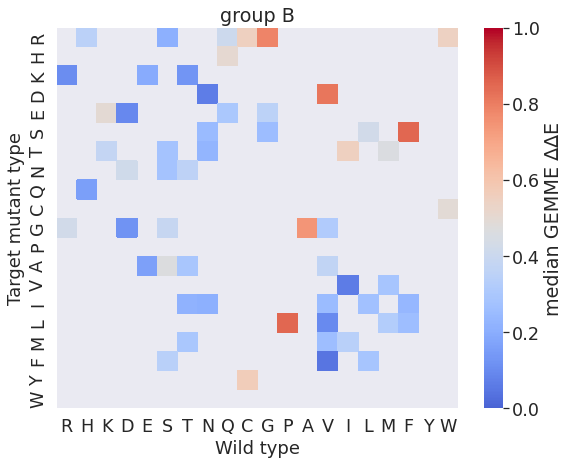

In [47]:
grouped_AA = {"R":1, "H":2, "K":3, "D":4, "E":5, "S":6, "T":7, 
              "N":8, "Q":9, "C":10, "G":11, "P":12, "A":13, 
              "V":14, "I":15, "L":16, "M":17, "F":18, "Y":19, "W":20}
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    tmp_energy['wild type'] = tmp_energy['variant'].apply(lambda x: x[0])
    tmp_energy['mutant'] = tmp_energy['variant'].apply(lambda x: x[-1])
    tmp_energy.loc[tmp_energy['rosetta;ddG']>15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']<-5, 'rosetta;ddG'] = -5
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    all_tmp.append(tmp_energy)

all_tmp = pd.concat(all_tmp).reset_index(drop=True)
for group in ['all', 'group A', 'group B']:
    logger.info(group)
    for aggfunc in ['median', ]:
        heatmap_df = all_tmp.copy()
        title = ''
        if group != 'all':
            title = group
            heatmap_df = heatmap_df.loc[heatmap_df['label']==group].reset_index(drop=True)

        heatmap_df['var'] = heatmap_df['wild type']
        heatmap_df['mut'] = heatmap_df['mutant']
        all_resis = heatmap_df['mut'].unique()
        all_length = len(heatmap_df['mut'].unique())
        min_val = heatmap_df['rosetta;ddG'].min()
        max_val = heatmap_df['rosetta;ddG'].max()
        heatmap_pvt = heatmap_df.copy().reset_index(drop=True)
        heatmap_pvt = heatmap_pvt.pivot_table(index="wild type", columns="mutant", values="rosetta;ddG", aggfunc=aggfunc)

        for elem in ["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]:
            if not elem in heatmap_pvt.columns:
                heatmap_pvt[elem] = [np.nan]*len(heatmap_pvt[heatmap_pvt.columns[0]])
            if not elem in heatmap_pvt.index:
                heatmap_pvt.loc[elem] = [np.nan]*len(heatmap_pvt.columns)
        heatmap_pvt = heatmap_pvt[["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]]
        heatmap_pvt['sorter'] = [grouped_AA[x] for x in heatmap_pvt.index]
        heatmap_pvt = heatmap_pvt.sort_values(by = ['sorter'])
        heatmap_pvt = heatmap_pvt.drop(columns='sorter')
        with sns.axes_style("darkgrid"):
            fig = plt.figure(figsize=(9,7))
            sns.set(font_scale=1.6)
            ax = sns.heatmap(heatmap_pvt, vmax=max_val, vmin=min_val, cmap='coolwarm',center=all_execpt_vals_cat['all'][8], #annot=True, fmt='.1f', annot_kws={"size": 14}, 
                             cbar_kws={'label': f'{aggfunc} Rosetta ∆∆G [REU]', })

            plt.xlabel('Wild type', fontsize=18)
            plt.ylabel('Target mutant type', fontsize=18)
            plt.title(title)
            plt.show()
        heatmap_pvt = heatmap_df.copy().reset_index(drop=True)
        heatmap_pvt = heatmap_pvt.pivot_table(index="wild type", columns="mutant", values="gemme;score", aggfunc=aggfunc)

        for elem in ["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]:
            if not elem in heatmap_pvt.columns:
                heatmap_pvt[elem] = [np.nan]*len(heatmap_pvt[heatmap_pvt.columns[0]])
            if not elem in heatmap_pvt.index:
                heatmap_pvt.loc[elem] = [np.nan]*len(heatmap_pvt.columns)
        heatmap_pvt = heatmap_pvt[["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]]
        heatmap_pvt['sorter'] = [grouped_AA[x] for x in heatmap_pvt.index]
        heatmap_pvt = heatmap_pvt.sort_values(by = ['sorter'])
        heatmap_pvt = heatmap_pvt.drop(columns='sorter')
        with sns.axes_style("darkgrid"):
            fig = plt.figure(figsize=(9,7))
            sns.set(font_scale=1.6)
            ax = sns.heatmap(heatmap_pvt, vmax=1, vmin=0, cmap='coolwarm',center=all_execpt_vals_cat['all'][9], #annot=True, fmt='.1f', annot_kws={"size": 14}, 
                             cbar_kws={'label': f'{aggfunc} GEMME ∆∆E', })#

            plt.xlabel('Wild type', fontsize=18)
            plt.ylabel('Target mutant type', fontsize=18)
            plt.title(title)
            plt.show()


INFO:kdHydrophobicitya
INFO:group A


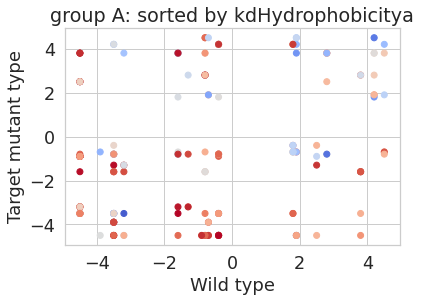

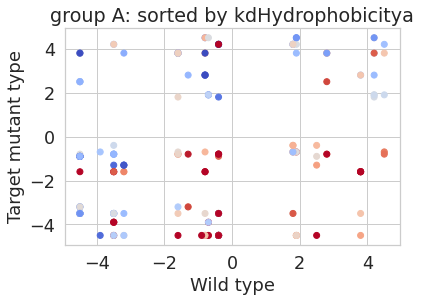

INFO:['R', 'K', 'N', 'D', 'Q', 'E', 'H', 'P', 'Y', 'W', 'S', 'T', 'G', 'A', 'M', 'C', 'F', 'L', 'V', 'I']


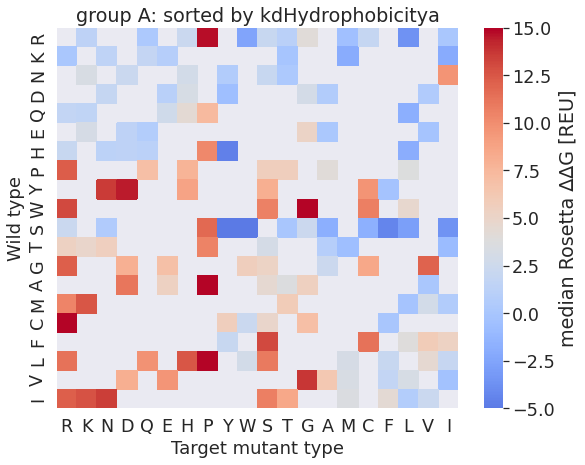

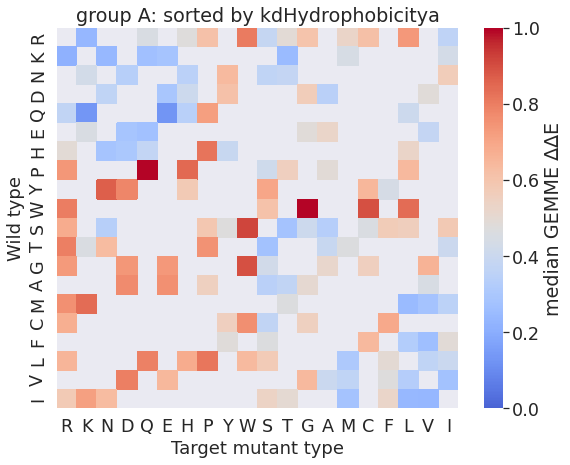

INFO:wwHydrophobicityb
INFO:group A


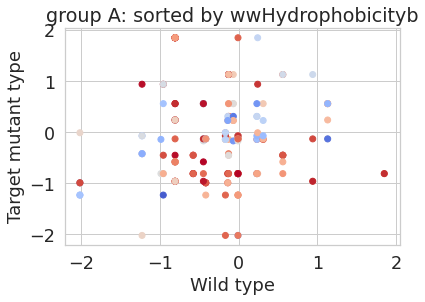

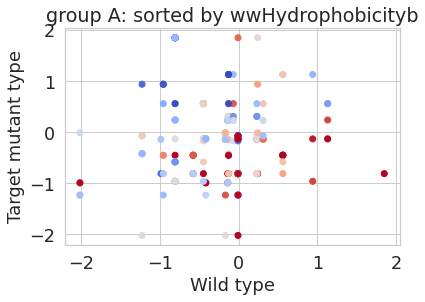

INFO:['E', 'D', 'K', 'H', 'R', 'Q', 'P', 'N', 'A', 'T', 'S', 'V', 'G', 'M', 'C', 'I', 'L', 'Y', 'F', 'W']


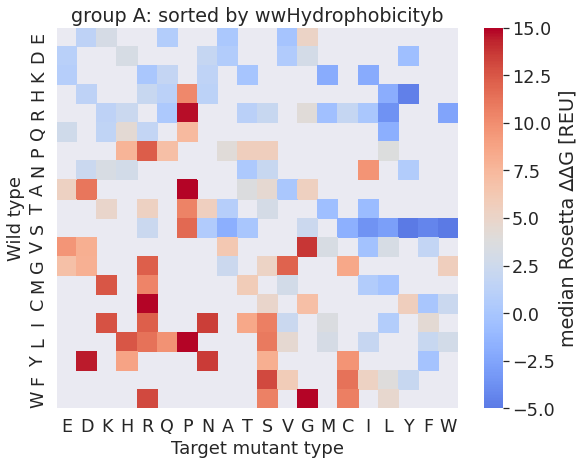

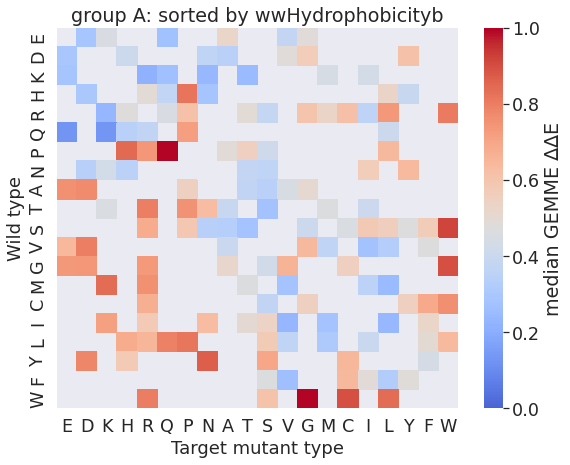

INFO:hhHydrophobicityc
INFO:group A


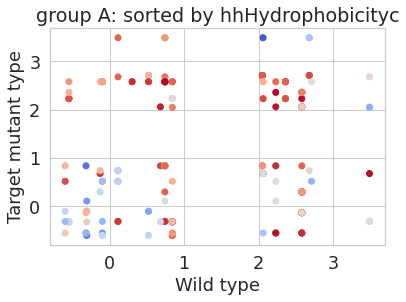

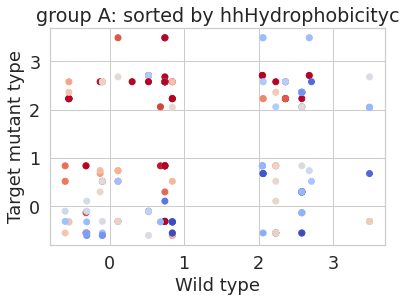

INFO:['I', 'L', 'F', 'V', 'C', 'M', 'A', 'W', 'T', 'Y', 'G', 'S', 'N', 'H', 'P', 'Q', 'R', 'E', 'K', 'D']


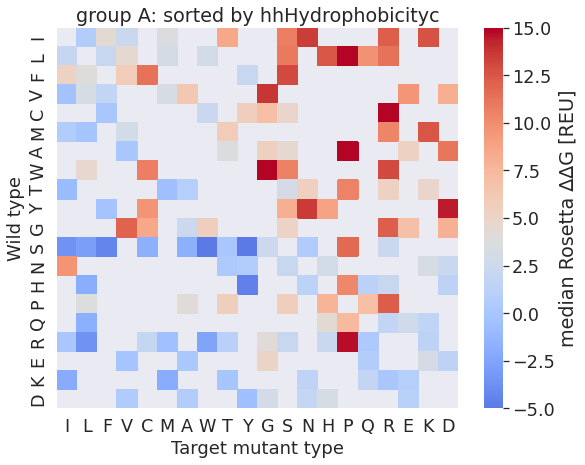

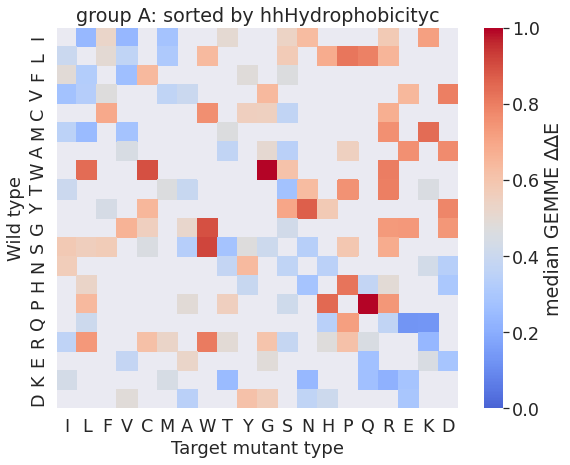

INFO:mfHydrophobicityd
INFO:group A


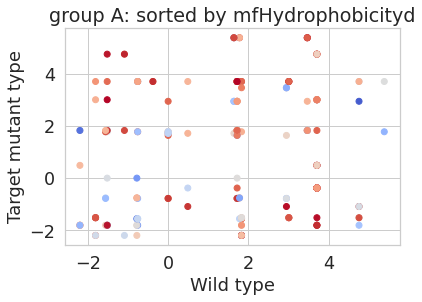

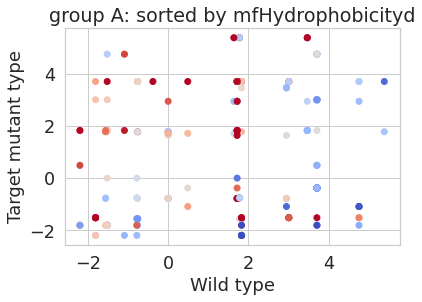

INFO:['F', 'L', 'I', 'P', 'Y', 'V', 'M', 'W', 'A', 'C', 'E', 'G', 'T', 'S', 'D', 'Q', 'N', 'R', 'H', 'K']


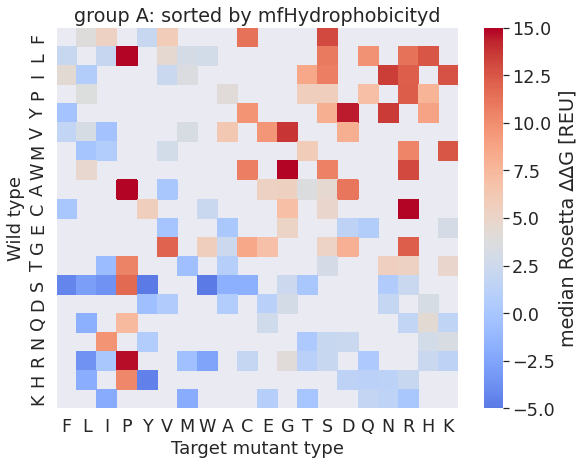

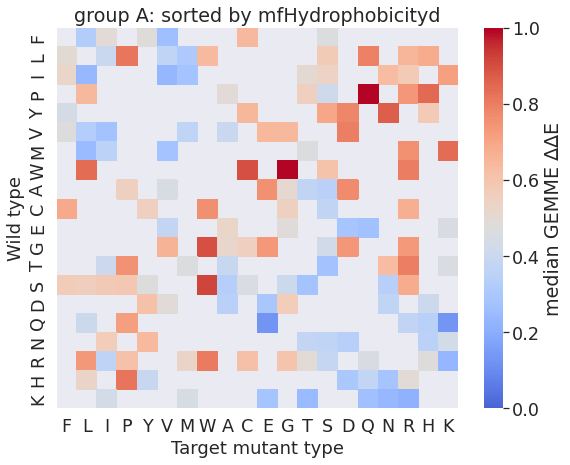

INFO:transmembrane tendency hydrophobicity scale
INFO:group A


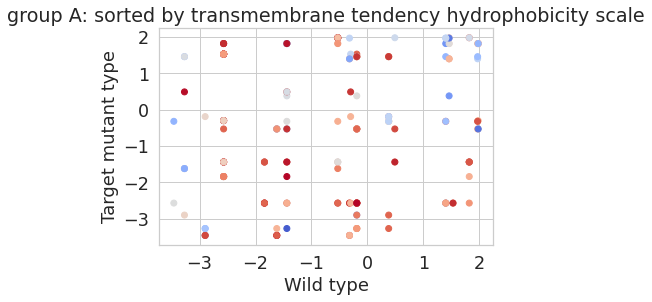

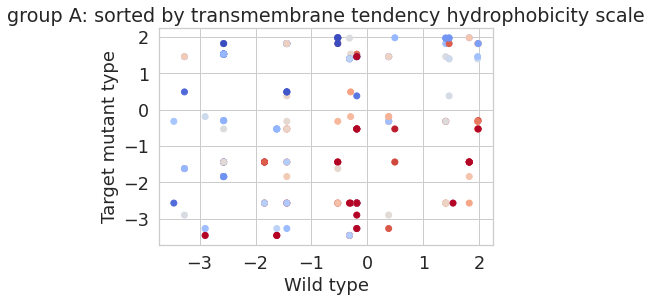

INFO:['K', 'D', 'E', 'R', 'Q', 'N', 'H', 'P', 'S', 'T', 'C', 'G', 'A', 'Y', 'M', 'V', 'W', 'L', 'I', 'F']


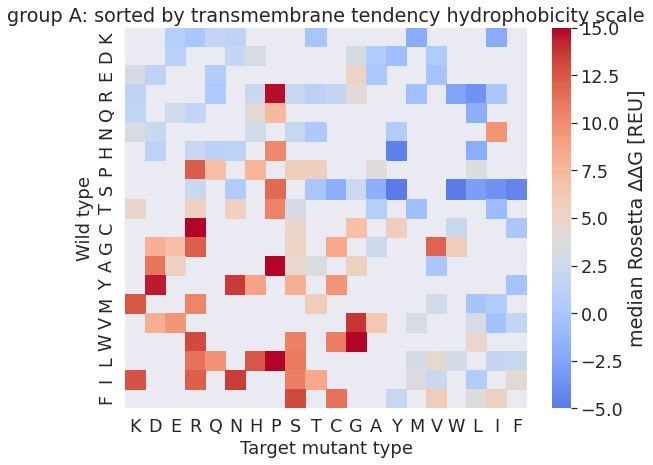

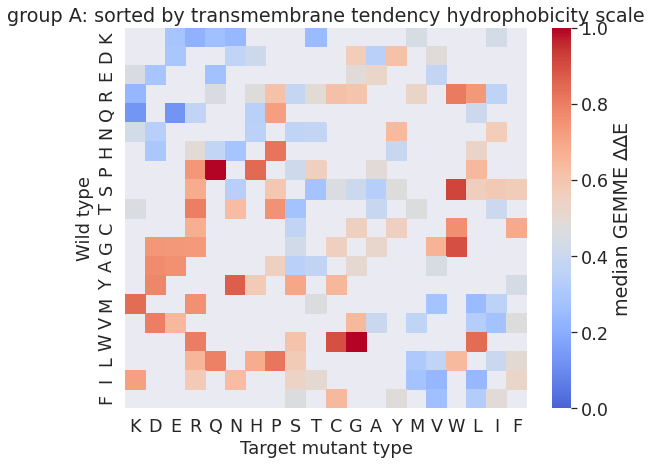

INFO:Residue Weight
INFO:group A


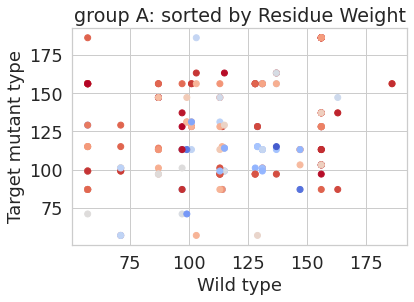

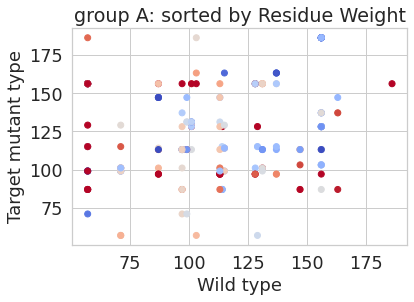

INFO:['G', 'A', 'S', 'P', 'V', 'T', 'C', 'I', 'L', 'N', 'D', 'Q', 'K', 'E', 'M', 'H', 'F', 'R', 'Y', 'W']


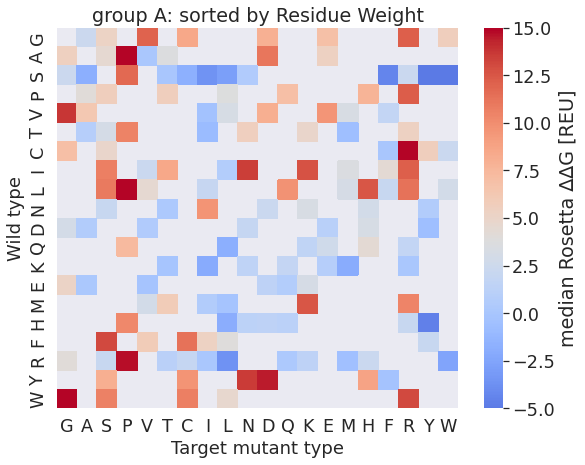

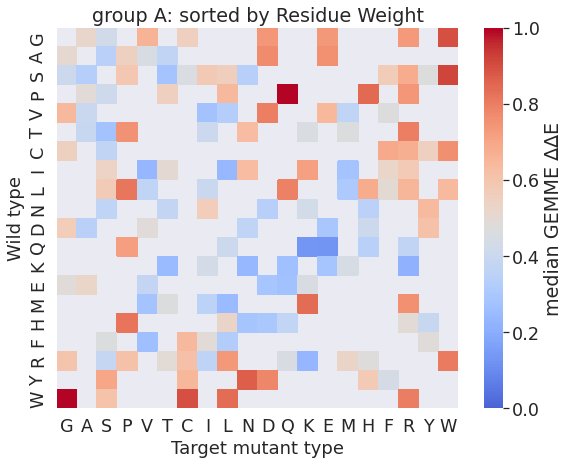

INFO:pKa1
INFO:group A


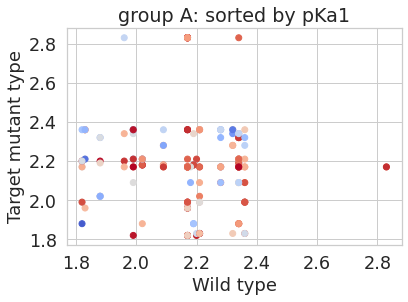

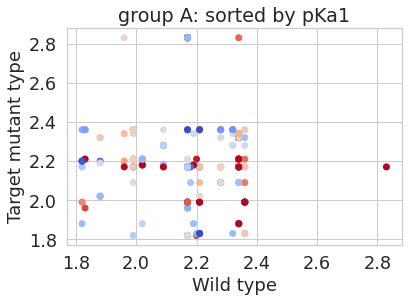

INFO:['H', 'F', 'D', 'C', 'P', 'N', 'T', 'R', 'Q', 'K', 'E', 'Y', 'S', 'M', 'V', 'G', 'A', 'L', 'I', 'W']


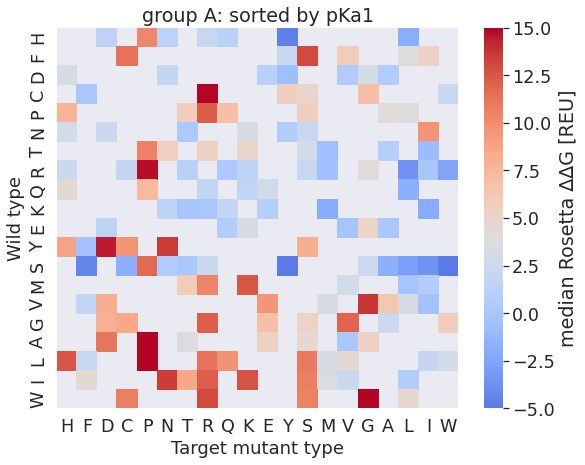

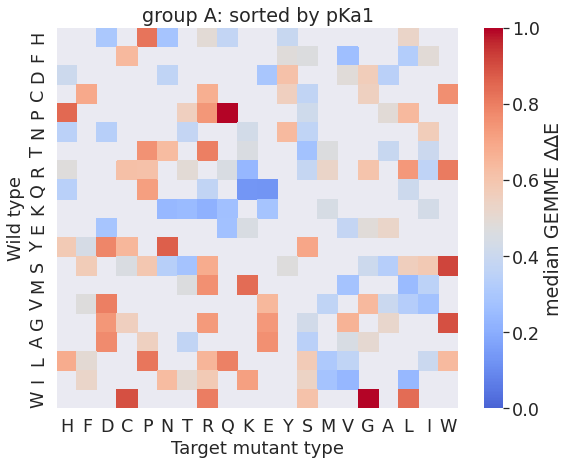

INFO:pKb2
INFO:group A


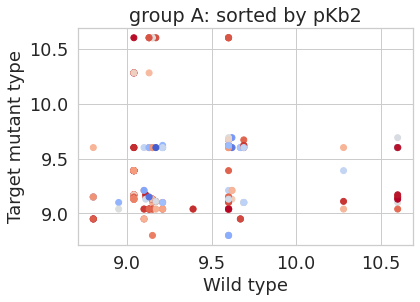

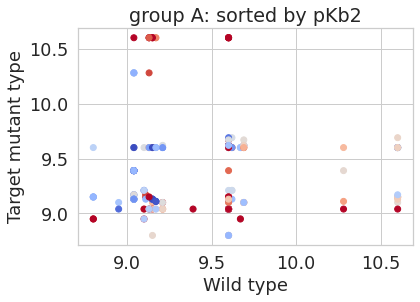

INFO:['N', 'K', 'R', 'T', 'Y', 'Q', 'F', 'S', 'H', 'M', 'W', 'L', 'D', 'G', 'I', 'V', 'E', 'A', 'C', 'P']


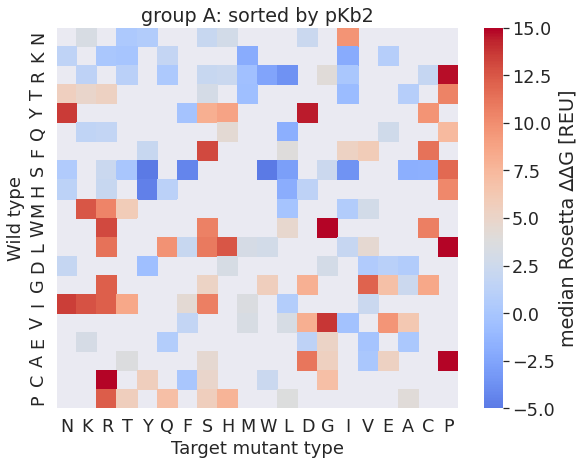

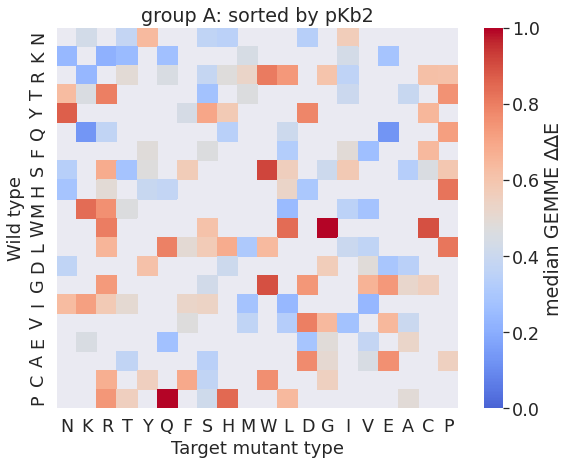

INFO:pKx3
INFO:group A


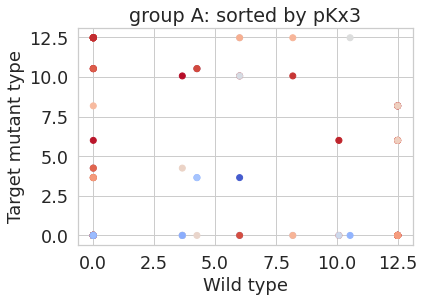

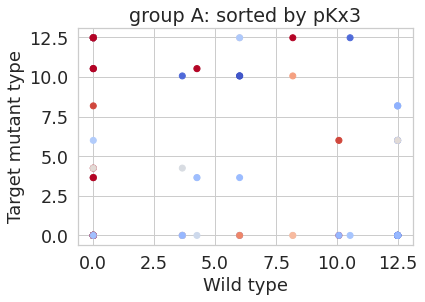

INFO:['I', 'N', 'Q', 'P', 'W', 'T', 'G', 'S', 'M', 'F', 'L', 'V', 'A', 'D', 'E', 'H', 'C', 'Y', 'K', 'R']


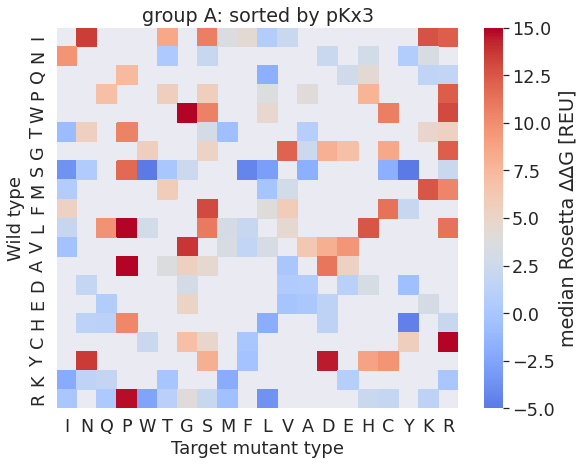

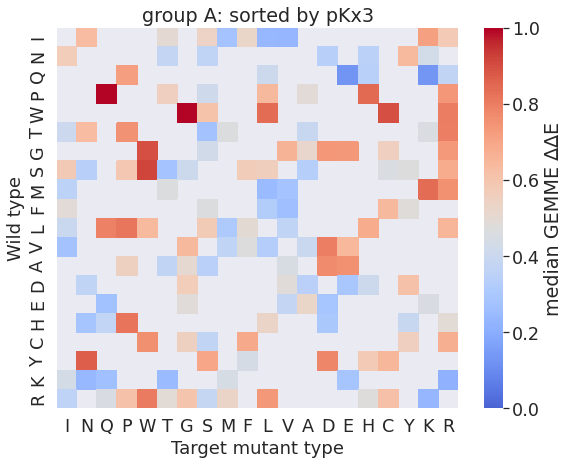

INFO:pl4
INFO:group A


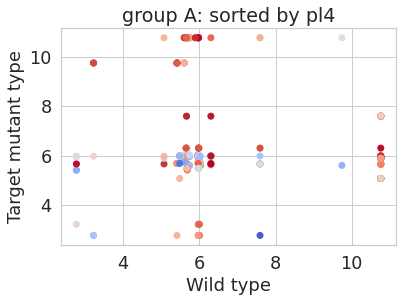

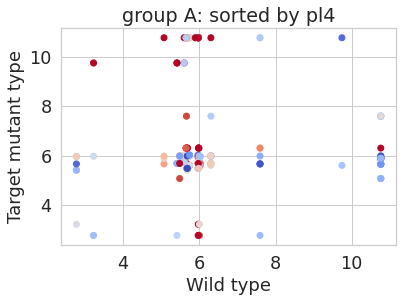

INFO:['D', 'E', 'C', 'N', 'F', 'T', 'Q', 'Y', 'S', 'M', 'W', 'V', 'G', 'L', 'A', 'I', 'P', 'H', 'K', 'R']


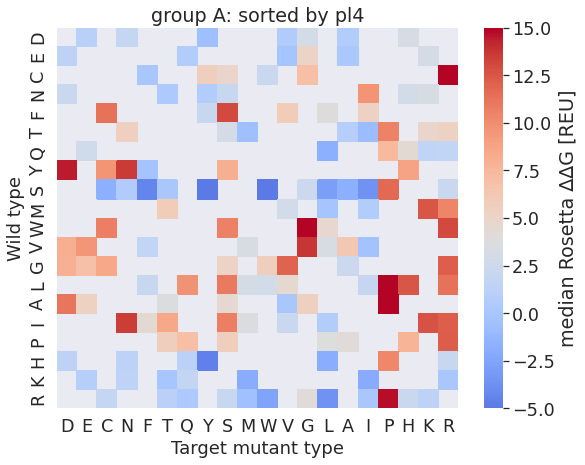

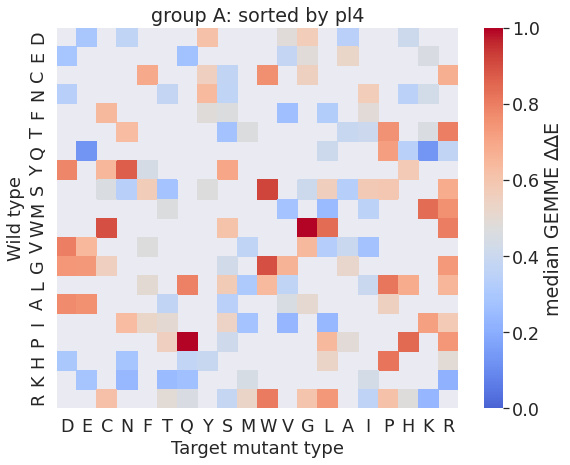

In [48]:
grouped_AA = {"R":1, "H":2, "K":3, "D":4, "E":5, "S":6, "T":7, 
              "N":8, "Q":9, "C":10, "G":11, "P":12, "A":13, 
              "V":14, "I":15, "L":16, "M":17, "F":18, "Y":19, "W":20}

hydrophobicity = {"R":-4.5, "H":2, "K":-3.9, "D":4, "E":5, "S":-0.8, "T":7, 
              "N":8, "Q":9, "C":10, "G":11, "P":12, "A":13, 
              "V":14, "I":15, "L":16, "M":17, "F":18, "Y":19, "W":20}
hydro_index = 0
hydrophobicity_scale = {'method': ['kdHydrophobicitya', 'wwHydrophobicityb', 'hhHydrophobicityc', 
                                   'mfHydrophobicityd', 'transmembrane tendency hydrophobicity scale', 'Residue Weight', 
                                   'pKa1', 'pKb2', 'pKx3', 'pl4'],
'I': [4.5, 0.31, -0.60, -1.56, 1.97, 113.16, 2.36, 9.60, 0, 6.02],
'V': [4.2, -0.07, -0.31, -0.78, 1.46, 99.13, 2.32, 9.62, 0, 5.96],
'L': [3.8, 0.56, -0.55, -1.81, 1.82, 113.16, 2.36, 9.60, 0, 5.98],
'F': [2.8, 1.13, -0.32, -2.20, 1.98, 147.18, 1.83, 9.13, 0, 5.48],
'C': [2.5, 0.24, -0.13, 0.49, -0.30, 103.15, 1.96, 10.28, 8.18, 5.07],
'M': [1.9, 0.23, -0.10, -0.76, 1.40, 131.20, 2.28, 9.21, 0, 5.74],
'A': [1.8, -0.17, 0.11, 0.0, 0.38, 71.08, 2.34, 9.69, 0, 6.00],
'G': [-0.4, -0.01, 0.74, 1.72, -0.19, 57.05, 2.34, 9.60, 0, 5.97],
'T': [-0.7, -0.14, 0.52, 1.78, -0.32, 101.11, 2.09, 9.10, 0, 5.60],
'S': [-0.8, -0.13, 0.84, 1.83, -0.53, 87.08, 2.21, 9.15, 0, 5.68],
'W': [-0.9, 1.85, 0.30, -0.38, 1.53, 186.22, 2.83, 9.39, 0, 5.89],
'Y': [-1.3, 0.94, 0.68, -1.09, 0.49, 163.18, 2.20, 9.11, 10.07, 5.66],
'P': [-1.6, -0.45, 2.23, -1.52, -1.44, 97.12, 1.99, 10.60, 0, 6.30],
'H': [-3.2, -0.96, 2.06, 4.76, -1.44, 137.14, 1.82, 9.17, 6.00, 7.59],
'E': [-3.5, -2.02, 2.68, 1.64, -2.90, 129.12, 2.19, 9.67, 4.25, 3.22],
'Q': [-3.5, -0.58, 2.36, 3.01, -1.84, 128.13, 2.17, 9.13, 0, 5.65],
'D': [-3.5, -1.23, 3.49, 2.95, -3.27, 115.09, 1.88, 9.60, 3.65, 2.77],
'N': [-3.5, -0.42, 2.05, 3.47, -1.62, 114.11, 2.02, 8.80, 0, 5.41],
'K': [-3.9, -0.99, 2.71, 5.39, -3.46, 128.18, 2.18, 8.95, 10.53, 9.74],
'R': [-4.5, -0.81, 2.58, 3.71, -2.57, 156.19, 2.17, 9.04, 12.48, 10.76],}
#https://www.cgl.ucsf.edu/chimera/docs/UsersGuide/midas/hydrophob.html
#https://www.sigmaaldrich.com/DK/en/technical-documents/technical-article/protein-biology/protein-structural-analysis/amino-acid-reference-chart
for hydro_index, hydr in enumerate(hydrophobicity_scale['method']):
    logger.info(hydrophobicity_scale['method'][hydro_index])

    all_tmp = []
    target_dic_here = subfiltered_df_dicts
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        tmp_energy['wild type'] = tmp_energy['variant'].apply(lambda x: x[0])
        tmp_energy['mutant'] = tmp_energy['variant'].apply(lambda x: x[-1])

        tmp_energy['wild type hydrophobicity'] = tmp_energy['variant'].apply(lambda x: hydrophobicity_scale[x[0]][hydro_index])
        tmp_energy['mutant hydrophobicity'] = tmp_energy['variant'].apply(lambda x: hydrophobicity_scale[x[-1]][hydro_index])

        tmp_energy.loc[tmp_energy['rosetta;ddG']>15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']<-5, 'rosetta;ddG'] = -5
        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
        all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp).reset_index(drop=True)
    for group in ['group A']:#'all', 'group A', 'group B']:
        logger.info(group)
        for aggfunc in ['median', ]: #'mean']: 
            all_tmp_tmp = all_tmp.copy()

            title = f"sorted by {hydr}"
            if group != 'all':
                title = f"{group}: {title}"
                all_tmp_tmp = all_tmp_tmp.loc[all_tmp_tmp['label']==group].reset_index(drop=True)

            all_tmp_tmp['var'] = all_tmp_tmp['wild type']
            all_tmp_tmp['mut'] = all_tmp_tmp['mutant']
            min_val = all_tmp_tmp['rosetta;ddG'].min()
            max_val = all_tmp_tmp['rosetta;ddG'].max()

            with sns.axes_style("whitegrid"):
                fig, ax1 = plt.subplots()
                ax1.scatter(all_tmp_tmp['wild type hydrophobicity'], all_tmp_tmp['mutant hydrophobicity'], c=all_tmp_tmp['gemme;score'], vmax=1, vmin=0, cmap='coolwarm')#
                
                plt.xlabel('Wild type', fontsize=18)
                plt.ylabel('Target mutant type', fontsize=18)
                plt.title(title)
                plt.show()

            with sns.axes_style("whitegrid"):
                fig, ax1 = plt.subplots()
                ax1.scatter(all_tmp_tmp['wild type hydrophobicity'], all_tmp_tmp['mutant hydrophobicity'], vmax=max_val, vmin=min_val, c=all_tmp_tmp['rosetta;ddG'], cmap='coolwarm')#
                
                plt.xlabel('Wild type', fontsize=18)
                plt.ylabel('Target mutant type', fontsize=18)
                plt.title(title)
                plt.show()
                
            heatmap_df = all_tmp.copy()
            heatmap_df['var'] = heatmap_df['wild type']
            heatmap_df['mut'] = heatmap_df['mutant']
            all_resis = heatmap_df['mut'].unique()
            all_length = len(heatmap_df['mut'].unique())
            heatmap_pvt = heatmap_df.copy().reset_index(drop=True)
            heatmap_pvt = heatmap_pvt.pivot_table(index="wild type", columns="mutant", values="rosetta;ddG", aggfunc=aggfunc)

            
            #define AA order according to scale
            method = pd.DataFrame.from_dict(hydrophobicity_scale, orient='index', dtype=None, columns=hydrophobicity_scale['method'])
            method = method.iloc[1: , :].reset_index(drop=False)
            aa_order = method.sort_values(by=hydr)['index'].tolist()
            logger.info(aa_order)
            new_grouped_AA = {}
            for index, elem in enumerate(aa_order):
                if not elem in heatmap_pvt.columns:
                    heatmap_pvt[elem] = [np.nan]*len(heatmap_pvt[heatmap_pvt.columns[0]])
                if not elem in heatmap_pvt.index:
                    heatmap_pvt.loc[elem] = [np.nan]*len(heatmap_pvt.columns)
                new_grouped_AA[elem] = index
            heatmap_pvt = heatmap_pvt[aa_order]
            heatmap_pvt['sorter'] = [new_grouped_AA[x] for x in heatmap_pvt.index]
            heatmap_pvt = heatmap_pvt.sort_values(by = ['sorter'])
            heatmap_pvt = heatmap_pvt.drop(columns='sorter')
            with sns.axes_style("darkgrid"):
                fig = plt.figure(figsize=(9,7))
                sns.set(font_scale=1.6)
                ax = sns.heatmap(heatmap_pvt, vmax=max_val, vmin=min_val, cmap='coolwarm',center=all_execpt_vals_cat['all'][8], #annot=True, fmt='.1f', annot_kws={"size": 14}, 
                                 cbar_kws={'label': f'{aggfunc} Rosetta ∆∆G [REU]', })

                plt.ylabel('Wild type', fontsize=18)
                plt.xlabel('Target mutant type', fontsize=18)
                plt.title(title)
                filename = os.path.join(plots_dir, f'FigS7-rosetta_{title}.svg')
                plt.savefig(filename, )
                plt.show()
            heatmap_pvt = heatmap_df.copy().reset_index(drop=True)
            heatmap_pvt = heatmap_pvt.pivot_table(index="wild type", columns="mutant", values="gemme;score", aggfunc=aggfunc)

            for elem in aa_order:
                if not elem in heatmap_pvt.columns:
                    heatmap_pvt[elem] = [np.nan]*len(heatmap_pvt[heatmap_pvt.columns[0]])
                if not elem in heatmap_pvt.index:
                    heatmap_pvt.loc[elem] = [np.nan]*len(heatmap_pvt.columns)
            heatmap_pvt = heatmap_pvt[aa_order]
            heatmap_pvt['sorter'] = [new_grouped_AA[x] for x in heatmap_pvt.index]
            heatmap_pvt = heatmap_pvt.sort_values(by = ['sorter'])
            heatmap_pvt = heatmap_pvt.drop(columns='sorter')
            with sns.axes_style("darkgrid"):
                fig = plt.figure(figsize=(9,7))
                sns.set(font_scale=1.6)
                ax = sns.heatmap(heatmap_pvt, vmax=1, vmin=0, cmap='coolwarm',center=all_execpt_vals_cat['all'][9], #annot=True, fmt='.1f', annot_kws={"size": 14}, 
                                 cbar_kws={'label': f'{aggfunc} GEMME ∆∆E', })#

                plt.ylabel('Wild type', fontsize=18)
                plt.xlabel('Target mutant type', fontsize=18)
                plt.title(title)
                filename = os.path.join(plots_dir, f'FigS7-gemme_{title}.svg')
                plt.savefig(filename, )
                plt.show()
            

### SASA count for quadrant and groups A & B

In [49]:
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
                   
    tmp_energy['res'] = tmp_energy['resi'].apply(lambda x: x[0])
    tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
    tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

    tmp_energy['property_wt'] = tmp_energy['wt'].apply(lambda x: make_property(x))
    tmp_energy['property_var'] = tmp_energy['var'].apply(lambda x: make_property(x))
    def remove_dup(x):
        if type(x)==str:
            x = x.split('|')
            x= list(set(x))
            for elem in x:
                if elem!='':
                    return elem
        else:
            return None
    tmp_energy['SAR'] = ''
    for pdbASA in [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')]:
        tmp_energy['SAR_tmp'] = tmp_energy[pdbASA].apply(lambda x: sasa(x))
        tmp_energy['SAR_tmp'] = tmp_energy['SAR_tmp'].fillna('')
        tmp_energy['SAR'] = tmp_energy['SAR'] +'|'+ tmp_energy['SAR_tmp']
    tmp_energy['SAR'] = tmp_energy['SAR'].apply(lambda x: remove_dup(x) )

    tmp_energy['TMspan'] = ''
    for tmspan_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')]:
        tmp_energy['TMspan_tmp'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
        tmp_energy['TMspan'] = tmp_energy['TMspan'] +'|'+ tmp_energy['TMspan_tmp']
    tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: remove_dup(x) )
    tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: 'TM-region' if x else '')
    tmp_energy['LAR'] = ''
    for lar_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')]:
        tmp_energy['LAR_tmp'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['LAR'] = tmp_energy['LAR'] +'|'+ tmp_energy['LAR_tmp']
    tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: remove_dup(x) )
    tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: 'lipid-facing' if x else '')
    tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

    def tmpiii_ds(x):
        if type(x)!=float:
            return '|'.join(list(filter(None, x.split('|')))) 
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

    tmp_energy['position_backup'] = tmp_energy['position']
    
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: x if x in 
                                                          ['buried', 'solvent-accessible',  'TM-region|buried', 
                                                           'TM-region|lipid-facing|solvent-accessible', 
                                                           'TM-region|lipid-facing|buried'] else 'others')
    all_tmp.append(tmp_energy)
all_tmp = pd.concat(all_tmp)
logger.info(all_tmp['position_backup'].unique())
logger.info(all_tmp['position'].unique())


INFO:['solvent-accessible' 'buried' 'TM-region|lipid-facing|buried'
 'TM-region|lipid-facing|solvent-accessible' 'lipid-facing|buried'
 'TM-region|buried' 'lipid-facing|solvent-accessible' None
 'TM-region|solvent-accessible']
INFO:['solvent-accessible' 'buried' 'TM-region|lipid-facing|buried'
 'TM-region|lipid-facing|solvent-accessible' 'others' 'TM-region|buried']


In [ ]:
x_range = 1
y_range = 0.1

for region in ['all']:
    logger.info(region)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    def make_groups(x):
        if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
            return 'Q1'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
            return 'Q2'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
            return 'Q3'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
            return 'Q4'
    tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    
    tmpi['c'] = 1
    df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)
    df2.drop(columns=['All'], inplace=True)

    logger.info(df2.columns)
    hue_order=['TM-region|lipid-facing|solvent-accessible', 'TM-region|lipid-facing|buried', 
               'TM-region|buried', 'solvent-accessible', 'buried', 'others']

    
    with sns.axes_style("darkgrid"):
        f = plt.figure(figsize=(8,3))
        sns.set(font_scale = 1.2)
        sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, fmt=".0f", vmin=1, vmax=39,
                   )
        plt.xlabel('')
        plt.ylabel("", size=15)
        plt.show()

    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

    tmpi2 = tmpi.copy()
    tmpi2['c'] = 1
    df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
    df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
    df2.drop(columns=['All'], inplace=True)
    
    with sns.axes_style("darkgrid"):
        f = plt.figure(figsize=(8,3))
        sns.set(font_scale = 1.2)
        sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, annot=True, fmt=".0%", )
        plt.xlabel('')
        plt.ylabel("", size=15)
        plt.show()

    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))
    
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    logger.info(tmp_energy['gnomad;AF_tot_first'])
    
    with sns.axes_style("whitegrid"):
        sns.set(font_scale = 1.0)
        sns.set(style = 'white')
        f = plt.figure(figsize=(8,8))
        tmpi = tmp_energy.copy()
        
        tmpi = tmpi.loc[(tmpi['label']=='group B')].reset_index(drop=True)
        tmpi['position2'] = tmpi['position'] + tmpi['label']

        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='position', marginal_kws=dict(fill=False), 
                          hue_order = hue_order, marker='s',
                          palette = ['#0096e3', '#d477ff', '#44e2f7', '#00ed00', '#ff15bb', '#dada00',]
                         )
        key = 'all'#target_uniprot

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_joint.set_ylim(-0.05,1.05)
        g.ax_joint.set_xlim(-6.5,16.5)
        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')

        filename = os.path.join(plots_dir, f'FigS8-groupB.svg')
        plt.savefig(filename, )
        plt.show()


In [51]:
tmpi = tmp_energy.copy()
tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
logger.info(tmpi['position_backup'].unique())
tmpi['c'] = 1
df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)
df2 = df2.fillna(0)
df2.columns
df2['All']
tmpi[['variant', 'label', 'position']]
logger.info(tmpi['position'].unique())
tmpi.loc[~tmpi['position'].isin(['solvent-accessible', 'buried', 'others', 'TM-region|lipid-facing|buried',
 'TM-region|buried'])][['variant', 'label', 'position', 'quadrant']]#['variant'].tolist()
for elem in ['solvent-accessible', 
                    'buried', 
                    'TM-region|lipid-facing|buried', 
                    'TM-region|buried', 
                    'TM-region|lipid-facing|solvent-accessible', 
                    'lipid-facing|buried', 
            ]:
    print(elem)
    print(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist())


INFO:['TM-region|lipid-facing|solvent-accessible' 'solvent-accessible' 'buried'
 'TM-region|lipid-facing|buried' 'TM-region|buried' 'lipid-facing|buried'
 None 'lipid-facing|solvent-accessible']
INFO:['TM-region|lipid-facing|solvent-accessible' 'solvent-accessible' 'buried'
 'TM-region|lipid-facing|buried' 'TM-region|buried' 'others']


solvent-accessible
['S385G', 'R518Q', 'R518W', 'A521S', 'N589S', 'L684F', 'I858V', 'D874V', 'G911S', 'D948N', 'R978C', 'G992R', 'G1073S', 'R1183H', 'E1189G', 'T17K', 'T17M', 'R147C', 'E150K', 'Q46H', 'R223W', 'D236V', 'K255T', 'A267T', 'R269C', 'E299K', 'E121D', 'K543E', 'E34G', 'H71Q', 'H100L', 'H100Y', 'G130A', 'D159N', 'G160S', 'K168R', 'G183S', 'R165Q', 'I269N', 'R305W', 'G64R', 'G114R', 'R99H', 'R333C', 'M1I', 'M1V', 'R22C', 'R113Q', 'R144H', 'R168H', 'R173C', 'R173H', 'E224D', 'R164Q', 'R204H', 'S241F', 'A342S', 'R247W', 'F332V', 'H346D', 'N461S', 'K506R']
buried
['R389C', 'R404Q', 'R404W', 'I450V', 'T511M', 'P543L', 'G640R', 'R711G', 'R714H', 'I787V', 'R789H', 'S870T', 'P887L', 'G910S', 'A926T', 'A926V', 'A927V', 'R934Q', 'D944N', 'G1034R', 'A1035V', 'I1061T', 'F1087L', 'D1097N', 'A1151T', 'R1186H', 'A1187G', 'A1187T', 'A1187V', 'F1224C', 'P23S', 'T70M', 'N73S', 'G106R', 'G106V', 'G106W', 'G109R', 'R135L', 'R135W', 'P180A', 'P180L', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', '

[114.0, 90.0, 98.0, 53.0]


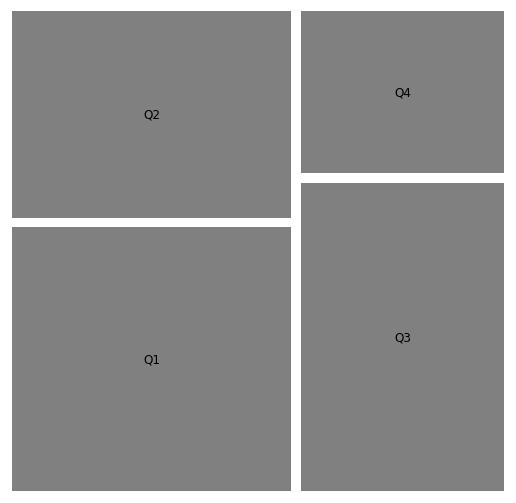

([114.0, 90.0, 98.0, 53.0], ['Q1', 'Q2', 'Q3', 'Q4'])

In [52]:
quadrant = 'Q4'
label = ['Q1', 'Q2', 'Q3', 'Q4']
labels = []
sizes = []
for lab in label:
    if df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'] > 0:
        sizes.append(df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS8-base_all.svg')
plt.savefig(filename, )
plt.show()

sizes,labels

[5.0, 40.0, 6.0, 47.0, 13.0, 3.0]


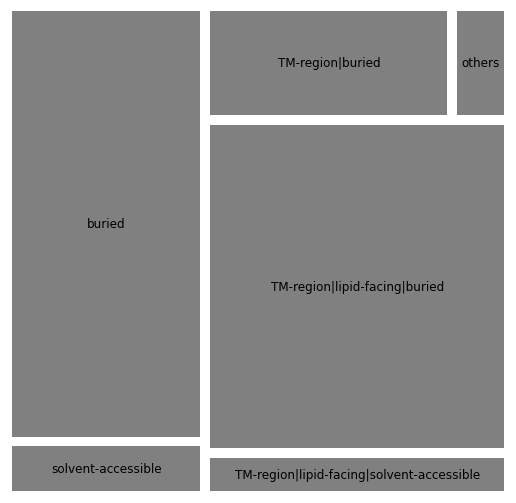

([5.0, 40.0, 6.0, 47.0, 13.0, 3.0],
 ['solvent-accessible',
  'buried',
  'TM-region|lipid-facing|solvent-accessible',
  'TM-region|lipid-facing|buried',
  'TM-region|buried',
  'others'])

In [53]:
quadrant = 'Q1'
#['#D55C00', '#56B4E9', ]

label = ['solvent-accessible', 'buried', 'TM-region|lipid-facing|solvent-accessible',
 'TM-region|lipid-facing|buried', 'TM-region|buried', 'others']
labels = []
sizes = []
for lab in label:
    if df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab] > 0:
        sizes.append(df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS8-base_{quadrant}.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

In [ ]:
target_dic_here = subfiltered_df_dicts
all_tmp = []
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    if gemme_name == 'gemme;score;ori':
        tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)

    pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
    tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
    tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
    tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
    lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
    tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
    tmp_energy['LAR'].unique()
    tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

    def tmpiii_ds(x):
        if type(x)!=float:
            return '|'.join(list(filter(None, x.split('|')))) 
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

    tmp_energy['position_backup'] = tmp_energy['position']
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)

    tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

    tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
    tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
    all_tmp.append(tmp_energy)

all_tmp = pd.concat(all_tmp)
title_raw = ''
for region in ['all', 'TRANSMEM']:
    logger.info(region)
    tmp_energy = all_tmp.copy()

    if region != 'all':
        title_raw = title_raw + f' {region} -'
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    y_value = "rosetta;ddG"
    ylabel = 'Rosetta ∆∆G [REU]'
    typee = 'ddG'
    min_y = 50
    max_y =  tmp_energy[y_value].min()
    logger.info(tmp_energy['label'].unique())
    y_value = "gemme;score"
    ylabel = 'GEMME ∆∆E'
    typee = 'ddE'
    min_y = tmp_energy[y_value].min()
    max_y =  tmp_energy[y_value].max()
    r_max = tmp_energy["rosetta;ddG"].max()
    r_min =  tmp_energy["rosetta;ddG"].min()
    g_max = 0
    g_min = tmp_energy["gemme;score"].min()

    groupA = len(tmp_energy[tmp_energy['score']==1].reset_index(drop=True)['score'])
    groupB = len(tmp_energy[tmp_energy['score']==0].reset_index(drop=True)['score'])
    logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

    def label_gorup_class(x):
        if x==1:
            return 'groupA' 
        else:
            return 'groupB'
    logger.info(tmp_energy['score'].unique())
    tmp_energy['label'] = tmp_energy['score'].apply(lambda x: label_gorup_class(x))

    tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
    tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

    tmp_energy['wt AA property'] = tmp_energy['wt'].apply(lambda x: make_property2(x))
    tmp_energy['var AA property'] = tmp_energy['var'].apply(lambda x: make_property2(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    x_range = 1
    y_range = 0.1
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    def make_groups(x):
        if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
            return 'Q1'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
            return 'Q2'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
            return 'Q3'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
            return 'Q4'
    tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    for hue in ['wt AA property', 'var AA property']:
        title = f'{title_raw} {hue}'
        tmpi = tmp_energy.copy()
        sorter = ['CHARGED', 'special', 'polar', 'hydrophobic']
        tmpi[hue] = tmpi[hue].astype("category")
        tmpi[hue].cat.set_categories(sorter, inplace=True)
        tmpi.sort_values([hue])
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                        fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        tmpi[hue] = tmpi[hue].astype("category")
        tmpi[hue].cat.set_categories(sorter, inplace=True)
        tmpi.sort_values([hue])
        
        tmpi2 = tmpi.copy()
        tmpi2['c'] = 1
        df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
        df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, 
                        annot=True, fmt=".0%", )
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()


In [ ]:
target_dic_here = subfiltered_df_dicts
all_tmp = []
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    if gemme_name == 'gemme;score;ori':
        tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    all_tmp.append(tmp_energy)

all_tmp = pd.concat(all_tmp)
title_raw = ''
for region in ['all', 'TRANSMEM', ]:
    logger.info(region)
    tmp_energy = all_tmp.copy()

    if region != 'all':
        title_raw = title_raw + f' {region} -'
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    y_value = "rosetta;ddG"
    ylabel = 'Rosetta ∆∆G [REU]'
    typee = 'ddG'
    min_y = 50
    max_y =  tmp_energy[y_value].min()
    logger.info(tmp_energy['label'].unique())
    y_value = "gemme;score"
    ylabel = 'GEMME ∆∆E'
    typee = 'ddE'
    min_y = tmp_energy[y_value].min()
    max_y =  tmp_energy[y_value].max()
    r_max = tmp_energy["rosetta;ddG"].max()
    r_min =  tmp_energy["rosetta;ddG"].min()
    g_max = 0
    g_min = tmp_energy["gemme;score"].min()

    groupA = len(tmp_energy[tmp_energy['score']==1].reset_index(drop=True)['score'])
    groupB = len(tmp_energy[tmp_energy['score']==0].reset_index(drop=True)['score'])
    logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

    def label_gorup_class(x):
        if x==1:
            return 'groupA' 
        else:
            return 'groupB'
    logger.info(tmp_energy['score'].unique())
    tmp_energy['label'] = tmp_energy['score'].apply(lambda x: label_gorup_class(x))

    tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
    tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

    tmp_energy['wt AA property'] = tmp_energy['wt'].apply(lambda x: make_property2(x))
    tmp_energy['var AA property'] = tmp_energy['var'].apply(lambda x: make_property2(x))
    tmp_energy['AA property'] = tmp_energy['wt AA property']+ ' to ' + tmp_energy['var AA property']


    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    x_range = 1
    y_range = 0.1
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    def make_groups(x):
        if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
            return 'Q1'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
            return 'Q2'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
            return 'Q3'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
            return 'Q4'
    tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    for hue in ['AA property', ]:#'wt AA property', 'var AA property']:
        title = f'{title_raw} {hue}'
        tmpi = tmp_energy.copy()
        if hue == 'AA property':
            figsize = (6,8)
            sorter_base = ['charged', 'special', 'polar', 'hydrophobic']
            sorter = []
            for base in sorter_base:
                for base2 in sorter_base:
                    sorter.append(f"{base} to {base2}")
        else:
            figsize = (8,3)
            sorter = ['positive', 'negative', 'special', 'polar', 'hydrophobic']
        tmpi[hue] = tmpi[hue].astype("category")
        tmpi[hue].cat.set_categories(sorter, inplace=True)
        tmpi.sort_values([hue])
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=figsize)
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                        fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            filename = os.path.join(plots_dir, f'FigS7b-base_{region}.svg')
            plt.savefig(filename, )
            plt.show()


## investigate protein categories

In [56]:
categories = list(set([target[2][0] for target in target_list]))
logger.info(categories)
protein_categories = {'Transporter':[], 'Cell Junction':[], 'Ion channel':[], 'Enzyme':[], 'GPCR':[]}
for target in target_list:
    protein_categories[target[2][0]].append(target[0])
logger.info(protein_categories)
#protein_categories = {'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1']}
protein_categories

INFO:['GPCR', 'Cell Junction', 'Ion channel', 'Transporter', 'Enzyme']
INFO:{'Transporter': ['O15118', 'P11166', 'P16615', 'Q8N5M9', 'Q9H221', 'Q9H222'], 'Cell Junction': ['P29033'], 'Ion channel': ['P17787', 'P41181', 'P43681'], 'Enzyme': ['P31213', 'Q9H3H5'], 'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1']}


{'Transporter': ['O15118', 'P11166', 'P16615', 'Q8N5M9', 'Q9H221', 'Q9H222'],
 'Cell Junction': ['P29033'],
 'Ion channel': ['P17787', 'P41181', 'P43681'],
 'Enzyme': ['P31213', 'Q9H3H5'],
 'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1']}

### ROC curves

INFO:Cell Junction
INFO:all
INFO:7.097735196763732e-05
INFO:5
INFO:groupA: 33
groupB: 17


7.097735196763732e-05
Ensemble test roc-auc:0.43315508021390375
Ensemble test roc-auc:0.8467023172905527


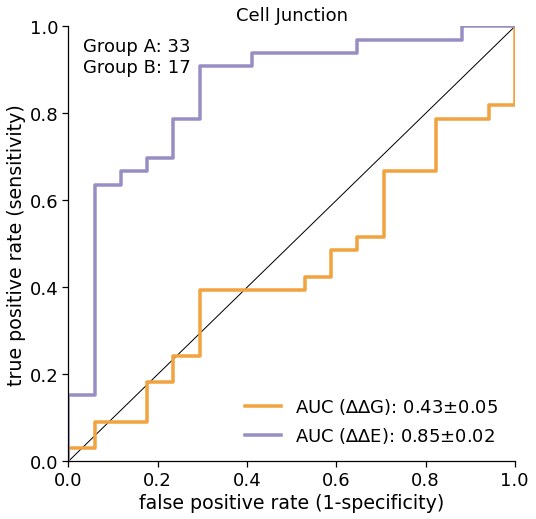

INFO:TRANSMEM
INFO:7.097735196763732e-05
INFO:4
INFO:groupA: 24
groupB: 8


7.097735196763732e-05
Ensemble test roc-auc:0.46875
Ensemble test roc-auc:0.78125


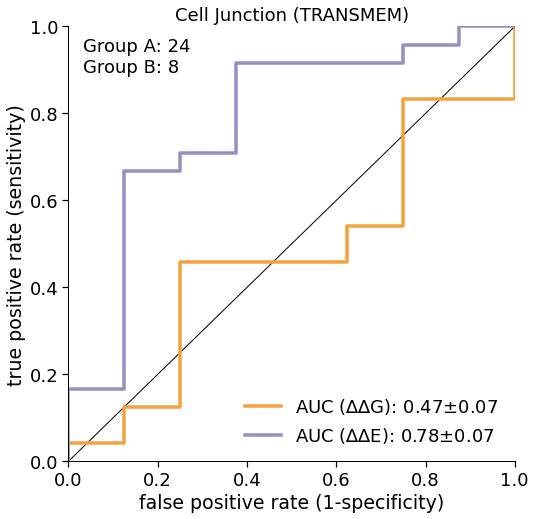

INFO:Enzyme
INFO:all
INFO:7.097735196763732e-05
INFO:6
INFO:groupA: 24
groupB: 13


7.097735196763732e-05
Ensemble test roc-auc:0.6121794871794872
Ensemble test roc-auc:0.7916666666666666


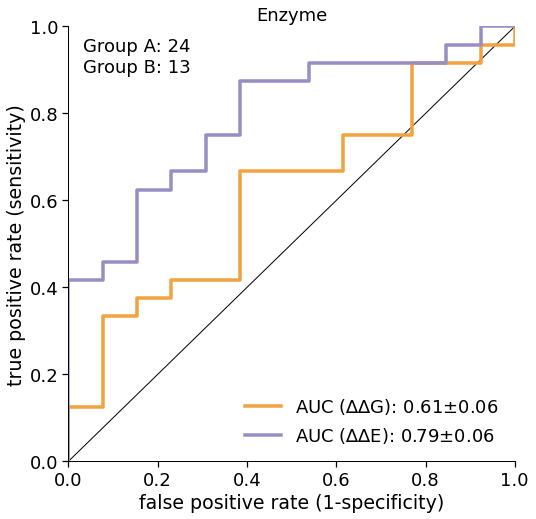

INFO:TRANSMEM
INFO:7.097735196763732e-05
INFO:2
INFO:groupA: 6
groupB: 4


7.097735196763732e-05
Ensemble test roc-auc:0.9583333333333334
Ensemble test roc-auc:0.7916666666666666


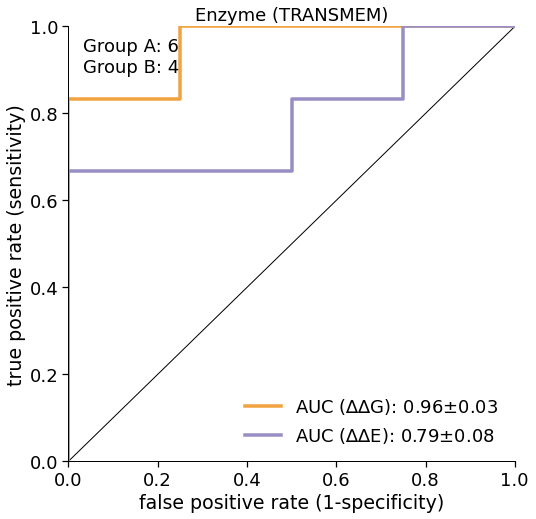

INFO:GPCR
INFO:all
INFO:7.097735196763732e-05
INFO:6
INFO:groupA: 54
groupB: 28


7.097735196763732e-05
Ensemble test roc-auc:0.7929894179894179
Ensemble test roc-auc:0.8333333333333334


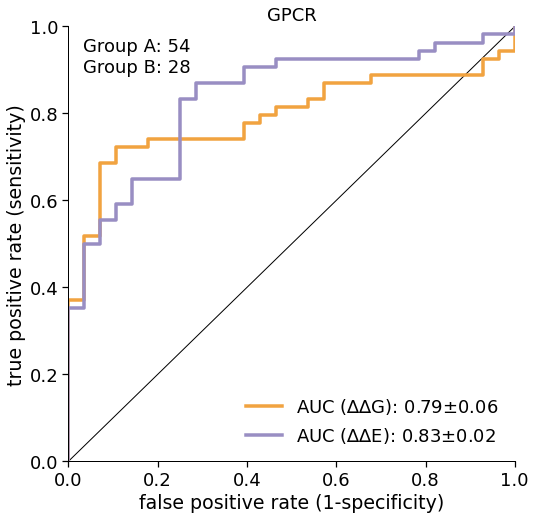

INFO:TRANSMEM
INFO:7.097735196763732e-05
INFO:2
INFO:groupA: 31
groupB: 13


7.097735196763732e-05
Ensemble test roc-auc:0.8263027295285359
Ensemble test roc-auc:0.8560794044665012


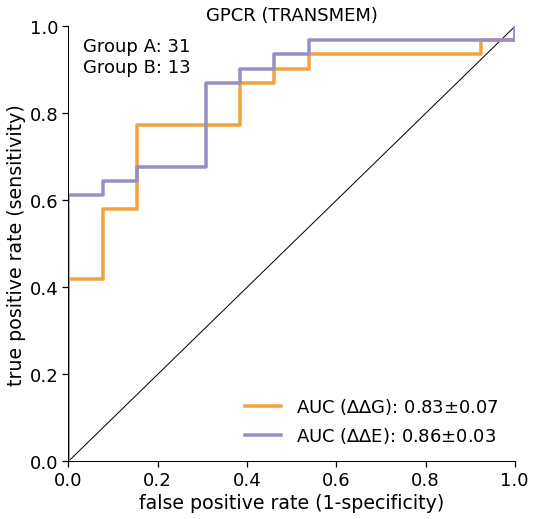

INFO:Ion channel
INFO:all
INFO:7.097735196763732e-05
INFO:8
INFO:groupA: 11
groupB: 15


7.097735196763732e-05
Ensemble test roc-auc:0.6484848484848484
Ensemble test roc-auc:0.8303030303030303


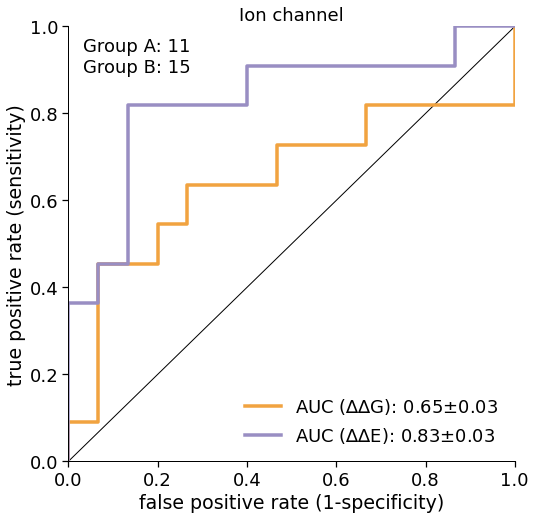

INFO:TRANSMEM
INFO:7.097735196763732e-05
INFO:2
INFO:groupA: 4
groupB: 5


7.097735196763732e-05
Ensemble test roc-auc:0.35
Ensemble test roc-auc:0.8500000000000001


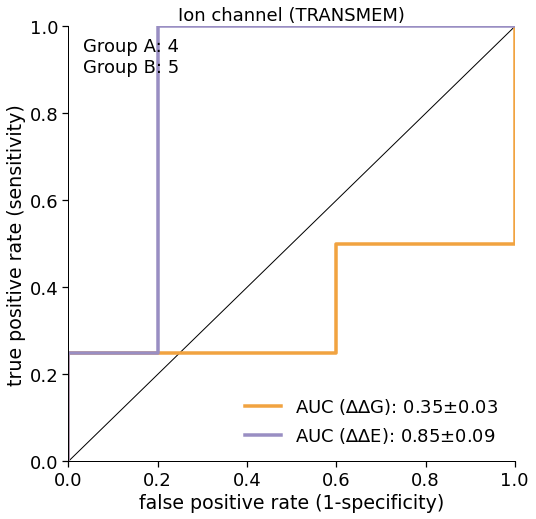

INFO:Transporter
INFO:all
INFO:7.097735196763732e-05
INFO:17
INFO:groupA: 98
groupB: 62


7.097735196763732e-05
Ensemble test roc-auc:0.6394009216589861
Ensemble test roc-auc:0.8220868992758394


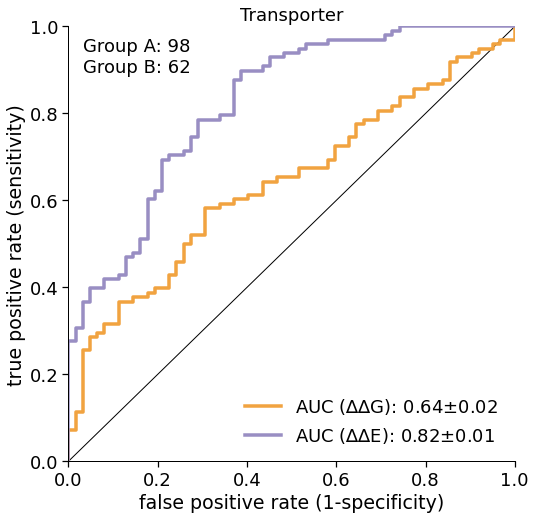

INFO:TRANSMEM
INFO:7.097735196763732e-05
INFO:5
INFO:groupA: 44
groupB: 17


7.097735196763732e-05
Ensemble test roc-auc:0.6550802139037433
Ensemble test roc-auc:0.9077540106951871


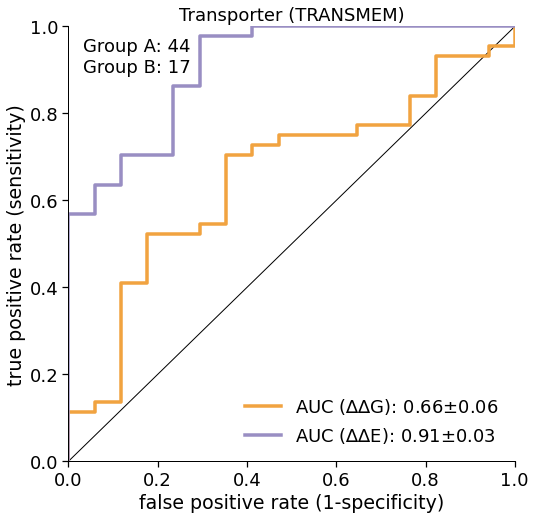

In [57]:
gemme_name = 'gemme;score'

target_dic_here = subfiltered_df_dicts
for category in sorted(protein_categories.keys()):
    logger.info(category)
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp = all_tmp.copy()
        title = f"{category}"
        if region != 'all':
            title = title + f' ({region})'
            tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)

        for cutoff_value in [cutoff_value]:
            logger.info(cutoff_value)
            print(cutoff_value)
            control_df = tmp.copy()
            control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)

            logger.info(len(control_df.loc[control_df['clinvar;significance_all']=='benign', ['variant']]))
            control_score = np.copy(control_df['score'].values)
            if len(list(set(control_score))) > 1:
                test_score1 = control_df['rosetta;ddG'].values
                test_score2 = control_df[gemme_name].values
                groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
                groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
                logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
                satu = ''

                auc_dici = disease_ROC_adapted(control_df, control_score, test_score1, test_score2, 
                                               'all', f"Fig4-A_{title}", cutoff=cutoff_value, satu=satu, 
                                               groupA=groupA, groupB=groupB, nameB=gemme_name, title=title, runs=10)


### ddG-ddE distribution

INFO:Cell Junction
INFO:all
INFO:['group B' 'other' 'group A']


<Figure size 576x576 with 0 Axes>

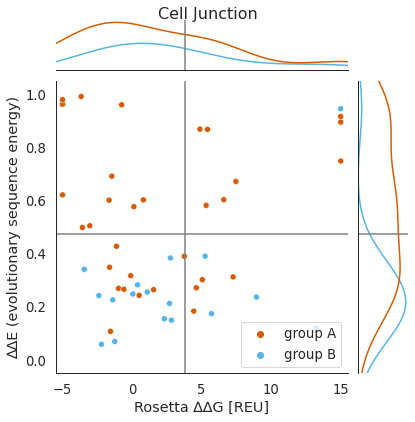

INFO:TRANSMEM
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

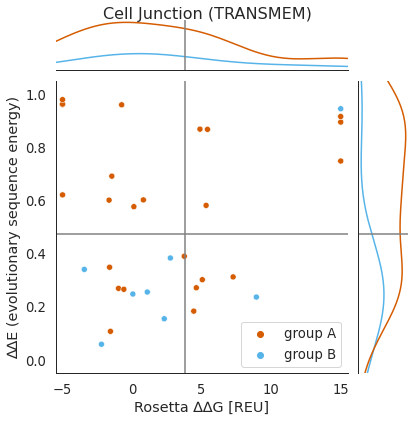

INFO:Enzyme
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

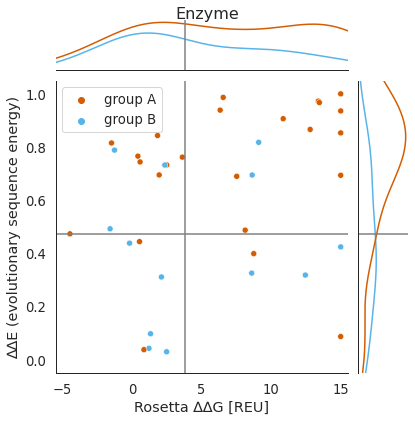

INFO:TRANSMEM
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

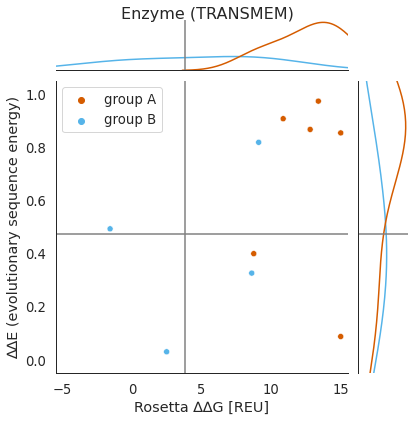

INFO:GPCR
INFO:all
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

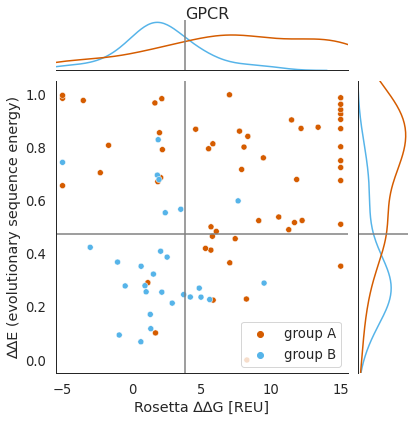

INFO:TRANSMEM
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

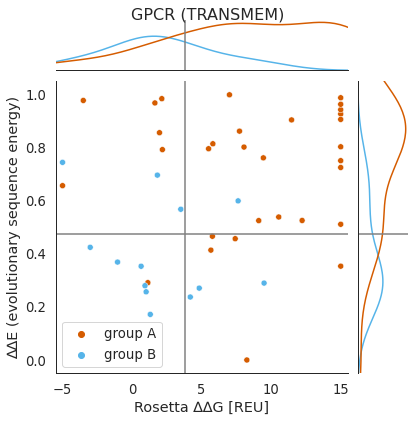

INFO:Ion channel
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

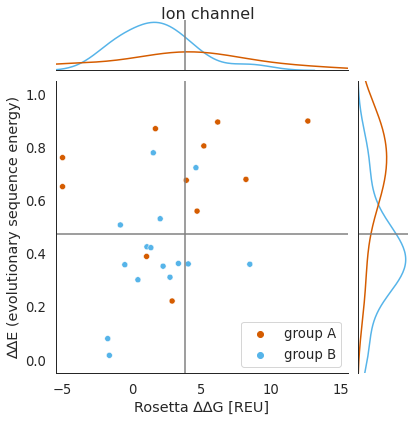

INFO:TRANSMEM
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

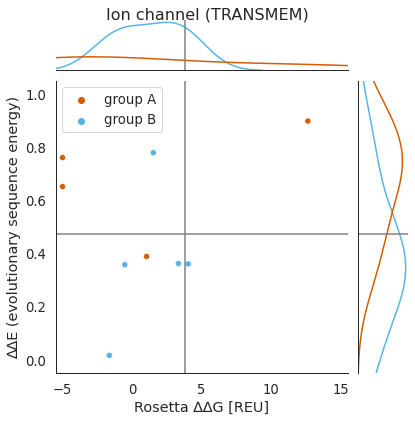

INFO:Transporter
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

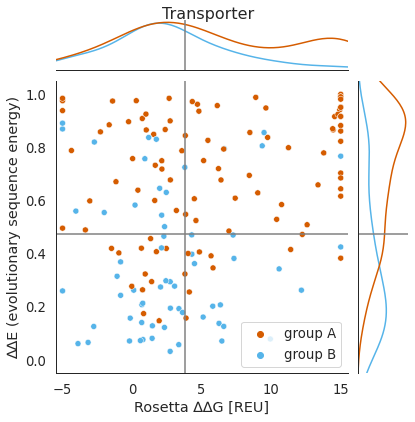

INFO:TRANSMEM
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

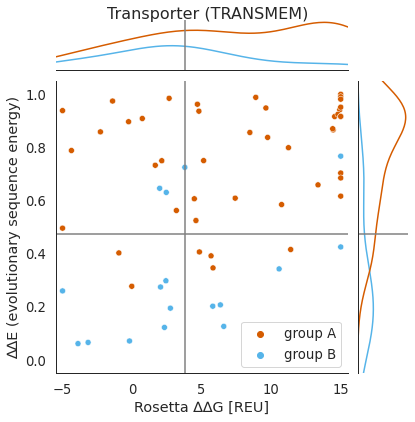

In [58]:
x_range = 1
y_range = 0.1

target_dic_here = subfiltered_df_dicts
for category in sorted(protein_categories.keys()):
    logger.info(category)
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        title = category
        if region != 'all':
            title = title + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        with sns.axes_style("white"):
            f = plt.figure(figsize=(8,8))
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
            g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                              hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])
            g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
            g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
            g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
            g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
            g.ax_joint.set_xlim(-5.5,15.5)
            g.ax_joint.set_ylim(-0.05,1.05)

            g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
            g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
            g.ax_joint.legend().set_title('')
            g.fig.suptitle(title)
            g.fig.subplots_adjust(top=0.95)

            filename = os.path.join(plots_dir, f'Fig4-B_{title}.svg')
            plt.savefig(filename, )
            plt.show()


### SASA & AA property count for quadrant and groups A & B

In [ ]:
target_dic_here = subfiltered_df_dicts
all_all_tmp = []
for category in sorted(protein_categories.keys()):
    logger.info(category)
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy['res'] = tmp_energy['resi'].apply(lambda x: x[0])
        tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
        tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

        tmp_energy['property_wt'] = tmp_energy['wt'].apply(lambda x: make_property(x))
        tmp_energy['property_var'] = tmp_energy['var'].apply(lambda x: make_property(x))

        def remove_dup(x):
            if type(x)==str:
                x = x.split('|')
                x= list(set(x))
                for elem in x:
                    if elem!='':
                        return elem
            else:
                return None
        tmp_energy['SAR'] = ''
        for pdbASA in [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')]:
            tmp_energy['SAR_tmp'] = tmp_energy[pdbASA].apply(lambda x: sasa(x))
            tmp_energy['SAR_tmp'] = tmp_energy['SAR_tmp'].fillna('')
            tmp_energy['SAR'] = tmp_energy['SAR'] +'|'+ tmp_energy['SAR_tmp']
        tmp_energy['SAR'] = tmp_energy['SAR'].apply(lambda x: remove_dup(x) )

        tmp_energy['TMspan'] = ''
        for tmspan_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')]:
            tmp_energy['TMspan_tmp'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
            tmp_energy['TMspan'] = tmp_energy['TMspan'] +'|'+ tmp_energy['TMspan_tmp']
        tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: remove_dup(x) )
        tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: 'TM-region' if x else '')
        tmp_energy['LAR'] = ''
        for lar_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')]:
            tmp_energy['LAR_tmp'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
            tmp_energy['LAR'] = tmp_energy['LAR'] +'|'+ tmp_energy['LAR_tmp']
        tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: remove_dup(x) )
        tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

        def tmpiii_ds(x):
            if type(x)!=float:
                return '|'.join(list(filter(None, x.split('|')))) 
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

        tmp_energy['position_backup'] = tmp_energy['position']
        pos_list = ['solvent-accessible', 
                    'buried', 
                    'TM-region|lipid-facing|buried', 
                    'TM-region|buried', 
                    'TM-region|lipid-facing|solvent-accessible', 
                    'lipid-facing|buried', 
                   ]
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: x if x in pos_list else 'others')

        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    all_all_tmp.append(all_tmp)
    for region in ['all']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        title = category
        if region != 'all':
            title = title + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        x_range = 1
        y_range = 0.1
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        def make_groups(x):
            if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
                return 'Q1'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
                return 'Q2'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
                return 'Q3'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
                return 'Q4'
        tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))
        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        all_all_tmp.append(tmp_energy)
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                        fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi2 = tmpi.copy()
        tmpi2['c'] = 1
        df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
        df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, 
                        annot=True, fmt=".0%", )
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()
all_all_tmp = pd.concat(all_all_tmp)
            

In [60]:
tmpi = all_all_tmp.copy()

tmpi = tmpi.loc[tmpi['accession'].isin(protein_categories['GPCR'])]
tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
logger.info(tmpi['position_backup'].unique())
tmpi['c'] = 1
df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)
df2 = df2.fillna(0)
df2.columns
df2['All']#['All']
tmpi[['variant', 'label', 'position']]
logger.info(tmpi['position'].unique())
tmpi.loc[~tmpi['position'].isin(['solvent-accessible', 'buried', 'others', 'TM-region|lipid-facing|buried',
 'TM-region|buried'])][['variant', 'label', 'position', 'quadrant']]#['variant'].tolist()
for elem in ['solvent-accessible', 
                    'buried', 
                    'TM-region|lipid-facing|buried', 
                    'TM-region|buried', 
                    'TM-region|lipid-facing|solvent-accessible', 
                    'lipid-facing|buried', 
            ]:
    print(elem)
    print(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist())


INFO:['solvent-accessible' 'buried' 'TM-region|lipid-facing|solvent-accessible'
 'TM-region|lipid-facing|buried' 'TM-region|buried'
 'lipid-facing|solvent-accessible']
INFO:['solvent-accessible' 'buried' 'TM-region|lipid-facing|solvent-accessible'
 'TM-region|lipid-facing|buried' 'TM-region|buried' 'others']


solvent-accessible
['T17K', 'T17M', 'R147C', 'E150K', 'R165Q', 'I269N', 'R305W', 'R113Q', 'R144H', 'R168H', 'R173C', 'R173H', 'E224D', 'N461S', 'K506R', 'T17K', 'T17M', 'R147C', 'E150K', 'R165Q', 'I269N', 'R305W', 'R113Q', 'R144H', 'R168H', 'R173C', 'R173H', 'E224D', 'N461S', 'K506R']
buried
['P23S', 'T70M', 'N73S', 'G106R', 'G106V', 'G106W', 'G109R', 'R135L', 'R135W', 'P180A', 'P180L', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'G188E', 'D190N', 'T320N', 'N240S', 'I316S', 'R66Q', 'R296C', 'P23S', 'T70M', 'N73S', 'G106R', 'G106V', 'G106W', 'G109R', 'R135L', 'R135W', 'P180A', 'P180L', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'G188E', 'D190N', 'T320N', 'N240S', 'I316S', 'R66Q', 'R296C']
TM-region|lipid-facing|buried
['G51A', 'G51R', 'G51V', 'N55K', 'G90D', 'L95P', 'G114D', 'G114V', 'G121V', 'A164V', 'C167W', 'H211P', 'H211R', 'M216R', 'S297R', 'A299S', 'I307F', 'S94N', 'N123S', 'S127L', 'I170V', 'G181D', 'I251L', 'V253I', 'P260Q', 'P299H', 'A235V', 'L412F', 'W226R', 'I256V', 'G51A'

[32.0, 18.0, 18.0, 14.0]


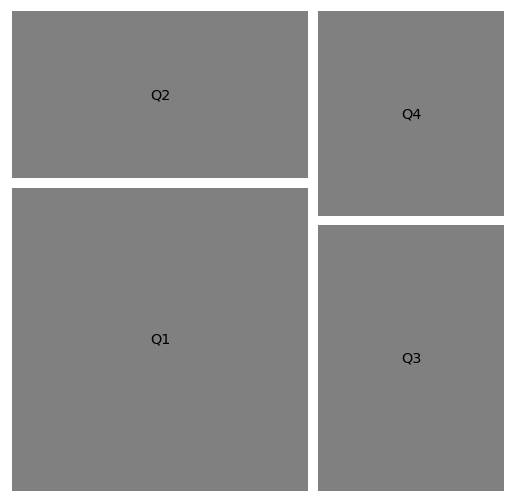

([32.0, 18.0, 18.0, 14.0], ['Q1', 'Q2', 'Q3', 'Q4'])

In [61]:
quadrant = 'Q4'
#['#D55C00', '#56B4E9', ]

label = ['Q1', 'Q2', 'Q3', 'Q4']
labels = []
sizes = []
for lab in label:
    if df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'] > 0:
        sizes.append(df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS11-base_all.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

[1.0, 6.0, 1.0, 6.0]


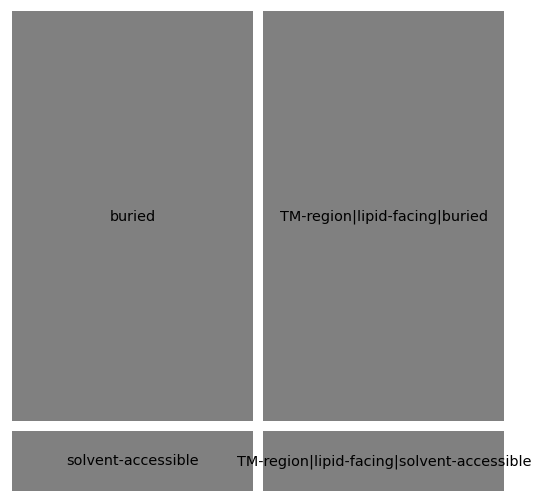

([1.0, 6.0, 1.0, 6.0],
 ['solvent-accessible',
  'buried',
  'TM-region|lipid-facing|solvent-accessible',
  'TM-region|lipid-facing|buried'])

In [62]:
quadrant = 'Q4'
#['#D55C00', '#56B4E9', ]

label = ['solvent-accessible', 'buried', 'TM-region|lipid-facing|solvent-accessible',
 'TM-region|lipid-facing|buried', 'TM-region|buried', ]#'others']
labels = []
sizes = []
for lab in label:
    if df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab] > 0:
        sizes.append(df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS11-base_{quadrant}.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

Q4 TM-region|lipid-facing|buried
[4.0, 2.0]


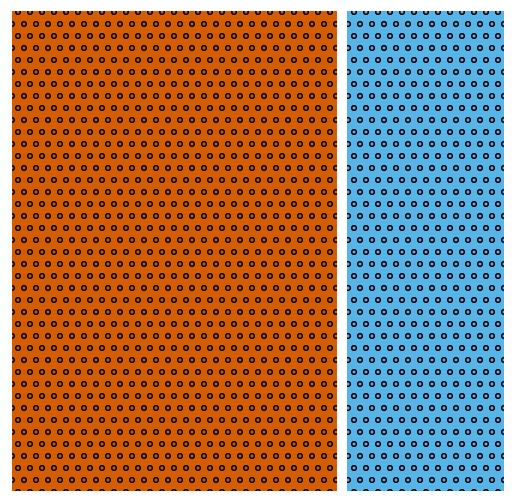

([4.0, 2.0], ['group A', 'group B'])

In [63]:
quadrant = 'Q4'
#[, , ]

label = ['TM-region|buried','TM-region|lipid-facing|buried','buried','others', 'solvent-accessible']
label1 = label[1]
labels = []
sizes = []
colors = []
for lab in ['group A', 'group B']:
    if df2[(quadrant, lab)][label1] > 0:
        sizes.append(df2[(quadrant, lab)][label1])
        labels.append(lab)
        if lab == 'group A':
            colors.append('#D55C00')
        else:
            colors.append('#56B4E9')
print(quadrant, label1)
print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, pad=True, color=colors, hatch='o')#hatch="//")
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS11-other-test.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

In [ ]:
target_dic_here = subfiltered_df_dicts
for category in ['GPCR', 'Transporter']:
    logger.info(category)
    title_raw = category
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    
        pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
        tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
        tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
        tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
        lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
        tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['LAR'].unique()
        tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

        def tmpiii_ds(x):
            if type(x)!=float:
                return '|'.join(list(filter(None, x.split('|')))) 
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )
        tmp_energy['position_backup'] = tmp_energy['position']
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)

        tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

        tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
        tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        
        if region != 'all':
            title_raw = title_raw + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        groupA = len(tmp_energy[tmp_energy['score']==1].reset_index(drop=True)['score'])
        groupB = len(tmp_energy[tmp_energy['score']==0].reset_index(drop=True)['score'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

        def label_gorup_class(x):
            if x==1:
                return 'groupA' 
            else:
                return 'groupB'
        logger.info(tmp_energy['score'].unique())
        tmp_energy['label'] = tmp_energy['score'].apply(lambda x: label_gorup_class(x))
        tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
        tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])
        tmp_energy['wt AA property'] = tmp_energy['wt'].apply(lambda x: make_property(x))
        tmp_energy['var AA property'] = tmp_energy['var'].apply(lambda x: make_property(x))

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        x_range = 1
        y_range = 0.1
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        def make_groups(x):
            if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
                return 'Q1'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
                return 'Q2'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
                return 'Q3'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
                return 'Q4'
        tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        for hue in ['wt AA property', 'var AA property']:
            title = f'{title_raw} - {hue}'
            tmpi = tmp_energy.copy()
            sorter = ['positive', 'negative', 'special', 'polar', 'hydrophobic']
            tmpi[hue] = tmpi[hue].astype("category")
            tmpi[hue].cat.set_categories(sorter, inplace=True)
            tmpi.sort_values([hue])
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
            tmpi['c'] = 1
            df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True)

            with sns.axes_style("darkgrid"):
                f = plt.figure(figsize=(8,3))
                sns.set(font_scale = 1.2)
                sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                            fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
                plt.xlabel('')
                plt.ylabel("", size=15)
                plt.title(title)
                plt.show()

            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

            tmpi2 = tmpi.copy()
            tmpi2['c'] = 1
            df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
            df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
            df2.drop(columns=['All'], inplace=True)

            with sns.axes_style("darkgrid"):
                f = plt.figure(figsize=(8,3))
                sns.set(font_scale = 1.2)
                sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, 
                            annot=True, fmt=".0%", )
                plt.xlabel('')
                plt.ylabel("", size=15)
                plt.title(title)
                plt.show()


### ddG - ddE for buried, positive, ...

INFO:GPCR
INFO:all
INFO:groupA: 39
groupB: 28
INFO:[1. 0.]
INFO:['groupA' 'groupB']


<Figure size 576x576 with 0 Axes>

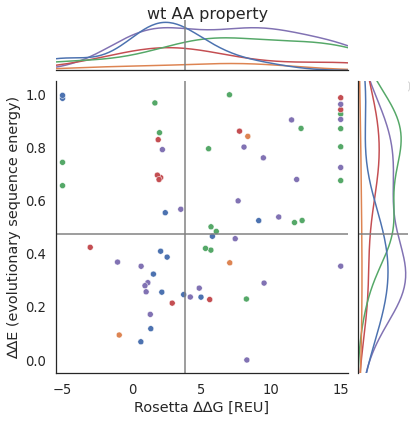

<Figure size 576x576 with 0 Axes>

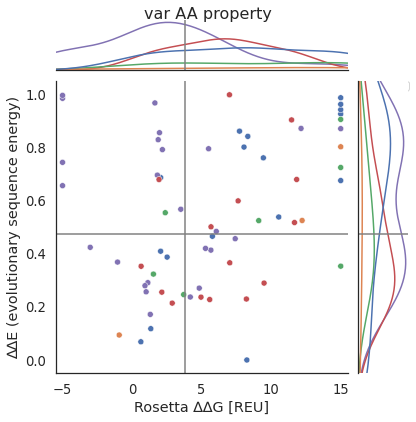

<Figure size 576x576 with 0 Axes>

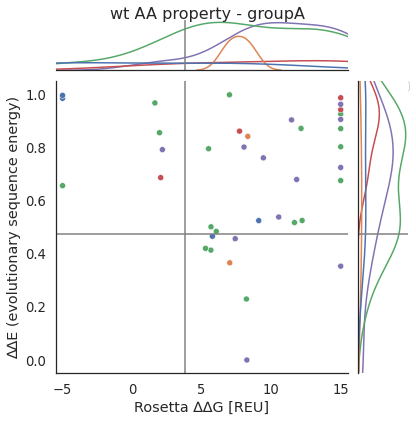

<Figure size 576x576 with 0 Axes>

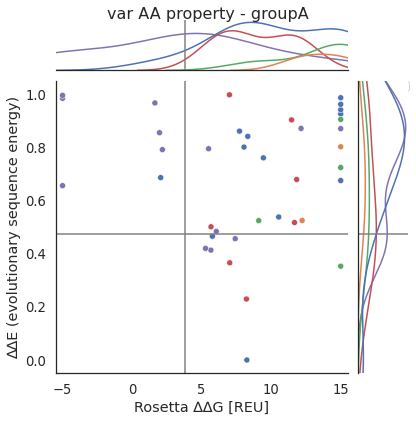

<Figure size 576x576 with 0 Axes>

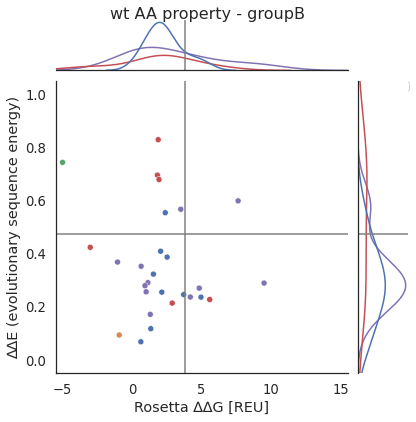

<Figure size 576x576 with 0 Axes>

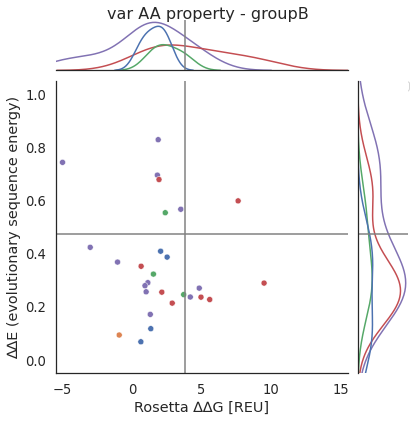

INFO:TRANSMEM
INFO:groupA: 25
groupB: 14
INFO:[1. 0.]
INFO:['groupA' 'groupB']


<Figure size 576x576 with 0 Axes>

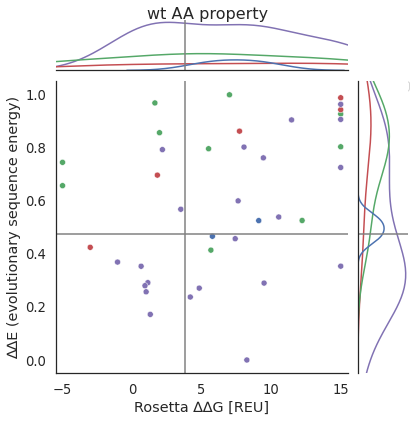

<Figure size 576x576 with 0 Axes>

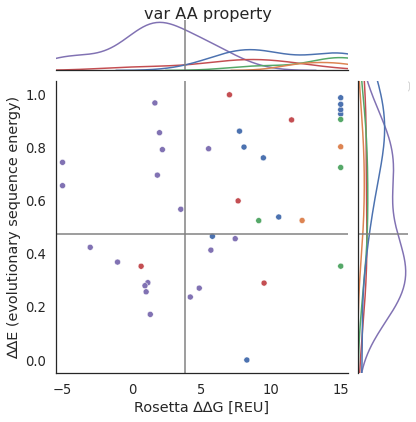

<Figure size 576x576 with 0 Axes>

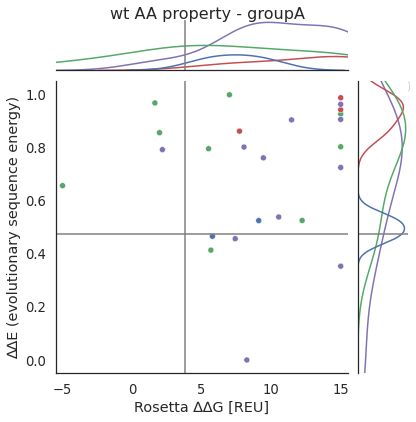

<Figure size 576x576 with 0 Axes>

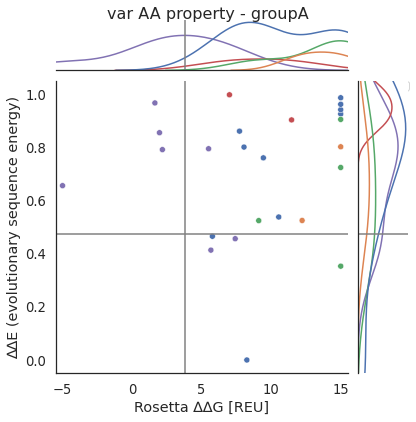

<Figure size 576x576 with 0 Axes>

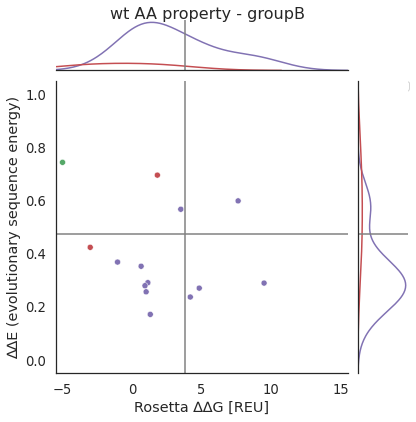

<Figure size 576x576 with 0 Axes>

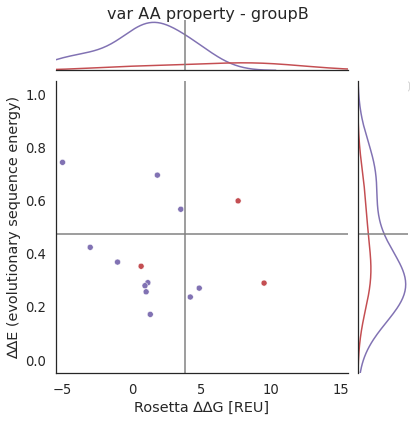

INFO:Transporter
INFO:all
INFO:groupA: 70
groupB: 62
INFO:[0. 1.]
INFO:['groupB' 'groupA']


<Figure size 576x576 with 0 Axes>

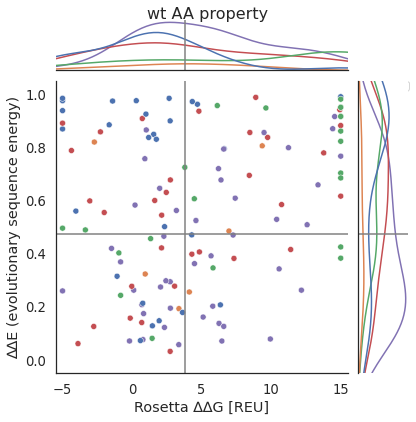

<Figure size 576x576 with 0 Axes>

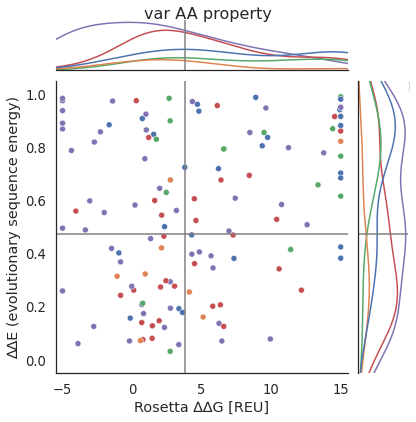

<Figure size 576x576 with 0 Axes>

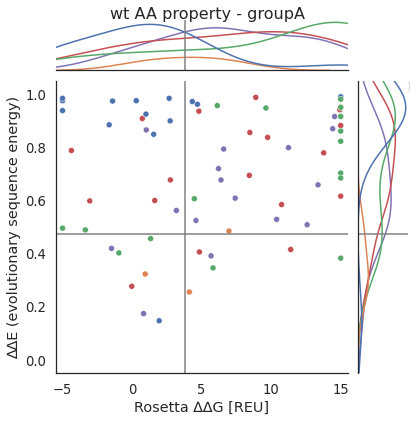

<Figure size 576x576 with 0 Axes>

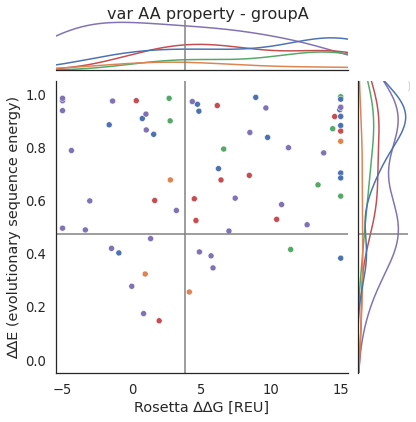

<Figure size 576x576 with 0 Axes>

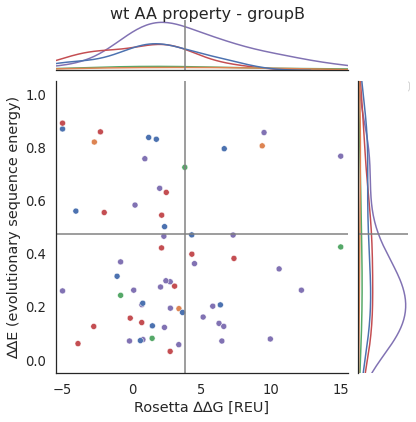

<Figure size 576x576 with 0 Axes>

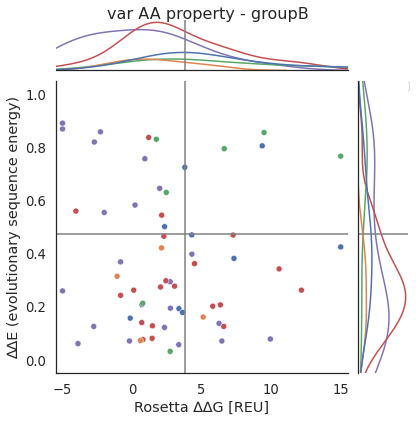

INFO:TRANSMEM
INFO:groupA: 36
groupB: 17
INFO:[0. 1.]
INFO:['groupB' 'groupA']


<Figure size 576x576 with 0 Axes>

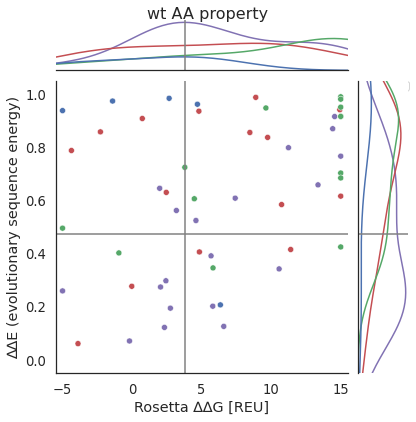

<Figure size 576x576 with 0 Axes>

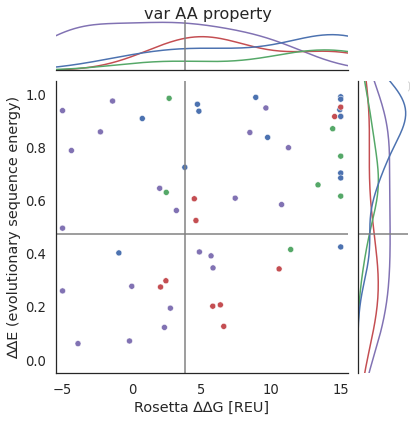

<Figure size 576x576 with 0 Axes>

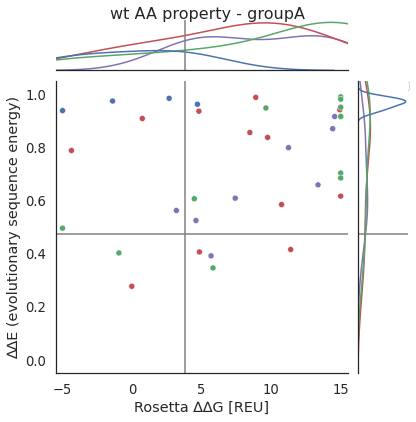

<Figure size 576x576 with 0 Axes>

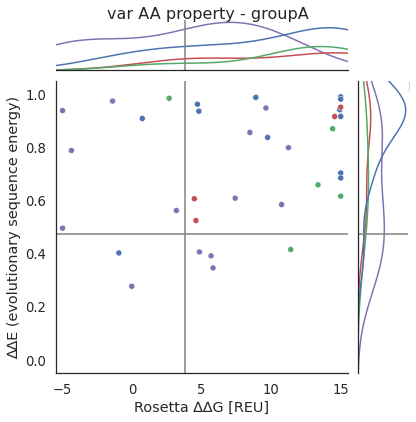

<Figure size 576x576 with 0 Axes>

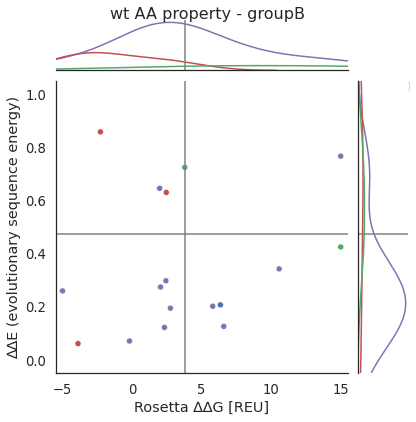

<Figure size 576x576 with 0 Axes>

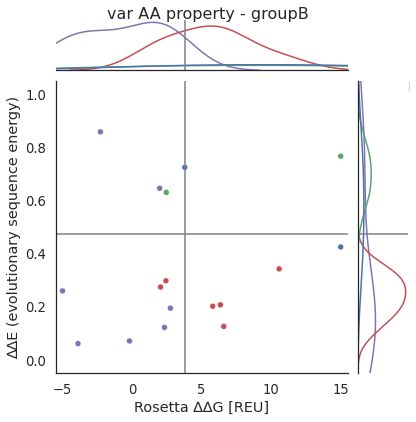

In [65]:
target_dic_here = subfiltered_df_dicts
for category in ['GPCR', 'Transporter']:
    logger.info(category)
    title_raw = category
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    
        pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
        tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
        tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
        tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
        lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
        tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['LAR'].unique()
        tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

        def tmpiii_ds(x):
            if type(x)!=float:
                return '|'.join(list(filter(None, x.split('|')))) 
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )
        tmp_energy['position_backup'] = tmp_energy['position']
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)
        tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

        tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
        tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        
        if region != 'all':
            title_raw = title_raw + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        df2 = tmp_energy.copy()
        groupA = len(df2[df2['score']==1].reset_index(drop=True)['score'])
        groupB = len(df2[df2['score']==0].reset_index(drop=True)['score'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

        def label_gorup_class(x):
            if x==1:
                return 'groupA' 
            else:
                return 'groupB'
        logger.info(df2['score'].unique())
        df2['label'] = df2['score'].apply(lambda x: label_gorup_class(x))
        df2['var'] = df2['variant'].apply(lambda x: x[-1])
        df2['wt'] = df2['variant'].apply(lambda x: x[0])
        df2['wt AA property'] = df2['wt'].apply(lambda x: make_property(x))
        df2['var AA property'] = df2['var'].apply(lambda x: make_property(x))

        df2.loc[df2['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        df2.loc[df2['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(df2['label'].unique())

        df2['gnomad;AF_tot_first'] = df2["gnomad;AF_tot_all"].apply(lambda x: float(x))
        for group in ['all', 'groupA', 'groupB']:
            for hue in ['wt AA property', 'var AA property']:
                title = hue#title_raw
                with sns.axes_style("white"):
                    f = plt.figure(figsize=(8,8))
                    tmpi = df2.copy()
                    if group == 'all':
                        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
                    else:
                        title = f'{title} - {group}'
                        tmpi = tmpi.loc[(tmpi['label']==group)].reset_index(drop=True)
                    g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue=hue, marginal_kws=dict(fill=False), 
                                      hue_order = ['positive', 'negative', 'special', 'polar', 'hydrophobic']
                                     )
                    g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
                    g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
                    g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
                    g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
                    g.ax_joint.set_xlim(-5.5,15.5)
                    g.ax_joint.set_ylim(-0.05,1.05)

                    g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )#fontweight='bold')
                    g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
                    g.fig.suptitle(f'{title}')
                    g.fig.subplots_adjust(top=0.95)
                    g.ax_joint.legend([], bbox_to_anchor=(1.21, 1),borderaxespad=0)#.set_title(hue)
                    plt.show()


## investigate a single protein a bit more

### general - can be run for all proteins

In [66]:
protein_of_interest = 'P11166' #P11166 P08100
for target in target_list:
    if target[0] == protein_of_interest:
        break

#### plot median ddG for AA type

INFO:492
INFO:all


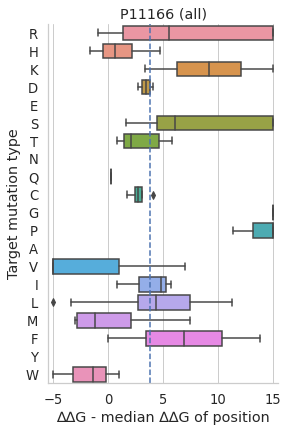

INFO:492
INFO:all


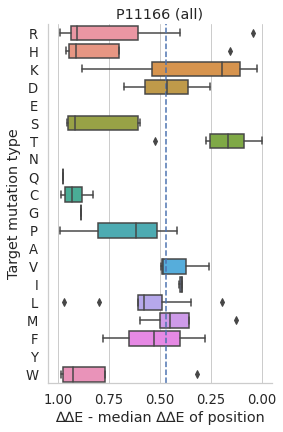

INFO:492
INFO:groupA


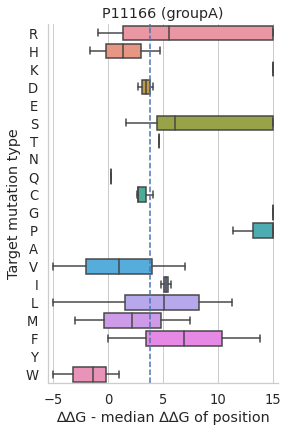

INFO:492
INFO:groupA


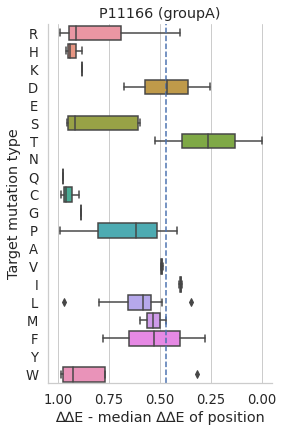

INFO:492
INFO:groupB


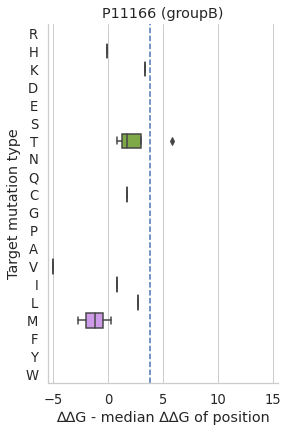

INFO:492
INFO:groupB


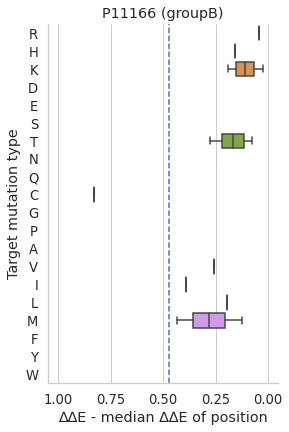

In [67]:
target_dic_here = renamed_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot != protein_of_interest:
        continue
    tmp_energy = target_dic_here[target_uniprot].copy()
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    
    for region in ['all'] :
        for group in [ 'all', 'groupA', 'groupB']:
            for x_lab in ["rosetta;ddG", "gemme;score"]:
                tmpiiii2 = tmp_energy.copy()
                if region !='all':
                    tmpiiii2 = tmpiiii2[tmpiiii2['uniprot;regions_all']==region].reset_index(drop=True)
                tmpiiii2['resi'] = tmpiiii2['res']
                all_resis = tmpiiii2['resi'].unique()

                logger.info(len(tmpiiii2['resi'].unique()))
                all_length = len(tmpiiii2['resi'].unique())

                tmpiiii2.loc[(tmpiiii2[x_lab]>15), x_lab] = 15
                tmpiiii2.loc[(tmpiiii2[x_lab]<-5), x_lab] = -5

                tmpiiii2['label_class'] = tmpiiii2[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
                tmpiiii2['label_class'] = tmpiiii2['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

                tmpiiii2['score'] = tmpiiii2['label_class'].apply(lambda x: classify_control(x))
                tmpiiii2 = tmpiiii2.dropna(subset=['score']).reset_index(drop=True)

                if group=='groupA':
                    tmpiiii2 = tmpiiii2.loc[tmpiiii2['score']==1].reset_index(drop=True)
                elif group=='groupB':
                    tmpiiii2 = tmpiiii2.loc[tmpiiii2['score']==0].reset_index(drop=True)

                if x_lab == 'rosetta;ddG':
                    x_label = '∆∆G'
                else:
                    x_label = '∆∆E'
                if x_lab == 'rosetta;ddG':
                    x_label = '∆∆G'
                    cutoff=all_vals_cat[key][8]
                elif x_lab == 'gemme;score':
                    x_label = '∆∆E'
                    cutoff=all_vals_cat[key][9]
                else:
                    x_label = 'REU'
                logger.info(group)
                median_position_plot(tmpiiii2, x_lab, x_label, target_uniprot, group, target_plot_dir, satu='', fig_name='', cutoff = cutoff)

    
    

#### ddG - ddE for buried, positive, ...

INFO:[nan 'TM-region|lipid-facing|solvent-accessible' '||solvent-accessible'
 'TM-region|lipid-facing|buried' '||buried' 'TM-region||buried'
 '|lipid-facing|buried' '|lipid-facing|solvent-accessible']
INFO:groupA: 50
groupB: 14
INFO:[1. 0.]
INFO:['hydrophobic' 'special' 'polar' 'positive' 'negative'] & ['polar' 'positive' 'negative' 'hydrophobic' 'special']
INFO:['groupA' 'groupB']


<Figure size 576x576 with 0 Axes>

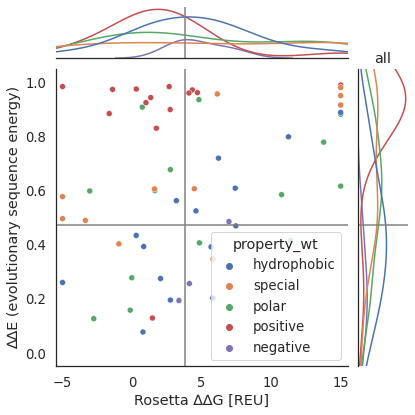

<Figure size 576x576 with 0 Axes>

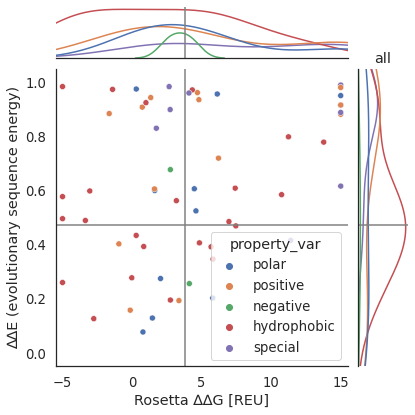

<Figure size 576x576 with 0 Axes>

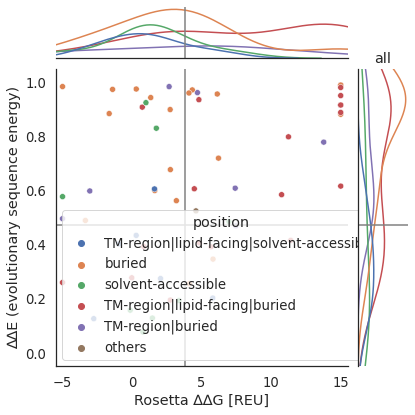

<Figure size 576x576 with 0 Axes>

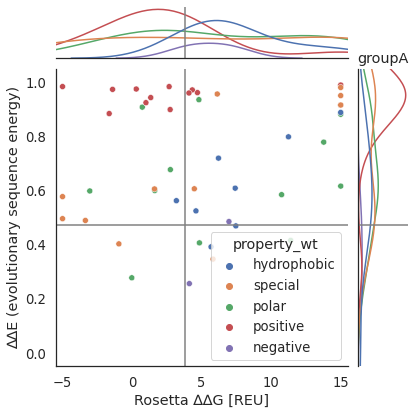

<Figure size 576x576 with 0 Axes>

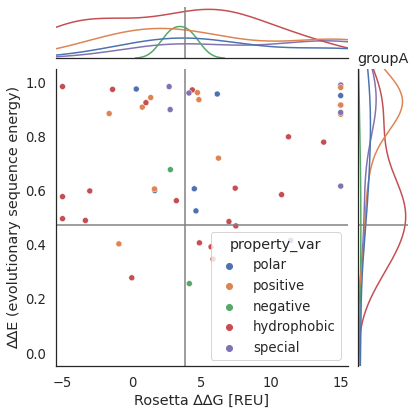

<Figure size 576x576 with 0 Axes>

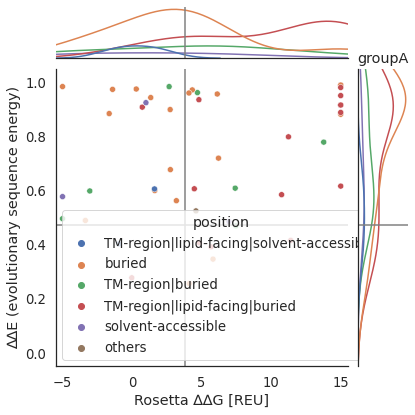

<Figure size 576x576 with 0 Axes>

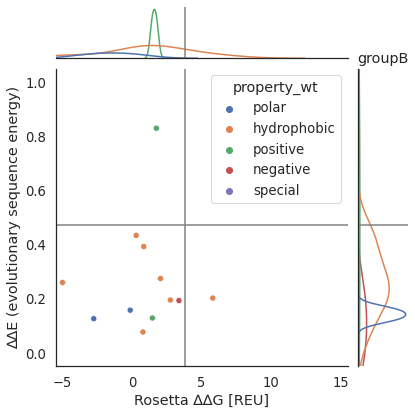

<Figure size 576x576 with 0 Axes>

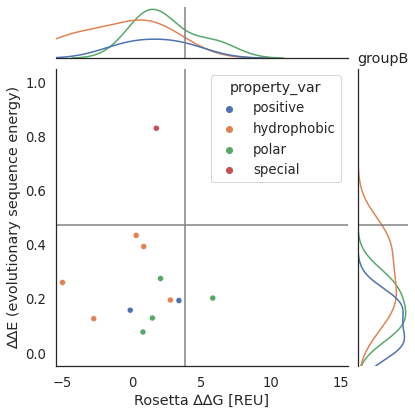

<Figure size 576x576 with 0 Axes>

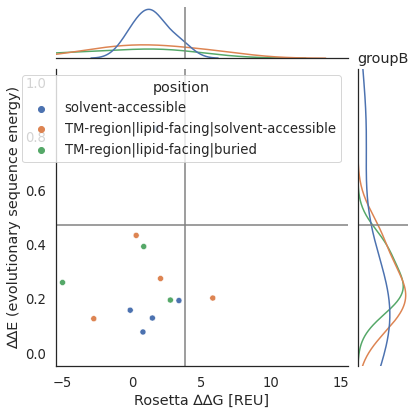

In [68]:
target_dic_here = renamed_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot != protein_of_interest:
        continue
    tmp_energy = target_dic_here[target_uniprot].copy()
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    
    pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
    tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
    tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
    tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
    lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
    tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
    tmp_energy['LAR'].unique()
    tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

    logger.info(tmp_energy['position'].unique())
    def tmpiii_ds(x):
        if type(x)!=float:
            return '|'.join(list(filter(None, x.split('|')))) 
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

    tmp_energy['position_backup'] = tmp_energy['position']
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)
    
    tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

    tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
    tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
    
    df2 = tmp_energy.copy()

    groupA = len(df2[df2['score']==1].reset_index(drop=True)['score'])
    groupB = len(df2[df2['score']==0].reset_index(drop=True)['score'])
    logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

    def label_gorup_class(x):
        if x==1:
            return 'groupA' 
        else:
            return 'groupB'
    logger.info(df2['score'].unique())
    df2['label'] = df2['score'].apply(lambda x: label_gorup_class(x))
    
    
    df2['var'] = df2['variant'].apply(lambda x: x[-1])
    df2['wt'] = df2['variant'].apply(lambda x: x[0])

    df2['property_wt'] = df2['wt'].apply(lambda x: make_property(x))
    df2['property_var'] = df2['var'].apply(lambda x: make_property(x))
    logger.info(f"{df2['property_wt'].unique()} & {df2['property_var'].unique()}")
    
    df2.loc[df2['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    df2.loc[df2['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(df2['label'].unique())

    df2['gnomad;AF_tot_first'] = df2["gnomad;AF_tot_all"].apply(lambda x: float(x))
    for group in ['all', 'groupA', 'groupB']:
        for hue in ['property_wt', 'property_var']:
            with sns.axes_style("white"):
                f = plt.figure(figsize=(8,8))
                tmpi = df2.copy()
                if group == 'all':
                    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
                else:
                    tmpi = tmpi.loc[(tmpi['label']==group)].reset_index(drop=True)
                g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue=hue, marginal_kws=dict(fill=False), 
                                 )
                g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
                g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
                g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
                g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
                g.ax_joint.set_xlim(-5.5,15.5)
                g.ax_joint.set_ylim(-0.05,1.05)

                g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
                g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
                plt.title(group)

                plt.show()
        with sns.axes_style("white"):
            f = plt.figure(figsize=(8,8))
            tmpi = df2.copy()
            if group == 'all':
                tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
            else:
                tmpi = tmpi.loc[(tmpi['label']==group)].reset_index(drop=True)
            g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='position', marginal_kws=dict(fill=False), 
                              #hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ]
                             )
            g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
            g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
            g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
            g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
            g.ax_joint.set_xlim(-5.5,15.5)
            g.ax_joint.set_ylim(-0.05,1.05)

            g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
            g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
            plt.title(group)
            plt.show()
    
    

#### visualize benign/ patho / group B

In [96]:
target_dic_here = renamed_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot == protein_of_interest:
        break
tmp_energy = target_dic_here[target_uniprot].copy()
target_plot_dir = os.path.join(plots_dir, target_uniprot)

tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)

df2 = tmp_energy
groupA = len(df2[df2['score']==1].reset_index(drop=True)['score'])
groupB = len(df2[df2['score']==0].reset_index(drop=True)['score'])
logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

def label_gorup_class(x):
    if x==1:
        return 'groupA' 
    else:
        return 'groupB'
logger.info(df2['score'].unique())
df2['label'] = df2['score'].apply(lambda x: label_gorup_class(x))

df2.loc[df2['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
df2.loc[df2['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
logger.info(df2['label'].unique())
cutoff_value=gnomAD_cutoff_value
ddg_column='rosetta;ddG'

tmp_energy = df2
tmp_energy['res'] = tmp_energy['resi'].apply(lambda x: x[0])
tmp_energy = tmp_energy.dropna(subset=[ddg_column], how='any').reset_index(drop=True)

tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)

groupAraw = tmp_energy.loc[(tmp_energy['score']==1), 'res'].unique()
groupA = " ".join([str(ins1) for ins1 in groupAraw])
groupBraw = tmp_energy.loc[(tmp_energy['score']==0), 'res'].unique()
groupB = " ".join([str(ins1) for ins1 in groupBraw])
benignraw = tmp_energy.loc[(tmp_energy['clinvar;significance_all']=='benign'), 'res'].unique()
benign = " ".join([str(ins1) for ins1 in benignraw])

colors_groups = ['#D55C00', '#56B4E9', 'green']

write_new = True

targe_uniprot = target[0]
logger.info(target[3][0])
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)

view = nv.show_file(pdb_file_name, gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_licorice(selection=f":A and ({groupB})", color=colors_groups[1], radiusScale=2.5)
view.add_licorice(selection=f":A and ({groupA})", color=colors_groups[0], radiusScale=2.5)
view.add_licorice(selection=f":A and ({benign})", color=colors_groups[2], radiusScale=2.5)

view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
view

INFO:groupA: 50
groupB: 14
INFO:[1. 0.]
INFO:['groupA' 'groupB']
INFO:5u74-A
INFO:5u74


NGLWidget()

#### ligand binding pocket

INFO:P11166
INFO:['other' 'group A' 'group B']
INFO:0      0.000010
1      0.000012
2      0.000004
3      0.000007
4           NaN
         ...   
249         NaN
250         NaN
251         NaN
252         NaN
253         NaN
Name: gnomad;AF_tot_first, Length: 254, dtype: float64
INFO:{'Q1': {'group A': ['N34D', 'N34S', 'P36L', 'R92W', 'R93W', 'R126C', 'Q161R', 'R212C', 'R212H', 'R223W', 'T295M', 'V328L', 'R333Q', 'R333W', 'G419V'], 'group B': ['R269C']}, 'Q2': {'group A': ['N34K', 'R126H', 'G130R', 'G130S', 'G134S', 'R153L', 'R153P', 'G167R', 'G175R', 'P211S', 'D236V', 'M244R', 'A275T', 'Q283R', 'I287L', 'S294F', 'G314S', 'S324L', 'S324P', 'F422L'], 'group B': []}, 'Q3': {'group A': ['V165I', 'E247D', 'T310I', 'S313P', 'P383L'], 'group B': ['I339T']}, 'Q4': {'group A': ['G17R', 'S313F'], 'group B': ['Q46H', 'T63M', 'F104L', 'K255T', 'A267T', 'E299K', 'A342T', 'A345V']}}


<Figure size 576x576 with 0 Axes>

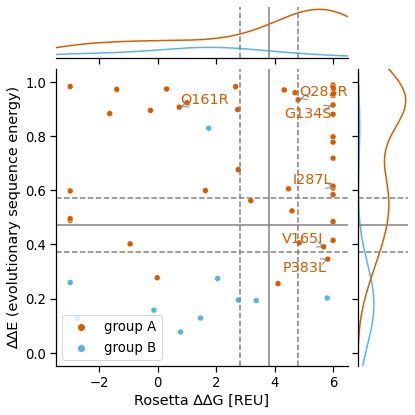

In [70]:
x_range = 1
y_range = 0.1
rosetta_grey = False
gemme_grey = False
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot != protein_of_interest:
        continue
    logger.info(target_uniprot)
    tmp_energy = target_dic_here[target_uniprot].copy()
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    all_tmp.append(tmp_energy)
    
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))
    
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 6, 'rosetta;ddG'] = 6
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -3, 'rosetta;ddG'] = -3
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    logger.info(tmp_energy['gnomad;AF_tot_first'])
    

    f = plt.figure(figsize=(8,8))
    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                      hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])

    key = 'all'#target_uniprot

    g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
    g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
    g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
    g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
    g.ax_joint.axvline(x=all_vals_cat[key][8]+x_range,linestyle='--', color='grey')
    g.ax_joint.axhline(y=all_vals_cat[key][9]+y_range,linestyle='--', color='grey')
    g.ax_marg_x.axvline(x=all_vals_cat[key][8]+x_range,linestyle='--', color='grey')
    g.ax_marg_y.axhline(y=all_vals_cat[key][9]+y_range,linestyle='--', color='grey')
    g.ax_joint.axvline(x=all_vals_cat[key][8]-x_range,linestyle='--', color='grey')
    g.ax_joint.axhline(y=all_vals_cat[key][9]-y_range,linestyle='--', color='grey')
    g.ax_marg_x.axvline(x=all_vals_cat[key][8]-x_range,linestyle='--', color='grey')
    g.ax_marg_y.axhline(y=all_vals_cat[key][9]-y_range,linestyle='--', color='grey')
    g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
    g.ax_joint.set_ylim(-0.05,1.05)
    g.ax_joint.set_xlim(-3.5,6.5)
    
    g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )#fontweight='bold')
    g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
    g.ax_joint.legend().set_title('')
    
    texts = []

    for line in range(0,tmpi.shape[0]):
        labeler=True
        if rosetta_grey==True and gemme_grey==True:
            if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)) and ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                labeler=True
            else:
                labeler=False
        else:
            if rosetta_grey==True:
                if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)):
                    labeler=True
                else:
                    labeler=False
            if gemme_grey==True:
                if ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                    labeler=True
                else:
                    labeler=False
        if labeler==True:
            #for NPC1: POV
            ligands = [["E113", "G114", "A117", "T118", "G121", "E122", "L125", "E181", "S186", "C187", "G188", "I189", "Y191", "M207", "F208", "H211", "F212", "F261", "W265", "Y268", "A269", "A292", "F293", "A295", "K296"],
                      ['F26', 'T30', 'G76', 'S80', 'V83', 'C133', 'G134', 'T137', 'G138', 'P141', 'M142', 'H160', 'Q161', 'I164', 'V165', 'I168', 'Q279', 'Q282', 'Q283', 'I287', 'N288', 'F291', 'Y292', 'N317', 'T321', 'F379', 'E380', 'P383', 'G384', 'P385', 'P387', 'W388', 'A392', 'I404', 'A405', 'A407', 'G408', 'F409', 'N411', 'W412', 'N415', ],
                       ['L853', 'N854', 'K855', 'V856', 'D857', 'I858', 'I1095', 'T1098', 'I1099', 'L1102', 'G1103', 'L1135', 'V1136', 'F1139', 'L1149']
                      ]
            #for GLUT1: chloride binding side
            #for NPC1: PPI
      #      ligands = [["E113", "G114", "A117", "T118", "G121", "E122", "L125", "E181", "S186", "C187", "G188", "I189", "Y191", "M207", "F208", "H211", "F212", "F261", "W265", "Y268", "A269", "A292", "F293", "A295", "K296"],
      #                ['G91', 'R92', 'R93', 'Y143', 'E209', 'S210', 'F213', ],
      #                 ['G178', 'Y420', 'Q421', 'Y423', 'S425', 'G426', 'D501', 'D502', 'F503', 'F504', 'Y506']
      #                ]
            #for NPC1: cholesterol
      #      ligands = [["E113", "G114", "A117", "T118", "G121", "E122", "L125", "E181", "S186", "C187", "G188", "I189", "Y191", "M207", "F208", "H211", "F212", "F261", "W265", "Y268", "A269", "A292", "F293", "A295", "K296"],
      #                ['G91', 'R92', 'R93', 'Y143', 'E209', 'S210', 'F213', ],
      #                 ['W27', 'N41', 'Q79', 'T82', 'L83', 'N86', 'L87', 'L89', 'P90', 'F108', 'L111', 'T112', 'L176', 'C177', 'W189', 'Y192', 'M193', 'F194', 'N198', 'Q200', 'A201', 'P202', 'F203', 'I205', 'P377', 'V378', 'L380', 'W381', 'I609', 'L613', 'S617', 'D618', 'D620', 'V621', 'V624', 'Y628', 'T683', 'L684', 'I685', 'V686', 'I687', 'E688','V689',  'P691','M754', 'A756', 'V757', 'F760', 'L860', 'Q862', 'S865', 'M866', 'F1087', 'Y1088', 'V1152', 'V1155', 'I1220', 'F1221', 'Y1225',]
      #                ]
            for index in range(3):
                if tmpi['variant'][line][:-1] in ligands[index]:
                    if tmpi['label'][line] == 'group A':
                        texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color='#D55C00'))
                    elif tmpi['label'][line] == 'group B':
                        texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color='#56B4E9'))

    adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)
    quartiles = {'Q1' : {'group A':[], 'group B':[]},
                 'Q2' : {'group A':[], 'group B':[]},
                 'Q3' : {'group A':[], 'group B':[]},
                 'Q4' : {'group A':[], 'group B':[]},
                }
    for line in range(0,tmpi.shape[0]):
        #Q1:
        if (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]) and (tmpi['gemme;score'][line]>=all_vals_cat[key][9]):
            if tmpi['label'][line] == 'group A':
                quartiles['Q1']['group A'] = quartiles['Q1']['group A']+[tmpi['variant'][line]]
            elif tmpi['label'][line] == 'group B':
                quartiles['Q1']['group B'] = quartiles['Q1']['group B']+[tmpi['variant'][line]]
        elif (tmpi['rosetta;ddG'][line]>=all_vals_cat[key][8]) and (tmpi['gemme;score'][line]>=all_vals_cat[key][9]):
            if tmpi['label'][line] == 'group A':
                quartiles['Q2']['group A'] = quartiles['Q2']['group A']+[tmpi['variant'][line]]
            elif tmpi['label'][line] == 'group B':
                quartiles['Q2']['group B'] = quartiles['Q2']['group B']+[tmpi['variant'][line]]
        elif (tmpi['rosetta;ddG'][line]>=all_vals_cat[key][8]) and (tmpi['gemme;score'][line]<all_vals_cat[key][9]):
            if tmpi['label'][line] == 'group A':
                quartiles['Q3']['group A'] = quartiles['Q3']['group A']+[tmpi['variant'][line]]
            elif tmpi['label'][line] == 'group B':
                quartiles['Q3']['group B'] = quartiles['Q3']['group B']+[tmpi['variant'][line]]
        elif (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]) and (tmpi['gemme;score'][line]<all_vals_cat[key][9]):
            if tmpi['label'][line] == 'group A':
                quartiles['Q4']['group A'] = quartiles['Q4']['group A']+[tmpi['variant'][line]]
            elif tmpi['label'][line] == 'group B':
                quartiles['Q4']['group B'] = quartiles['Q4']['group B']+[tmpi['variant'][line]]

    logger.info(quartiles)
    plt.show()
    

INFO:121
INFO:NPC1
INFO:5u74


NGLWidget()

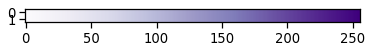

In [71]:
target_protein = 0
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ["E113", "G114", "A117", "T118", "G121", "E122", "L125", "E181", "S186", "C187", "G188", "I189", "Y191", "M207", "F208", "H211", "F212", "F261", "W265", "Y268", "A269", "A292", "F293", "A295", "K296"]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['G121V']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

Q2_ligand_binding_pocket = ['G114D', 'G114V', 'E181K', 'M207R', 'H211R']
Q2_ligand_binding_pocket = [res[1:-1] for res in Q2_ligand_binding_pocket]
Q2_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q2_ligand_binding_pocket))])

Q3_ligand_binding_pocket = ['G188E']
Q3_ligand_binding_pocket = [res[1:-1] for res in Q3_ligand_binding_pocket]
Q3_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q3_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]


groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']


groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]
write_new = False
targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('1U19', gui=True)
view.clear_representations()
#view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and not (1-104 165-179)", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and  (1-105 164-180)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f":A and RET", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and RET", colorValue='#4d004b', opacity=0.25, wireframe=True)

view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
view.add_licorice(selection=f":A and ({Q3_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q3_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:287 283 165 134
INFO:OPSD
INFO:4zwj


NGLWidget()

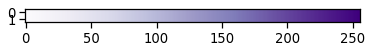

In [72]:
target_protein = 1
quartile = 5
group = 'A'


Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['F26', 'T30', 'G76', 'S80', 'V83', 'C133', 'G134', 'T137', 'G138', 'P141', 'M142', 'H160', 'Q161', 'I164', 'V165', 'I168', 'Q279', 'Q282', 'Q283', 'I287', 'N288', 'F291', 'Y292', 'N317', 'T321', 'F379', 'E380', 'P383', 'G384', 'P385', 'P387', 'W388', 'A392', 'I404', 'A405', 'A407', 'G408', 'F409', 'N411', 'W412', 'N415', ]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['G134S', 'V165I', 'Q283R', 'I287L']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

Q2_ligand_binding_pocket = ['Q161R']
Q2_ligand_binding_pocket = [res[1:-1] for res in Q2_ligand_binding_pocket]
Q2_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q2_ligand_binding_pocket))])

Q4_ligand_binding_pocket = ['P383L']
Q4_ligand_binding_pocket = [res[1:-1] for res in Q4_ligand_binding_pocket]
Q4_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q4_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)
    
#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('6tha', gui=True)
view.clear_representations()
#view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and not (9-104 196-272 309-350 390-455 295-373)", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and  (9-104 196-272 309-350 390-455 295-373)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f":A and P33", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and P33", colorValue='#4d004b', opacity=0.25, wireframe=True)
    
view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')


#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:93 92
INFO:OPSD
INFO:4zwj


NGLWidget()

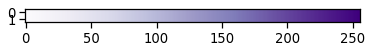

In [73]:
target_protein = 1
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['G91', 'R92', 'R93', 'Y143', 'E209', 'S210', 'F213', ]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['R92W', 'R93W', ]
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])


logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]


groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']


groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)
    
#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('6tha', gui=True)
view.clear_representations()
#view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and  (8-22 85-99 138-148 203-218)", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and not (8-22 85-99 138-148 203-218)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'


view.add_licorice(selection=f":A and CL", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and CL", colorValue='#4d004b', opacity=0.25, wireframe=True)

view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')


#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:858
INFO:GTR1
INFO:6tha


NGLWidget()

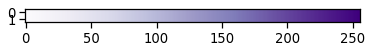

In [74]:
target_protein = 2
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['L853', 'N854', 'K855', 'V856', 'D857', 'I858V', 'I1095', 'T1098', 'I1099', 'L1102', 'G1103', 'L1135', 'V1136', 'F1139', 'L1149' ]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['I858V', ]
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])


logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]


groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']


groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False


targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)
    
#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('6w5s', gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (8-22 85-99 138-148 203-218)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and not (8-22 85-99 138-148 203-218)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'


view.add_licorice(selection=f":A and POV", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and POV", colorValue='#4d004b', opacity=0.25, wireframe=True)

    #fe9929
view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#56B4E9', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:425 502
INFO:GTR1
INFO:6tha


NGLWidget()

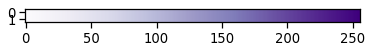

In [75]:
target_protein = 2
quartile = 5
group = 'A'


Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['L853', 'N854', 'K855', 'V856', 'D857', 'I858V', 'I1095', 'T1098', 'I1099', 'L1102', 'G1103', 'L1135', 'V1136', 'F1139', 'L1149' ]
ligand_binding_pocket = ['G178', 'Y420', 'Q421', 'Y423', 'S425', 'G426', 'D501', 'D502', 'F503', 'F504', 'Y506']
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['I858V', ]
Q1_ligand_binding_pocket = ['S425L', 'D502E']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)
    

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('5jnx', gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and not :A", color='lightgrey', opacity=0.8, side='front')

#view.add_cartoon(selection=f"protein and :A and  (8-22 85-99 138-148 203-218)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and not (8-22 85-99 138-148 203-218)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'


#view.add_licorice(selection=f":A and POV", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
#view.add_surface(selection=f":A and POV", colorValue='#4d004b', opacity=0.25, wireframe=True)
#view.add_licorice(selection=f":A and POV", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
#view.add_surface(selection=f":A and POV", colorValue='#4d004b', opacity=0.25, wireframe=True)

    #fe9929
view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#56B4E9', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:628 684 1087
INFO:GTR1
INFO:6tha


NGLWidget()

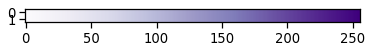

In [76]:
target_protein = 2
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['W27', 'N41', 'Q79', 'T82', 'L83', 'N86', 'L87', 'L89', 'P90', 'F108', 'L111', 'T112', 'L176', 'C177', 'W189', 'Y192', 'M193', 'F194', 'N198', 'Q200', 'A201', 'P202', 'F203', 'I205', 'P377', 'V378', 'L380', 'W381', 'I609', 'L613', 'S617', 'D618', 'D620', 'V621', 'V624', 'Y628', 'T683', 'L684', 'I685', 'V686', 'I687', 'E688', 'V689',  'P691','M754', 'A756', 'V757', 'F760', 'L860', 'Q862', 'S865', 'M866', 'F1087', 'Y1088', 'V1152', 'V1155', 'I1220', 'F1221', 'Y1225',]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['Y628S', 'L684F', 'F1087L']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
#view = nv.show_pdbid('6w5t', gui=True)
view = nv.show_pdbid('6uox', gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (8-22 85-99 138-148 203-218)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and not (8-22 85-99 138-148 203-218)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f"CLR", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f"CLR", colorValue='#4d004b', opacity=0.25, wireframe=True)

view.add_licorice(selection=f"QDG", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f"QDG", colorValue='#4d004b', opacity=0.25, wireframe=True)

    #fe9929
view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


#### important motifs

INFO:['other' 'group A' 'group B']
INFO:0      0.000010
1      0.000012
2      0.000004
3      0.000007
4           NaN
         ...   
249         NaN
250         NaN
251         NaN
252         NaN
253         NaN
Name: gnomad;AF_tot_first, Length: 254, dtype: float64
INFO:{'Q1': {'group A': ['N34D', 'N34S', 'P36L', 'R92W', 'R93W', 'R126C', 'Q161R', 'R212C', 'R212H', 'R223W', 'T295M', 'V328L', 'R333Q', 'R333W', 'G419V'], 'group B': ['R269C']}, 'Q2': {'group A': ['N34K', 'R126H', 'G130R', 'G130S', 'G134S', 'R153L', 'R153P', 'G167R', 'G175R', 'P211S', 'D236V', 'M244R', 'A275T', 'Q283R', 'I287L', 'S294F', 'G314S', 'S324L', 'S324P', 'F422L'], 'group B': []}, 'Q3': {'group A': ['V165I', 'E247D', 'T310I', 'S313P', 'P383L'], 'group B': ['I339T']}, 'Q4': {'group A': ['G17R', 'S313F'], 'group B': ['Q46H', 'T63M', 'F104L', 'K255T', 'A267T', 'E299K', 'A342T', 'A345V']}}


<Figure size 576x576 with 0 Axes>

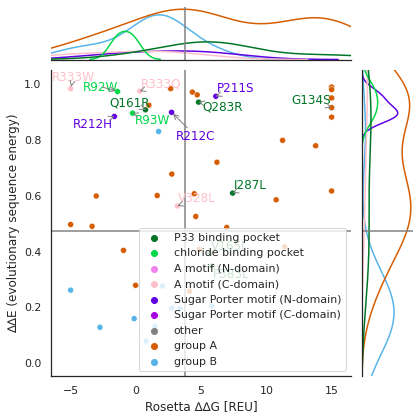

In [77]:
cutoff_value = gnomAD_cutoff_value
x_range = 1#0.5
y_range = 0.1#0.05
rosetta_grey = False
gemme_grey = False
all_tmp = []
target_dic_here = subfiltered_df_dicts#filtered_df_dicts #subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot != protein_of_interest:
        continue
    tmp_energy = target_dic_here[target_uniprot].copy()
    all_tmp.append(tmp_energy)
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    logger.info(tmp_energy['gnomad;AF_tot_first'])
    
    with sns.axes_style("whitegrid"):#white, dark, whitegrid, darkgrid, ticks
        sns.set(font_scale = 1.0)
        sns.set(style = 'white')
        f = plt.figure(figsize=(8,8))
        tmpi = tmp_energy.copy()
        
        def put_to_label(x, target_uniprot):
            x = x[:-1]
            if target_uniprot=='P08100':
                if x in ['E113', 'G114', 'A117', 'T118', 'G121', 'E122', 'L125', 'E181', 'S186', 
                         'C187', 'G188', 'I189', 'Y191', 'M207', 'F208', 'H211', 'F212', 'F261', 
                         'W265', 'Y268', 'A269', 'A292', 'F293', 'A295', 'K296']:
                    return 'retinal binding pocket'
                elif x in ['T17']:
                    return 'Gt activation'
                elif x in ['R135']:
                    return 'DRY motif & ionic lock'
                elif x in ['P215', 'M216']:
                    return 'PIF motif'
                else:
                    return 'other'
            if target_uniprot=='P11166':
                if x in ['F26', 'T30', 'G76', 'S80', 'V83', 'C133', 'G134', 'T137', 'G138', 'P141', 
                         'M142', 'H160', 'Q161', 'I164', 'V165', 'I168', 'Q279', 'Q282', 'Q283', 
                         'I287', 'N288', 'F291', 'Y292', 'N317', 'T321', 'F379', 'E380', 'P383', 
                         'G384', 'P385', 'P387', 'W388', 'A392', 'I404', 'A405', 'A407', 'G408', 
                         'F409', 'N411', 'W412', 'N415' ]:
                    return 'P33 binding pocket'
                elif x in ['G91', 'R92', 'R93', 'Y143', 'E209', 'S210', 'F213']:
                    return 'chloride binding pocket'
                elif x in ['G84', 'L85', 'F86', 'V87', 'N88', 'R89', 'F90', 'G91', 'R92', 'R93' ]:
                    return 'A motif (N-domain)'
                elif x in ['L325', 'F326', 'V327', 'V328', 'E329', 'R330', 'A331', 'G332', 'R333', 'R334']:
                    return 'A motif (C-domain)'
                elif x in ['P208', 'E209', 'S210', 'P211', 'R212']:
                    return 'Sugar Porter motif (N-domain)'
                elif x in ['P453', 'E454', 'T455', 'K456', 'G457']:
                    return 'Sugar Porter motif (C-domain)'
                else:
                    return 'other'
            else:
                return None
        
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        
        tmpi['label2'] = tmpi['variant'].apply(lambda x: put_to_label(x, target_uniprot))
        tmpi.loc[tmpi.label2.isin(['other']) & tmpi.label.isin(['group A']), 'label2'] = 'group A'
        tmpi.loc[tmpi.label2.isin(['other']) & tmpi.label.isin(['group B']), 'label2'] = 'group B'

        if target_uniprot=='P08100':
            hue_order = ['retinal binding pocket', 'Gt activation', 'DRY motif & ionic lock', 'PIF motif', 'other', 
                         'group A', 'group B']
            palette = ['#007526', 'violet', 'pink', '#6000e3', 'grey', '#D55C00', '#56B4E9',]
        if target_uniprot=='P11166':
            hue_order = ['P33 binding pocket', 'chloride binding pocket', 'A motif (N-domain)', 'A motif (C-domain)', 
                         'Sugar Porter motif (N-domain)', 'Sugar Porter motif (C-domain)', 'other', 'group A', 'group B']
            palette = ['#007526', '#00d846', 'violet', 'pink', '#6000e3', '#a500e3', 'grey', '#D55C00', '#56B4E9',]
        
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label2', marginal_kws=dict(fill=False), 
#                           hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ]
                         hue_order = hue_order, palette = palette
                         )

        key = 'all'#target_uniprot

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
        #g.ax_joint.axvline(x=all_vals_cat[key][8]+x_range,linestyle='--', color='grey')
        #g.ax_joint.axhline(y=all_vals_cat[key][9]+y_range,linestyle='--', color='grey')
        #g.ax_marg_x.axvline(x=all_vals_cat[key][8]+x_range,linestyle='--', color='grey')
        #g.ax_marg_y.axhline(y=all_vals_cat[key][9]+y_range,linestyle='--', color='grey')
        #g.ax_joint.axvline(x=all_vals_cat[key][8]-x_range,linestyle='--', color='grey')
        #g.ax_joint.axhline(y=all_vals_cat[key][9]-y_range,linestyle='--', color='grey')
        #g.ax_marg_x.axvline(x=all_vals_cat[key][8]-x_range,linestyle='--', color='grey')
        #g.ax_marg_y.axhline(y=all_vals_cat[key][9]-y_range,linestyle='--', color='grey')
       # g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)
        g.ax_joint.set_xlim(-6.5,16.5)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )#fontweight='bold')
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')

        texts = []

        for line in range(0,tmpi.shape[0]):
            labeler=True
            if rosetta_grey==True and gemme_grey==True:
                if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)) and ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                    labeler=True
                else:
                    labeler=False
            else:
                if rosetta_grey==True:
                    if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)):
                        labeler=True
                    else:
                        labeler=False
                if gemme_grey==True:
                    if ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                        labeler=True
                    else:
                        labeler=False
            motifs = [['R135', 'T17', 'P215', 'M216'],#'N55', 
                     ['G84', 'L85', 'F86', 'V87', 'N88', 'R89', 'F90', 'G91', 'R92', 'R93', 
                      'L325', 'F326', 'V327', 'V328', 'E329', 'R330', 'A331', 'G332', 'R333', 'R334',
                      'P208', 'E209', 'S210', 'P211', 'R212',
                      'P453', 'E454', 'T455', 'K456', 'G457',
                      #'Q282', 'Q283', 'N288', 'F291', 'N317', 'F379', 'E380', 'W388'
                     ],
                     []]      
            if target_uniprot =='P08100':
                motifs = [#['R135', 'T17', 'P215', 'N55', 'M216']
                    'E113', 'G114', 'A117', 'T118', 'G121', 'E122', 'L125', 
                    'E181', 'S186', 'C187', 'G188', 'I189', 'Y191', 'M207', 
                    'F208', 'H211', 'F212', 'F261', 'W265', 'Y268', 'A269', 'A292', 
                    'F293', 'A295', 'K296', 'T17', 'N55', 'R135', 'P215', 'M216'
                ]
            elif target_uniprot =='P11166':
                motifs = ['G84', 'L85', 'F86', 'V87', 'N88', 'R89', 'F90', 'G91', 'R92', 'R93', 
                      'L325', 'F326', 'V327', 'V328', 'E329', 'R330', 'A331', 'G332', 'R333', 'R334',
                      'P208', 'E209', 'S210', 'P211', 'R212',
                      'P453', 'E454', 'T455', 'K456', 'G457',
                      #'Q282', 'Q283', 'N288', 'F291', 'N317', 'F379', 'E380', 'W388'
                    'F26', 'T30', 'G76', 'S80', 'V83', 'C133', 'G134', 'T137', 'G138', 'P141', 
                          'M142', 'H160', 'Q161', 'I164', 'V165', 'I168', 'Q279', 'Q282', 
                          'Q283', 'I287', 'N288', 'F291', 'Y292', 'N317', 'T321', 'F379', 
                          'E380', 'P383', 'G384', 'P385', 'P387', 'W388', 'A392', 'I404', 
                          'A405', 'A407', 'G408', 'F409', 'N411', 'W412', 'N415', 'G91', 'R92', 
                          'R93', 'Y143', 'E209', 'S210', 'F213'
                     ]
            else:
                motifs = []
            if labeler==True:
                if tmpi['variant'][line][:-1] in motifs:
                    for indi, hue in enumerate(hue_order):
                        if tmpi['label2'][line] == hue:
                            texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color=palette[indi]))

        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)
        quartiles = {'Q1' : {'group A':[], 'group B':[]},
                     'Q2' : {'group A':[], 'group B':[]},
                     'Q3' : {'group A':[], 'group B':[]},
                     'Q4' : {'group A':[], 'group B':[]},
                    }
        for line in range(0,tmpi.shape[0]):
            #Q1:
            if (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]) and (tmpi['gemme;score'][line]>=all_vals_cat[key][9]):
                if tmpi['label'][line] == 'group A':
                    quartiles['Q1']['group A'] = quartiles['Q1']['group A']+[tmpi['variant'][line]]
                elif tmpi['label'][line] == 'group B':
                    quartiles['Q1']['group B'] = quartiles['Q1']['group B']+[tmpi['variant'][line]]
            elif (tmpi['rosetta;ddG'][line]>=all_vals_cat[key][8]) and (tmpi['gemme;score'][line]>=all_vals_cat[key][9]):
                if tmpi['label'][line] == 'group A':
                    quartiles['Q2']['group A'] = quartiles['Q2']['group A']+[tmpi['variant'][line]]
                elif tmpi['label'][line] == 'group B':
                    quartiles['Q2']['group B'] = quartiles['Q2']['group B']+[tmpi['variant'][line]]
            elif (tmpi['rosetta;ddG'][line]>=all_vals_cat[key][8]) and (tmpi['gemme;score'][line]<all_vals_cat[key][9]):
                if tmpi['label'][line] == 'group A':
                    quartiles['Q3']['group A'] = quartiles['Q3']['group A']+[tmpi['variant'][line]]
                elif tmpi['label'][line] == 'group B':
                    quartiles['Q3']['group B'] = quartiles['Q3']['group B']+[tmpi['variant'][line]]
            elif (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]) and (tmpi['gemme;score'][line]<all_vals_cat[key][9]):
                if tmpi['label'][line] == 'group A':
                    quartiles['Q4']['group A'] = quartiles['Q4']['group A']+[tmpi['variant'][line]]
                elif tmpi['label'][line] == 'group B':
                    quartiles['Q4']['group B'] = quartiles['Q4']['group B']+[tmpi['variant'][line]]

        logger.info(quartiles)
        filename = os.path.join(plots_dir, f'Fig3-{target_uniprot}.svg')
        plt.savefig(filename, )#transparent=True)
        plt.show()
    

INFO:135 215 17
INFO:OPSD
INFO:4zwj
INFO:1U19
INFO:[17, '14-19', '50-59', 51, 55, 76, 79, 80, 83, 84, 87, 125, 126, 129, '130-140', 134, 135, '209-220', '212-221', 215, 223, 226, 247, 250, 251, 254, 257, 261, 262, 299, 300, 303, 306, 113, 114, 117, 118, 121, 122, 125, 181, 186, 187, 188, 189, 191, 207, 208, 211, 212, 261, 265, 268, 269, 292, 293, 295, 296, 17, 135, 215, 216]
INFO:129 257 261 134 135 262 265 268 269 17 50-59 292 293 212-221 295 296 299 300 303 306 51 181 55 186 187 188 189 191 76 130-140 79 80 207 208 83 84 254 211 87 215 212 216 223 226 122 113 114 14-19 117 118 247 209-220 121 250 251 125 126


NGLWidget()

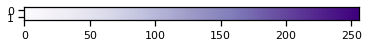

In [78]:
target_protein = 1
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = [17, '14-19', '50-59', 51, 55, 76, 79, 80, 83, 84, 87, 125, 126, 129, 
                         '130-140', 134, 135, '209-220', '212-221', 
                         215, 223, 226, 247, 250, 251, 254, 257, 261, 262, 299, 300, 303, 306, 
                         113, 114, 117, 118, 121, 122, 125, 181, 186, 
                         187, 188, 189, 191, 207, 208, 211, 212, 261, 
                         265, 268, 269, 292, 293, 295, 296, 17, 135, 215, 216]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['R135W', 'R135L', 'T17K', 'T17M', 'P215L']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

Q2_ligand_binding_pocket = ['N55K', 'M216R', ]
Q2_ligand_binding_pocket = [res[1:-1] for res in Q2_ligand_binding_pocket]
Q2_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q2_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
pdbs = ['1U19', '6tha']
logger.info(pdbs[0])
view = nv.show_pdbid(pdbs[0], gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A and not (164-179)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (1-105 164-180)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f":A and RET", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and RET", colorValue='#4d004b', opacity=0.25, wireframe=True)
    
#view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)

ligand_binding_pocket_new = ['G114', 'G121', 'E181', 'G188', 'M207', 'H211']
ligand_binding_pocket_new = " ".join([str(ins1[1:]) for ins1 in list(set(ligand_binding_pocket_new))])
Gt_activation = ['T17']
Gt_activation = " ".join([str(ins1[1:]) for ins1 in list(set(Gt_activation))])
DRY = ['R135']
DRY = " ".join([str(ins1[1:]) for ins1 in list(set(DRY))])
PIF = ['P215', 'M216']
PIF = " ".join([str(ins1[1:]) for ins1 in list(set(PIF))])
logger.info(ligand_binding_pocket)
view.add_licorice(selection=f":A and ({ligand_binding_pocket_new})", colorValue='#007526', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({ligand_binding_pocket_new})", radiusScale=2.5, color='#007526', zOffset=5)
view.add_licorice(selection=f":A and ({Gt_activation})", colorValue='violet', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Gt_activation})", radiusScale=2.5, color='violet', zOffset=5)
view.add_licorice(selection=f":A and ({DRY})", colorValue='pink', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({DRY})", radiusScale=2.5, color='pink', zOffset=5)
view.add_licorice(selection=f":A and ({PIF})", colorValue='#6000e3', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({PIF})", name='PIF', radiusScale=2.5, color='#6000e3', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)
logger.info(ligand_binding_pocket_res)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:211
INFO:NPC1
INFO:5u74
INFO:[26, 30, 76, 80, 83, 133, 134, 137, 138, 141, 142, 160, 161, 164, 165, 168, 279, 282, 283, 287, 288, 291, 292, 317, 321, 379, 380, '383-385', 387, 388, 392, 404, 405, '407-409', 411, 412, 415, '91-93', 143, 209, 210, 213]


NGLWidget()

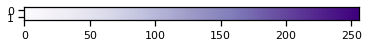

In [79]:
target_protein = 0
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = [26, 30, 76, 80, 83, 133, 134, 137, 138, 141, 142, 160, 161, 164, 165, 168, 279, 282, 283, 287, 288, 291, 292, 317, 321, 
                         379, 380, '383-385', 387, 388, 392, 404, 405, '407-409', 411, 412, 415, '91-93', 143, 209, 210, 213]
#ligand_binding_pocket = ['84-93', '325-334']
#ligand_binding_pocket = ['208-212', '453-457']
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['P0S']
Q1_ligand_binding_pocket = ['P211S']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

Q2_ligand_binding_pocket = ['R92W', 'R93W', 'V328L', 'R333W', 'R333Q']
Q2_ligand_binding_pocket = ['R212H', 'R212C']
Q2_ligand_binding_pocket = [res[1:-1] for res in Q2_ligand_binding_pocket]
Q2_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q2_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
pdbs = ['1U19', '6tha']

view = nv.show_pdbid(pdbs[1], gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A and not (250-265)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (1-105 164-180)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f":A and (P33)", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and (P33)", colorValue='#4d004b', opacity=0.25, wireframe=True)
view.add_licorice(selection=f":A and (CL)", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and (CL)", colorValue='#4d004b', opacity=0.25, wireframe=True)
    
# view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
# view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
# view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
# view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)

P33_ligand_binding_pocket_new = ['G134', 'Q161', 'Q283', 'I287', 'P383',]
P33_ligand_binding_pocket_new = " ".join([str(ins1[1:]) for ins1 in list(set(P33_ligand_binding_pocket_new))])
chloride_binding_pocket_new = ['R92', 'R93', ]
chloride_binding_pocket_new = " ".join([str(ins1[1:]) for ins1 in list(set(chloride_binding_pocket_new))])
ANdomain = ['R92', 'R93']
ANdomain = " ".join([str(ins1[1:]) for ins1 in list(set(ANdomain))])
ACdomain = ['V328', 'R333', ]
ACdomain = " ".join([str(ins1[1:]) for ins1 in list(set(ACdomain))])
SNdomain = ['P211', 'R212']
SNdomain = " ".join([str(ins1[1:]) for ins1 in list(set(SNdomain))])
logger.info(ligand_binding_pocket)
view.add_licorice(selection=f":A and ({P33_ligand_binding_pocket_new})", colorValue='#007526', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({P33_ligand_binding_pocket_new})", radiusScale=2.5, color='#007526', zOffset=5)
view.add_licorice(selection=f":A and ({chloride_binding_pocket_new})", colorValue='#00d846', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({chloride_binding_pocket_new})", radiusScale=2.5, color='#00d846', zOffset=5)
#view.add_licorice(selection=f":A and ({ANdomain})", colorValue='violet', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({ANdomain})", radiusScale=2.5, color='violet', zOffset=5)
#view.add_licorice(selection=f":A and ({ACdomain})", colorValue='pink', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({ACdomain})", radiusScale=2.5, color='pink', zOffset=5)
view.add_licorice(selection=f":A and ({SNdomain})", colorValue='#6000e3', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({SNdomain})", name='PIF', radiusScale=2.5, color='#6000e3', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


# Plot other (general) figures for paper

## fig1: stats

### distribution regions

In [80]:
%%time
stats_df = pd.read_csv(stats_file, header=[0,1])
print(stats_df.columns)
logger.info(f"Total number of variant annotations: {stats_df[('all', 'total')].sum()}")
logger.info(f"Total number of benign (ClinVar) variant annotations: {stats_df[('all', 'benign')].sum()}")
logger.info(f"Total number of pathogenic (ClinVar) variant annotations: {stats_df[('all', 'pathogenic')].sum()}")
logger.info(f"Total number of VUS (ClinVar) variant annotations: {stats_df[('all', 'VUS')].sum()}")
logger.info(f"Total number of conflict (ClinVar) variant annotations: {stats_df[('all', 'other')].sum()}")
logger.info(f"Total number of gnomAD variant annotations: {stats_df[('all', 'gnomad_total')].sum()}")
logger.info(f"Total number of unique gnomAD variant annotations: {stats_df[('all', 'gnomad_unique')].sum()}")
logger.info(f"Total number of variant annotations in TM region: {stats_df[('TRANSMEM', 'total')].sum()}")
logger.info(f"Total number of benign (ClinVar) variant annotations in TM region: {stats_df[('TRANSMEM', 'benign')].sum()}")
logger.info(f"Total number of pathogenic (ClinVar) variant annotations in TM region: {stats_df[('TRANSMEM', 'pathogenic')].sum()}")
logger.info(f"Total number of VUS (ClinVar) variant annotations in TM region: {stats_df[('TRANSMEM', 'VUS')].sum()}")
logger.info(f"Total number of conflict (ClinVar) variant annotations in TM region: {stats_df[('TRANSMEM', 'other')].sum()}")
logger.info(f"Total number of gnomAD variant annotations in TM region: {stats_df[('TRANSMEM', 'gnomad_total')].sum()}")
logger.info(f"Total number of unique gnomAD variant annotations in TM region: {stats_df[('TRANSMEM', 'gnomad_unique')].sum()}")
logger.info('#######################')
logger.info(f"all, total: {stats_df[('all', 'total')].sum()}")
logger.info(f"all, VUS: {stats_df[('all', 'VUS')].sum()}")
logger.info(f"all, benign: {stats_df[('all', 'benign')].sum()}")
logger.info(f"all, pathogenic: {stats_df[('all', 'pathogenic')].sum()}")
logger.info(f"all, other: {stats_df[('all', 'other')].sum()}")
logger.info(f"all, gnomad_total: {stats_df[('all', 'gnomad_total')].sum()}")
logger.info(f"all, gnomad_unique: {stats_df[('all', 'gnomad_unique')].sum()}")

logger.info(f"TRANSMEM, total: {stats_df[('TRANSMEM', 'total')].sum()}")
logger.info(f"TRANSMEM, VUS: {stats_df[('TRANSMEM', 'VUS')].sum()}")
logger.info(f"TRANSMEM, benign: {stats_df[('TRANSMEM', 'benign')].sum()}")
logger.info(f"TRANSMEM, pathogenic: {stats_df[('TRANSMEM', 'pathogenic')].sum()}")
logger.info(f"TRANSMEM, other: {stats_df[('TRANSMEM', 'other')].sum()}")
logger.info(f"TRANSMEM, gnomad_total: {stats_df[('TRANSMEM', 'gnomad_total')].sum()}")
logger.info(f"TRANSMEM, gnomad_unique: {stats_df[('TRANSMEM', 'gnomad_unique')].sum()}")

logger.info(f"Extracellular, total: {stats_df[('Extracellular', 'total')].sum()}")
logger.info(f"Extracellular, VUS: {stats_df[('Extracellular', 'VUS')].sum()}")
logger.info(f"Extracellular, benign: {stats_df[('Extracellular', 'benign')].sum()}")
logger.info(f"Extracellular, pathogenic: {stats_df[('Extracellular', 'pathogenic')].sum()}")
logger.info(f"Extracellular, other: {stats_df[('Extracellular', 'other')].sum()}")
logger.info(f"Extracellular, gnomad_total: {stats_df[('Extracellular', 'gnomad_total')].sum()}")
logger.info(f"Extracellular, gnomad_unique: {stats_df[('Extracellular', 'gnomad_unique')].sum()}")

logger.info(f"Cytoplasmic, total: {stats_df[('Cytoplasmic', 'total')].sum()}")
logger.info(f"Cytoplasmic, VUS: {stats_df[('Cytoplasmic', 'VUS')].sum()}")
logger.info(f"Cytoplasmic, benign: {stats_df[('Cytoplasmic', 'benign')].sum()}")
logger.info(f"Cytoplasmic, pathogenic: {stats_df[('Cytoplasmic', 'pathogenic')].sum()}")
logger.info(f"Cytoplasmic, other: {stats_df[('Cytoplasmic', 'other')].sum()}")
logger.info(f"Cytoplasmic, gnomad_total: {stats_df[('Cytoplasmic', 'gnomad_total')].sum()}")
logger.info(f"Cytoplasmic, gnomad_unique: {stats_df[('Cytoplasmic', 'gnomad_unique')].sum()}")

logger.info(f"other, total: {stats_df[('other', 'total')].sum()}")
logger.info(f"other, VUS: {stats_df[('other', 'VUS')].sum()}")
logger.info(f"other, benign: {stats_df[('other', 'benign')].sum()}")
logger.info(f"other, pathogenic: {stats_df[('other', 'pathogenic')].sum()}")
logger.info(f"other, other: {stats_df[('other', 'other')].sum()}")
logger.info(f"other, gnomad_total: {stats_df[('other', 'gnomad_total')].sum()}")
logger.info(f"other, gnomad_unique: {stats_df[('other', 'gnomad_unique')].sum()}")
stats_df

INFO:Total number of variant annotations: 252388
INFO:Total number of benign (ClinVar) variant annotations: 1868
INFO:Total number of pathogenic (ClinVar) variant annotations: 3763
INFO:Total number of VUS (ClinVar) variant annotations: 15178
INFO:Total number of conflict (ClinVar) variant annotations: 1648
INFO:Total number of gnomAD variant annotations: 242348
INFO:Total number of unique gnomAD variant annotations: 229931
INFO:Total number of variant annotations in TM region: 21790
INFO:Total number of benign (ClinVar) variant annotations in TM region: 120
INFO:Total number of pathogenic (ClinVar) variant annotations in TM region: 626
INFO:Total number of VUS (ClinVar) variant annotations in TM region: 1401
INFO:Total number of conflict (ClinVar) variant annotations in TM region: 180
INFO:Total number of gnomAD variant annotations in TM region: 20575
INFO:Total number of unique gnomAD variant annotations in TM region: 19463
INFO:#######################
INFO:all, total: 252388
INFO:al

MultiIndex([(    'accession',            'ID'),
            (    'accession',          'name'),
            (    'accession',         'class'),
            (       'length',           'all'),
            (       'length',            'TM'),
            (      'general',   'Torben_list'),
            (      'general',      'MAVE/∆∆G'),
            (     'assembly',          'self'),
            (     'assembly',        'others'),
            (     'assembly',          'note'),
            (          'PDB',        'PDBids'),
            (          'all',         'total'),
            (          'all',           'VUS'),
            (          'all',        'benign'),
            (          'all',    'pathogenic'),
            (          'all',         'other'),
            (          'all',  'gnomad_total'),
            (          'all', 'gnomad_unique'),
            (     'TRANSMEM',         'total'),
            (     'TRANSMEM',           'VUS'),
            (     'TRANSMEM',        'be

accession               length           general          assembly  \
            ID   name class     all    TM Torben_list MAVE/∆∆G     self   
0       P51170  SCNNG   NaN   649.0  42.0       False      NaN      NaN   
1       Q96PX8  SLIK1   NaN   696.0  21.0       False      NaN      NaN   
2       P36897  TGFR1   NaN   503.0  21.0       False      NaN      NaN   
3       O75509  TNR21   NaN   655.0  21.0       False      NaN      NaN   
4       P28908   TNR8   NaN   595.0  21.0       False      NaN      NaN   
...        ...    ...   ...     ...   ...         ...      ...      ...   
1412    Q8TAB3  PCD19   NaN  1148.0  21.0       False      NaN      NaN   
1413    O43665  RGS10   NaN     NaN   NaN       False      NaN      NaN   
1414    P04843   RPN1   NaN   607.0  19.0       False      NaN      NaN   
1415    Q99442  SEC62   NaN   399.0  42.0       False      NaN      NaN   
1416    Q5W0Z9  ZDH20   NaN   365.0  87.0       False      NaN      NaN   

                  ...   Cytoplasmic other                              \
     others note  ... gnomad_unique total VUS benign pathogenic other   
0       NaN  NaN  ...             0     0   0      0          0     0   
1       NaN  NaN  ...             0     0   0      0          0     0   
2       NaN  NaN  ...            78     0   0      0          0     0   
3       NaN  NaN  ...            49     0   0      0          0     0   
4       NaN  NaN  ...             1     0   0      0          0     0   
...     ...  ...  ...           ...   ...  ..    ...        ...   ...   
1412    NaN  NaN  ...             1     0   0      0          0     0   
1413    NaN  NaN  ...             0     0   0      0          0     0   
1414    NaN  NaN  ...            73   257   0      0          0     0   
1415    NaN  NaN  ...            17     1   0      0          0     0   
1416    NaN  NaN  ...            84    15   0      0          0     0   

                                       MIM  \
     gnomad_total gnomad_unique Chromosome   
0               0             0      chr16   
1               0             0        NaN   
2               0             0       chr9   
3               0             0        NaN   
4               0             0        NaN   
...           ...           ...        ...   
1412            0             0       chrX   
1413            0             0        NaN   
1414          257           257        NaN   
1415            1             1        NaN   
1416           15            15        NaN   

                                                         
                                              Phenotype  
0     Bronchiectasis with or without elevated sweat ...  
1                                                   NaN  
2     Loeys-Dietz syndrome 1, 609192 (3), Autosomal ...  
3                                                   NaN  
4                                                   NaN  
...                                                 ...  
1412  Developmental and epileptic encephalopathy 9, ...  
1413                                                NaN  
1414                                                NaN  
1415                                                NaN  
1416                                                NaN  

[1417 rows x 48 columns]

### loading dataset groups

In [81]:
%%time
analysis_df_base2 = pd.read_csv(csv_file_all_merged_edited, low_memory=False)

logger.info(f"0: MP: {len(analysis_df_base2['accession'].unique())}")
logger.info(f"0: MP: {len(analysis_df_base2['variant'])}")

gnomad = analysis_df_base2.copy()
gnomad = gnomad.dropna(how='any', subset=['gnomad;AF_tot_all']).reset_index(drop=True)

clinvar = analysis_df_base2.copy()
clinvar = clinvar.dropna(how='any', subset=['clinvar;significance_all']).reset_index(drop=True)

clinvar_benign = clinvar.copy()
clinvar_benign = clinvar_benign.loc[(clinvar_benign['clinvar;significance_all']=='benign')].reset_index(drop=True)

clinvar_pathogenic = clinvar.copy()
clinvar_pathogenic = clinvar_pathogenic.loc[(clinvar_pathogenic['clinvar;significance_all']=='pathogenic')].reset_index(drop=True)

TM_range = ['TRANSMEM', 'Mitochondrial_intermembrane', 'INTRAMEM', 'INTRAMEM|TRANSMEM']
other_range = ['TRANSMEM', 'Mitochondrial_intermembrane', 'INTRAMEM', 'INTRAMEM|TRANSMEM', 'Extracellular', 'Cytoplasmic']

anno = analysis_df_base2.copy()
anno = anno.dropna(how='all', subset=['gnomad;AF_tot_all', 'clinvar;significance_all']).reset_index(drop=True)

anno_TM = anno.copy()
anno_TM = anno_TM.loc[(anno_TM['uniprot;regions_all'].isin(TM_range))].reset_index(drop=True)



INFO:0: MP: 5442
INFO:0: MP: 1861282


CPU times: user 13min 12s, sys: 3min 36s, total: 16min 49s
Wall time: 16min 31s


### distribution plot

In [ ]:
%%time
all_df_sub = []
sub_ana_var2 = analysis_df_base2.copy()
sub_ana_var2 = sub_ana_var2.dropna(how='any', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
sub_ana_var2['regions'] = 'all'
all_df_sub.append(sub_ana_var2[['gnomad;AF_tot_all', 'regions', 'clinvar;significance_all',]])
sub_ana_var2 = clinvar_benign.copy()
sub_ana_var2 = sub_ana_var2[~sub_ana_var2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
sub_ana_var2['regions'] = 'benign'
all_df_sub.append(sub_ana_var2[['gnomad;AF_tot_all', 'regions', 'clinvar;significance_all',]])
sub_ana_var2 = clinvar_pathogenic.copy()
sub_ana_var2 = sub_ana_var2[~sub_ana_var2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
sub_ana_var2['regions'] = 'pathogenic'
all_df_sub.append(sub_ana_var2[['gnomad;AF_tot_all', 'regions', 'clinvar;significance_all',]])

sub_ana_var2 = anno_TM.copy()
TM_range = ['TRANSMEM', 'Mitochondrial_intermembrane', 'INTRAMEM', 'INTRAMEM|TRANSMEM']
sub_ana_var2 = sub_ana_var2[~sub_ana_var2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
sub_ana_var2 = sub_ana_var2.loc[sub_ana_var2['uniprot;regions_all'].isin(TM_range)].reset_index(drop=True)
sub_ana_var2['regions'] = 'transmembrane'
all_df_sub.append(sub_ana_var2[['gnomad;AF_tot_all', 'regions', 'clinvar;significance_all',]])
logger.info('here')

sub_ana_var = pd.concat(all_df_sub)
sub_ana_var['gnomad;AF_tot_first'] = sub_ana_var["gnomad;AF_tot_all"].apply(lambda x: float(x))
sub_ana_var = sub_ana_var.sort_values(['regions'], ascending=[1])
sub_ana_var = sub_ana_var[['gnomad;AF_tot_first', 'regions', 'clinvar;significance_all',]]

print(sub_ana_var['gnomad;AF_tot_first'].describe())
sub_ana_var['gnomad_log'] = np.log10(sub_ana_var['gnomad;AF_tot_first'])
sub_ana_var.replace([np.inf, -np.inf], np.nan, inplace=True)
sub_ana_var = sub_ana_var.dropna(subset=['gnomad;AF_tot_first', 'gnomad_log'])
print(sub_ana_var['gnomad_log'].describe())
print(sub_ana_var['gnomad;AF_tot_first'].describe())

sorter = ['all', 'transmembrane', 'benign', 'pathogenic']
sub_ana_var['regions'] = sub_ana_var['regions'].astype("category")
sub_ana_var['regions'].cat.set_categories(sorter, inplace=True)
sub_ana_var = sub_ana_var.sort_values(["regions"])


INFO:['benign', 'pathogenic']
Categories (2, object): ['benign', 'pathogenic']


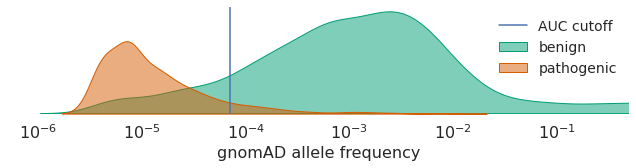

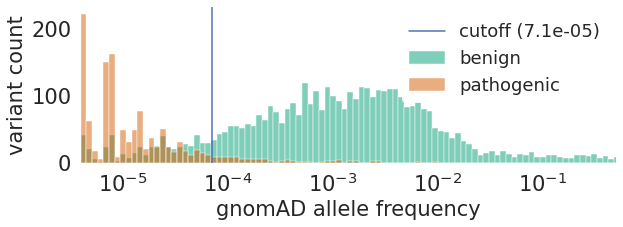

INFO:all


In [83]:
tmps = sub_ana_var.copy()
tmps = tmps.loc[tmps['regions'].isin(['benign', 'pathogenic'])].reset_index(drop=True)
logger.info(tmps['regions'].unique())
f = plt.figure(figsize=(9,2.5))
with sns.axes_style("white"):
    sns.set_theme(style="white", rc={"axes.facecolor": (1, 1, 1, 1), 'axes.linewidth':0})
    g = sns.kdeplot( x=tmps['gnomad;AF_tot_first'], fill=True, alpha=0.5, log_scale=10, hue=tmps['regions'], 
                hue_order=['pathogenic', 'benign', ], palette=sns.color_palette(['#D55C00', '#009E74', ]),
               )
    g.set_xlim(5e-7, 5e-1)
    g.set_xlabel('gnomAD allele frequency')
    g.set_ylabel('')
    sns.set(font_scale=1.0)
    g.set(yticks=[], xlabel="gnomAD allele frequency", )
    g.yaxis.label.set_size(16)
    g.xaxis.label.set_size(16)
    for tick in g.xaxis.get_minor_ticks(): 
        tick.label.set_fontsize(16)

    plt.xticks(fontsize=16)
    plt.yticks(fontsize=12)
    g.axvline(7.097735196763732e-05)

    plt.legend(title='', labels=['AUC cutoff', 'benign', 'pathogenic'], fontsize=14, fancybox=True, facecolor='white', edgecolor='white')
    plt.tight_layout()
    plt.show()
    
    
f = plt.figure(figsize=(9,3.5))
fontsize = 21
with sns.axes_style("white"):
    sns.set_theme(style="white", rc={"axes.facecolor": (1, 1, 1, 1), 'axes.linewidth':0})
    g = sns.histplot(data=tmps, x='gnomad;AF_tot_first', log_scale=10, hue='regions', bins=100,
                 palette=sns.color_palette(['#D55C00', '#009E74', ]), hue_order=['pathogenic','benign', ], )
    g.set_xlim(4e-6, 5e-1)
    g.set_xlabel('gnomAD allele frequency')
    g.set_ylabel('variant count')
    sns.set(font_scale=1.5)
    g.yaxis.label.set_size(fontsize)
    g.xaxis.label.set_size(fontsize)
    for tick in g.xaxis.get_minor_ticks(): 
        tick.label.set_fontsize(fontsize)

    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    g.axvline(7.097735196763732e-05)

    plt.legend(title='', labels=['cutoff (7.1e-05)', 'benign', 'pathogenic'], fontsize=fontsize-3, fancybox=True, facecolor='white', edgecolor='white')
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir,'FigSXX1B.svg'))
    plt.show()    

logger.info(region)

### gnomad cutoff

In [84]:
gnomad_cutoff = clinvar.copy()
gnomad_cutoff = gnomad_cutoff.dropna(how='any', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
gnomad_cutoff = gnomad_cutoff.loc[(gnomad_cutoff['clinvar;significance_all'].isin(['pathogenic', 'benign']))].reset_index(drop=True)
gnomad_cutoff = gnomad_cutoff[~gnomad_cutoff["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
gnomad_cutoff['gnomad;AF_tot_first'] = gnomad_cutoff["gnomad;AF_tot_all"].apply(lambda x: float(x))
gnomad_cutoff = gnomad_cutoff[~gnomad_cutoff["gnomad;AF_tot_first"].isna()].reset_index(drop=True)

len(gnomad_cutoff['variant'])

5596

INFO:groupA: 1208
groupB: 4388


Ensemble test roc-auc:0.9480065289440799


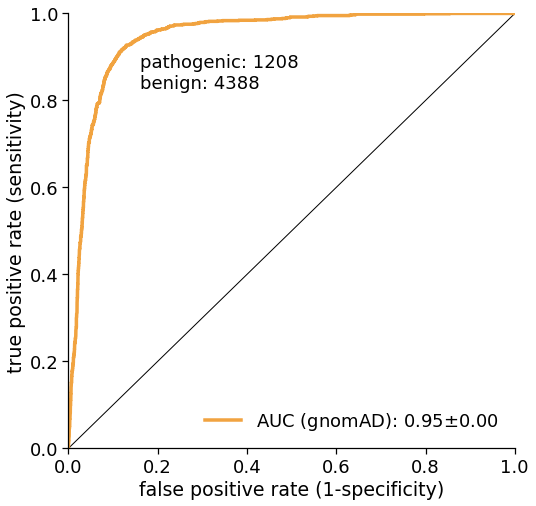

CPU times: user 33.1 s, sys: 993 ms, total: 34.1 s
Wall time: 33.8 s


In [85]:
%%time
all_tmp = []
all_aucs = {}
all_vals_cat = {}

all_tmp = gnomad_cutoff.copy()
for region in ['all']:
    tmp2 = all_tmp.copy()
    if region != 'all':
        tmp2 = tmp2[(tmp2['uniprot;regions_all']==region)].reset_index(drop=True)

    control_df = tmp2.copy()
    control_df['label_class_raw'] = control_df[['clinvar;significance_all', 'gnomad;AF_tot_first']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    control_df['score'] = control_df['label_class_raw'].apply(lambda x: clinvar_class_anno5(x))
    control_df['gnomad;AF_tot_first'] = control_df['gnomad;AF_tot_first']*(-1)
    control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
    control_score = np.copy(control_df['score'].values)

    if len(list(set(control_score))) > 1:
        test_score1 = control_df['gnomad;AF_tot_first'].values
        groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
        groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
        if region == 'all':
            auc_dici = disease_ROC_adapted_gnomad(control_df, control_score, test_score1, groupA=groupA, groupB=groupB, nameA='gnomad;AF_tot_first')                 


## Make plot about Rosetta statistics

### own benchmark

In [86]:
sm_corr_df = pd.read_csv(sm_corr_dfs_csv)
sm_corr_df

,rosetta;benchmark_01,rosetta;relaxes_01,rosetta;ddG_protocols_01,rosetta;sfxns_01,pearson,pearson_mse,spearman,spearman_mse,kendall,kendall_mse,count
0,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.322643,0.002401,0.447156,0.002113,0.310124,0.001250,330
1,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.294973,0.003500,0.443171,0.001707,0.307243,0.001299,272
2,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.290226,0.004438,0.415021,0.002754,0.280994,0.001083,272
3,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.286420,0.004958,0.445728,0.003056,0.313410,0.001594,272
4,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.324218,0.003680,0.474197,0.002156,0.336417,0.001211,272
...,...,...,...,...,...,...,...,...,...,...,...
135,benchmark_8,const_relax_mp,cart_prot,f19_cart,0.338621,0.002604,0.455463,0.001945,0.315081,0.000993,330
136,benchmark_8,const_relax_mp,cart_prot,f19_cart,0.324879,0.002532,0.447238,0.001921,0.309043,0.000928,330
137,benchmark_8,const_relax_mp,cart_prot,f19_cart,0.347022,0.003063,0.472788,0.002004,0.329594,0.001168,330
138,benchmark_8,const_relax_mp,cart_prot,f19_cart,0.348822,0.002995,0.468504,0.001998,0.323065,0.001133,330


In [87]:
for x in sm_corr_df['rosetta;relaxes_01'].unique():
    for y in sm_corr_df['rosetta;ddG_protocols_01'].unique():
        z= 'f19_cart'
        tmp_df = sm_corr_df.copy()
        f = tmp_df.loc[((tmp_df['rosetta;relaxes_01']==x) & (tmp_df['rosetta;ddG_protocols_01']==y) & (tmp_df['rosetta;sfxns_01']==z)), 'spearman'].mean()
        if str(f)!='nan':
            logger.info(f"{x}, {y}, {z}: {f}")
        

INFO:const_relax_mp, cart_prot, f19_cart: 0.46315418918791423


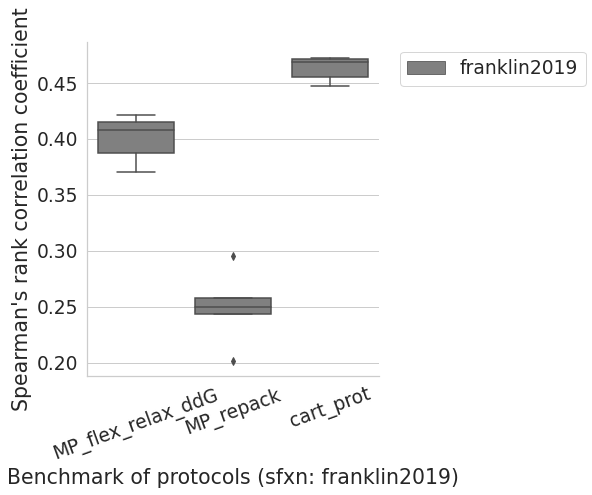

In [88]:
with sns.axes_style("white"):
    sns.set(font_scale=1.7)
    sns.set_style("whitegrid")
    palette = sns.color_palette(["grey"],)
    
    benchmark = 'benchmark_8'
    tmp_df = sm_corr_df.copy()
    tmp_df.loc[(tmp_df['rosetta;sfxns_01']=='f19_cart'), 'rosetta;sfxns_01'] = 'franklin2019'
    tmp_df = tmp_df[tmp_df['rosetta;sfxns_01']=='franklin2019'].reset_index(drop=True)
    tmp_df = tmp_df[tmp_df['rosetta;relaxes_01']=='const_relax_mp'].reset_index(drop=True)

    g = sns.catplot(data=tmp_df, y='spearman', hue='rosetta;sfxns_01',
                    x='rosetta;ddG_protocols_01', kind='box', height=6, aspect=0.95, palette=palette, legend=False,)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    plt.xlabel('Benchmark of protocols (sfxn: franklin2019)')
    plt.ylabel("Spearman's rank correlation coefficient")
    plt.xticks(rotation=20)
    filename = os.path.join(plots_dir, f'Figsuppl_methods_own-spearman_2.svg')
    plt.savefig(filename)
    plt.show()

### rep-sci online benchmark

In [89]:
rosetta_sci_bench_stats = pd.read_csv(rosetta_sci_bench_csv)
rosetta_sci_bench_stats['cartesian'] = rosetta_sci_bench_stats['sfxn'].apply(lambda x: True if len(x.split('_'))==4 else False)
rosetta_sci_bench_stats['sfxn'] = rosetta_sci_bench_stats['sfxn'].apply(lambda x: x.split('_')[1])
rosetta_sci_bench_stats


,sfxn,date,dataset,pearson,slope,intercept,spearman,pval,cartesian
0,franklin2019,2021-07-18 05:37:35,1py6_all,0.038,0.380,1.048,-0.049,0.651,False
1,franklin2019,2021-07-18 05:37:35,1py6_ref1,-0.826,-2.748,1.251,-0.500,0.667,False
2,franklin2019,2021-07-18 05:37:35,1py6_ref2,-0.050,-0.409,1.429,-0.147,0.493,False
3,franklin2019,2021-07-18 05:37:35,1py6_ref3,0.084,0.818,-4.391,-0.069,0.798,False
4,franklin2019,2021-07-18 05:37:35,1py6_ref4,0.104,0.716,0.821,0.232,0.658,False
...,...,...,...,...,...,...,...,...,...
131,ref2015,2021-07-29 20:34:48,2xov_all,0.494,3.451,2.683,0.425,0.000,True
132,ref2015,2021-07-29 20:34:48,2xov_ref1,0.742,6.658,-0.621,0.847,0.000,True
133,ref2015,2021-07-29 20:34:48,2xov_ref2,0.439,2.758,3.531,0.349,0.003,True
134,ref2015,2021-07-29 20:34:48,2xov_ref3,-0.747,-5.469,5.025,-0.500,0.667,True


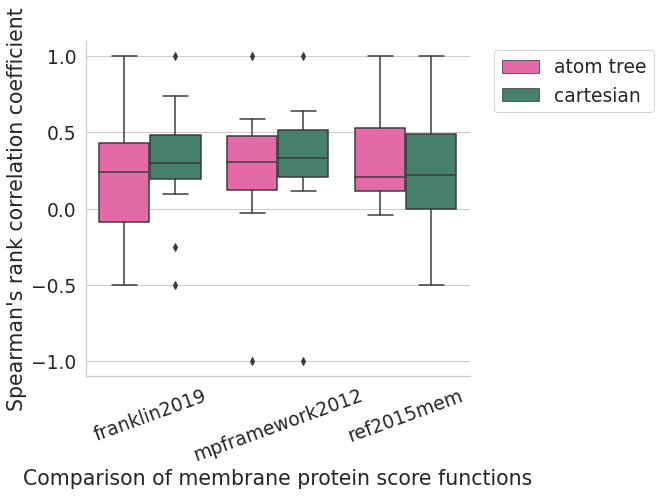

In [90]:
tmpi_plot_df = rosetta_sci_bench_stats.copy()
exclude = []#['1py6_ref1', '1py6_ref6', '2xov_ref3', ] 
tmpi_plot_df = tmpi_plot_df.loc[~tmpi_plot_df['dataset'].isin(exclude)].reset_index(drop=True)
tmpi_plot_df = tmpi_plot_df.loc[tmpi_plot_df['dataset']!='all'].reset_index(drop=True)
tmpi_plot_df.loc[tmpi_plot_df['cartesian']==True, 'cartesian'] = 'cartesian'
tmpi_plot_df.loc[tmpi_plot_df['cartesian']==False, 'cartesian'] = 'atom tree'
tmpi_plot_df = tmpi_plot_df.loc[tmpi_plot_df['sfxn']!='ref2015'].reset_index(drop=True)

with sns.axes_style("white"):
    sns.set(font_scale=1.7)
    sns.set_style("whitegrid")
    palette = sns.color_palette(['#F756A4', '#3D8971'],)
    g = sns.catplot(data=tmpi_plot_df, y='spearman', hue='cartesian', 
                        x="sfxn", kind='box', height=6, aspect=1.2, palette=palette, legend=False,)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    plt.xlabel('Comparison of membrane protein score functions')
    plt.ylabel("Spearman's rank correlation coefficient")
    plt.xticks(rotation=20)
    filename = os.path.join(plots_dir, f'Figsuppl_methods_db-spearman_2.svg')
    plt.savefig(filename, )
    plt.show()